In [1]:
import requests
import re
from pathlib import Path
import pandas as pd
import numpy as np
from pandas.tseries.offsets import DateOffset
from change_detection import functions as chg
from IPython.display import Markdown, display, Image, HTML, JSON
import matplotlib.pyplot as plt

# %matplotlib inline


DATA_FOLDER = Path("data/ccg_data_")
GITHUB_API_URL = 'https://api.github.com'
REPO_OWNER = 'ebmdatalab'
REPO_NAME = 'openprescribing'
PATH = 'openprescribing/measure_definitions'
CONTENT_URL = f'{GITHUB_API_URL}/repos/{REPO_OWNER}/{REPO_NAME}/contents/{PATH}'

In [2]:
def fetch_from_url(url):
    """Fetch the content from a given URL."""
    try:
        response = requests.get(url)
        response.raise_for_status()
        return response.json()
    except requests.RequestException as e:
        print(f"Error fetching data from {url}: {e}")
        return None

def filter_json_files(file_list):
    """Filter files to only include those with a .json extension."""
    return [f for f in file_list if f['name'].endswith('.json')]

def extract_measure_names(file_list):
    """Extract measure names from a list of files."""
    measure_names = {}
    for file in file_list:
        name = file['name'].replace('.json', '')
        content_url = file['download_url']
        content_data = fetch_from_url(content_url)
        if content_data:
            measure_name = content_data.get('name', '')
            measure_names[name] = measure_name
    return measure_names

def cache_data(df, cache_path):
    """Cache the data to a CSV file."""
    df.to_csv(cache_path, index=False)

def load_cache(cache_path):
    """Load cached data from a CSV file if it exists."""
    if cache_path.exists():
        return pd.read_csv(cache_path)
    return None

def get_measures_info(url, use_cache=True):
    """Get measure information from a given URL with optional caching."""
    measure_cache_path = DATA_FOLDER / "measure_info_cache.csv"
    
    if use_cache:
        cached_data = load_cache(measure_cache_path)
        if cached_data is not None:
            return cached_data

    file_list = fetch_from_url(url)
    if not file_list:
        return pd.DataFrame()

    filtered_files = filter_json_files(file_list)
    measure_names = extract_measure_names(filtered_files)

    name_df = pd.DataFrame.from_dict(measure_names, orient='index', columns=['name'])
    name_df = name_df.reset_index()
    name_df.columns = ["measure_name", "name"]

    cache_data(name_df, measure_cache_path)

    return name_df

def compute_deciles(measure_table, groupby_col, values_col, has_outer_percentiles=False):
    """
    Computes deciles.

    Args:
        measure_table (pd.DataFrame): A measure table.
        groupby_col (str): The name of the column to group by.
        values_col (str): The name of the column for which deciles are computed.
        has_outer_percentiles (bool, optional): Whether to compute the nine largest and nine smallest
            percentiles as well as the deciles. Defaults to False.

    Returns:
        pd.DataFrame: A data frame with `groupby_col`, `values_col`, and `percentile` columns.
    """
    
    quantiles = np.linspace(0.1, 0.9, 9)
    
    if has_outer_percentiles:
        lower_percentiles = np.linspace(0.01, 0.09, 9)
        upper_percentiles = np.linspace(0.91, 0.99, 9)
        quantiles = np.concatenate([lower_percentiles, quantiles, upper_percentiles])
    
    percentiles = (
        measure_table.groupby(groupby_col)[values_col]
        .quantile(quantiles)
        .reset_index()
    )
    
    percentiles["percentile"] = (percentiles["level_1"] * 100).astype(int)
    percentiles = percentiles[[groupby_col, "percentile", values_col]]
    
    return percentiles

def add_vline(ax, x_index, **kwargs):
    """Add a vertical line to the axes."""
    ax.axvline(x=x_index, **kwargs)
    return ax

def plot_percentiles(ax, deciles_lidocaine):
    """Plot percentiles on the given axes."""
    linestyles = {
        "decile": {"line": "b--", "linewidth": 1, "label": "Decile"},
        "median": {"line": "b-", "linewidth": 1.5, "label": "Median"},
        "percentile": {"line": "b:", "linewidth": 0.8, "label": "1st-9th, 91st-99th percentile"},
    }
    label_seen = []

    for percentile in range(1, 100):
        data = deciles_lidocaine[deciles_lidocaine["percentile"] == percentile]
        style = linestyles["median"] if percentile == 50 else linestyles["decile"]
        label = style["label"] if percentile == 50 or "decile" not in label_seen else "_nolegend_"
        if "decile" not in label_seen and percentile != 50:
            label_seen.append("decile")
        ax.plot(data["month"], data["rate"], style["line"], linewidth=style["linewidth"], label=label)

def plot_org_data(org, data_lidocaine, deciles_lidocaine, cd_data_lidocaine, show_cd=True):
    """Plot data for an organization along with deciles, medians, and change detection."""
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Plot percentiles
    plot_percentiles(ax, deciles_lidocaine)
    
    # Plot organization data
    df_subset = data_lidocaine[data_lidocaine["code"] == org]
    df_subset = df_subset.sort_values(by="month")
    ax.plot(df_subset["month"], df_subset["rate"], linewidth=2, color="red", label="Organisation Rate")
    
    # Plot change detection data if requested
    if show_cd:
        cd_data_subset = cd_data_lidocaine[cd_data_lidocaine["name"] == org]
        initial_level, final_level, prop, drop_period = cd_data_subset.iloc[0][
            ["is.intlev.initlev", "is.intlev.finallev", "is.intlev.levdprop", "is.tfirst.big"]
        ]
        dates = df_subset["month"].sort_values()
        add_vline(ax, dates.iloc[int(drop_period)], color='green', linestyle='--', label="Change detected")
        ax.axhline(y=initial_level, color='orange', label='_nolegend_')
        ax.axhline(y=final_level, color='orange', label='_nolegend_')
        ax.fill_between(dates, initial_level, final_level, color='orange', alpha=0.5, label="Detected Change")
        print(f"Measured % change: {round(prop * 100, 1)}%")

    ax.set_ylabel('Rate', size=18)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.grid(True)
    ax.tick_params(labelsize=16)
    ax.legend(fontsize=14)
    ax.margins(x=0)
    plt.tight_layout()
    plt.show()
    plt.close(fig)


In [3]:
DEFAULT_CONFIG = {
    'show_cd': True,
    'show_filter_results': True,
    'goes_down': True,
    'goes_down_threshold': 0,
    'drop_starts_high': True,
    'drop_starts_high_quantile': 0.9,
    'drop_ends_high': True,
    'drop_ends_high_quantile': 0.9,
    'apply_high_filter': True,
    'apply_mean_difference_filter': True,
    'mean_difference_threshold': 0.4,
    'apply_zero_filter': True,
    'apply_mean_events_filter': True,
    'mean_events_threshold': 0,
    'top_x': 5
}


class DataFrameProcessor:
    def __init__(self, df_main, df_secondary, config=None, verbose=False):
        self.df_main = df_main.sort_values(by="month", ascending=True)
        self.df_secondary = df_secondary
        self.config = DEFAULT_CONFIG.copy()
        if config:
            self.config.update(config)    
        self.verbose = verbose
    
    def _apply_threshold_mask(self, column, threshold_key):
        threshold = self.config.get(threshold_key)
        return self.df_secondary[column] > threshold
    
    def _apply_quantile_threshold_mask(self, column, quantile_key):
        threshold = self.df_secondary[column].quantile(self.config.get(quantile_key))
        return self.df_secondary[column] < threshold

    
    def _print_before_after(self, mask, description):
        if self.verbose:
            print(f"{description} - Before: {self.df_secondary.shape[0]}")
        
        self.df_secondary = self.df_secondary[mask]
        
        if self.verbose:
            print(f"{description} - After: {self.df_secondary.shape[0]}")
            print('---------')
        return self
     
    def _goes_down_threshold(self):
        return self._print_before_after(self._apply_threshold_mask('is.intlev.levdprop', 'goes_down_threshold'), "CD: Decected proportional drop < threshold")
    
    def _drop_starts_high(self):
        return self._print_before_after(self._apply_quantile_threshold_mask('is.intlev.initlev', 'drop_starts_high_quantile'), "CD: Detected change initial level > threshold (quantile)")
    
    def _drop_ends_high(self):
        return self._print_before_after(self._apply_quantile_threshold_mask('is.intlev.finallev', 'drop_ends_high_quantile'), "CD: Detected change final level > threshold (quantile)")
    
    def _get_filtered_df(self):
        if self.config.get('goes_down', False):
            self._goes_down_threshold()
        if self.config.get('drop_starts_high', False):
            self._drop_starts_high()
        if self.config.get('drop_ends_high', False):
            self._drop_ends_high()
        return self.df_secondary
        
    
    def _compute_mean_for_series_slice(self, series, start=None, end=None):
        """Compute the mean for a slice of a series."""
        return series.iloc[start:end].mean()

    def _has_high_percentiles(self, series):
        first_six_mean = self._compute_mean_for_series_slice(series, end=6)
        last_six_mean = self._compute_mean_for_series_slice(series, start=-6)
        return ((first_six_mean > 0.8) & (last_six_mean > 0.8))

    def _mean_difference(self, series):
        first_six_mean = self._compute_mean_for_series_slice(series, end=6)
        last_six_mean = self._compute_mean_for_series_slice(series, start=-6)
        return last_six_mean - first_six_mean

    def _goes_to_zero(self, series):
        last_six_mean = self._compute_mean_for_series_slice(series, start=-6)
        return last_six_mean == 0

    def _mean_events(self, series):
        return self._compute_mean_for_series_slice(series)


    def _get_orgs_not_remaining_high(self):
        remains_high = self.df_main.groupby('code')['percentile'].transform(self._has_high_percentiles)
        return set(self.df_main[remains_high]['code'])

    def _get_mean_differences(self):
        return self.df_main.groupby('code')['percentile'].transform(self._mean_difference)
    
    def _get_mean_events(self):
        return self.df_main.groupby('code')['numerator'].transform(self._mean_events)
    
    def _get_orgs_not_going_to_zero(self):
        goes_to_zero = self.df_main.groupby('code')['rate'].transform(self._goes_to_zero)
        return set(self.df_main[goes_to_zero]['code'])


    def _filter_orgs(self, orgs):
        """Filter out orgs that don't remain high."""
        orgs_not_remaining_high = self._get_orgs_not_remaining_high()
        return [org for org in orgs if org not in orgs_not_remaining_high]
    
    def _filter_orgs_by_mean_difference(self, orgs, threshold=0):
        """Filter orgs based on mean differences greater than the given threshold."""
        mean_diffs = self._get_mean_differences()
  
        valid_orgs = self.df_main.loc[mean_diffs < -abs(threshold), 'code'].unique()
        return [org for org in orgs if org in valid_orgs]
    
    def _filter_orgs_going_to_zero(self, orgs):
        orgs_not_going_to_zero = self._get_orgs_not_going_to_zero()
        return [org for org in orgs if org not in orgs_not_going_to_zero]
    
    def _filter_orgs_by_low_events(self, orgs, threshold=100):
        """Filter orgs based on mean differences greater than the given threshold."""
        mean_events = self._get_mean_events()
  
        valid_orgs = self.df_main.loc[mean_events > threshold, 'code'].unique()
        return [org for org in orgs if org in valid_orgs]
    
    def _print_change_counts(self, initial_count, filtered_orgs, description):
        """Print the number of items before and after a filter is applied."""
        if self.verbose:
            print(f"{description} - Before: {initial_count}")
            print(f"{description} - After: {len(filtered_orgs)}")
            print('---------')

    def apply_combined_filters(self):
        """Apply configured filters to the list of orgs."""
        initial_count = len(self.df_secondary)
        self._get_filtered_df()
        
        filtered_orgs = self.df_secondary['name'].unique()

        if self.config.get('apply_high_filter', False):
            initial_count = len(filtered_orgs)
            filtered_orgs = self._filter_orgs(filtered_orgs)
            self._print_change_counts(initial_count, filtered_orgs, "Remains in high percentile")

        if self.config.get('apply_mean_difference_filter', False):
            threshold = self.config.get('mean_difference_threshold', 0)
            initial_count = len(filtered_orgs)
            filtered_orgs = self._filter_orgs_by_mean_difference(filtered_orgs, threshold)
            self._print_change_counts(initial_count, filtered_orgs, "Doesn't drop > percentile threshold")
        
        if self.config.get('apply_mean_events_filter', False):
            threshold = self.config.get('mean_events_threshold', 0)
            initial_count = len(filtered_orgs)
            filtered_orgs = self._filter_orgs_by_low_events(filtered_orgs, threshold)
            self._print_change_counts(initial_count, filtered_orgs, "Low average number of events")
            
        if self.config.get("apply_zero_filter", False):
            initial_count = len(filtered_orgs)
            filtered_orgs = self._filter_orgs_going_to_zero(filtered_orgs)
            self._print_change_counts(initial_count, filtered_orgs, "Drops to zero")
        
        # order by
        self.df_secondary = self.df_secondary.loc[self.df_secondary["name"].isin(filtered_orgs)]
      
        filtered_orgs = self.df_secondary['name'].unique().tolist()[:self.config.get("top_x")]
        
        return filtered_orgs

In [4]:
config = {
    'show_cd': False,
    'show_filter_results': False,
    'goes_down': True,
    'goes_down_threshold': 0.2,
    'drop_starts_high': True,
    'drop_starts_high_quantile': 0.8,
    'drop_ends_high': True,
    'drop_ends_high_quantile': 0.4,
    'apply_high_filter': True,
    'apply_mean_difference_filter': True,
    'mean_difference_threshold': 0.2,
    'apply_zero_filter': True,
    'apply_mean_events_filter': True,
    'mean_events_threshold': 20,
    'top_x': 5
}

In [5]:
ccg_names = pd.read_csv("data/ccg_names.csv")
measure_list = pd.read_csv(DATA_FOLDER / 'measure_list.csv', usecols=['table_id'])

measure_info = get_measures_info(CONTENT_URL)

measure_list = measure_list.merge(measure_info, how = 'left', left_on='table_id', right_on='ccg_data_' + measure_info['measure_name']) #merge with title names from JSON scraper
measures = [m.replace("ccg_data_", "") for m in measure_list["table_id"]]

# OpenPrescribing Improvement Radar

## What this tool does
This tool identifies sub-ICB locations (SICBLs) which have shown substantial improvement across each of our OpenPrescribing measures. The five SICBLs with the largest improvement are reported. We hope this will stimulate discussion with areas that have made effective changes so that successful strategies can be shared.

## How it works
We used trend indicator saturation to detect the timing and size of changes of SICBLs against all SICBLs in England. This prototype uses the current criteria to identify improvement:
* SICBLs needed to be in the highest 20% at the start of the change
* SICBLs needed to improve to the lowest 40% of SICBLs at the end of the change
* SICBLs needed to improve by at least 20 percentiles
* There needed to be at least 20 prescription items written

You can find more information on the trend indicator saturation methodology we use [here](https://www.bmj.com/content/367/bmj.l5205), including a podcast on our work with Professor Ben Goldacre.

## Interpretation notes
These pilot results are provided for the interest of advanced users, although we don't know how relevant they are in practice. There is substantial variation in prescribing behaviours, across various different areas of medicine. Some variation can be explained by demographic changes, or local policies or guidelines, but much of the remaining variation is less easy to explain.

We are keen to hear your feedback on this tool and how you use it. You can do this by emailing us at bennett@phc.ox.ac.uk. Please do not include patient identifiable information in your feedback.


# OpenPrescribing improvement detection

At OpenPrescribing we are piloting a number of data-driven approaches to identify unusual prescribing and collect feedback on this prescribing to inform 
                    development of new tools to support prescribers and organisations to audit and review prescribing. These pilot results are provided for the interest of advanced users, 
                    although we don't know how relevant they are in practice. There is substantial variation in prescribing behaviours, across various different areas of medicine. 
                    Some variation can be explained by demographic changes, or local policies or guidelines, but much of the remaining variation is less easy to explain.

The Bennett Institute is keen to hear your feedback on the results. You can do this by completing the following survey or emailing us at bennett@phc.ox.ac.uk. 
                    Please DO NOT INCLUDE IDENTIFIABLE PATIENT information in your feedback. All feedback is helpful, you can send short or detailed feedback.

This report has been designed to automatically detect where sub-ICB level organisations (SICBLs) have made significant improvements in their performance on OpenPrescribing.net's prescribing measures.
                    To do this we used trend indicator saturation to detect the timing and size of changes of SICBLs against all SICBLs in England.

This prototype uses the current criteria to identify improvement:

* SICBLs needed to be in the highest 20% at the start of the change

* SICBLs needed to improve to the lowest 40% of SICBLs at the end of the change

* SICBLs needed to improve by at least 20 percentiles

* There needed to be at least 20 prescription items written

This version is currently identifying a maximum of 5 SICBLs that have the largest improvement for each measure when compared to other organisations.
                    We hope this information is useful to our users, in order to stimulate discussion with SICBLs who have successful made changes, so that learning can be shared.
                    You can find more information of the trend indicator saturation methodology we use [here](https://www.bmj.com/content/367/bmj.l5205), including a podcast on our work with Professor Ben Goldacre.

## Table of Contents

<a href=#aafpercent>- Prescribing of Amino Acid Formula (AAF) and Extensively Hydrolysed Formula (EHF))</a>

<a href=#ace>- High-cost Angiotensin-Converting Enzyme (ACE) inhibitors</a>

<a href=#bdzadq>- Anxiolytics and Hypnotics: Average Daily Quantity per item</a>

<a href=#bdzper1000>- Anxiolytics and Hypnotics: Average Daily Quantity per 1000 patients</a>

<a href=#carbon_salbutamol>- Environmental impact of inhalers - average carbon footprint per salbutamol inhaler</a>

<a href=#cgm_sensors>- Prescribing of continuous glucose monitoring sensors</a>

<a href=#ciclosporin>- Ciclosporin and tacrolimus oral preparations prescribed generically</a>

<a href=#cmpaperpt>- Cost of milk formulae for Cow's Milk Protein Allergy (CMPA) per listed patients aged 0-4</a>

<a href=#coproxamol>- Co-proxamol</a>

<a href=#desogestrel>- Desogestrel prescribed as a branded product</a>

<a href=#diltiazem>- Diltiazem preparations (>60mg) prescribed generically</a>

<a href=#dipyridamole>- Prescribing of dipyridamole</a>

<a href=#doacs>- Direct Oral Anticoagulants (DOACs)</a>

<a href=#edoxaban>- Proportion of Direct Acting Oral Anticoagulants (DOACs) not prescribed as edoxaban</a>

<a href=#environmental_inhalers>- Environmental impact of inhalers - prescribing of non-salbutamol Metered Dose Inhalers (MDIs)</a>

<a href=#fungal>- Topical treatment of fungal nail infections</a>

<a href=#gabapentinoidsddd>- Prescribing of gabapentin and pregabalin (DDD)</a>

<a href=#glaucoma>- Glaucoma eye drops prescribed by brand</a>

<a href=#glutenfree>- Prescribing of gluten free products</a>

<a href=#icsdose>- High dose inhaled corticosteroids</a>

<a href=#injectable_antibiotics>- Antibiotic stewardship: Injectable preparations for the treatment of infection</a>

<a href=#keppra>- Levetiracetam prescribed as Keppra</a>

<a href=#ktt12_diabetes_insulin>- Long-acting insulin analogues (KTT12)</a>

<a href=#ktt13_nsaids_ibuprofen>- Non-preferred NSAIDs and COX-2 inhibitors (KTT13)</a>

<a href=#ktt9_antibiotics>- Antibiotic stewardship: volume of antibiotic prescribing (KTT9)</a>

<a href=#ktt9_cephalosporins>- Antibiotic stewardship: co-amoxiclav, cephalosporins & quinolones (KTT9)</a>

<a href=#ktt9_cephalosporins_star>- Antibiotic stewardship: co-amoxiclav, cephalosporins & quinolones (KTT9) prescribing volume</a>

<a href=#lpaliskiren>- NHS England Low Priority Treatment - Aliskiren</a>

<a href=#lpamiodarone>- NHS England Low Priority Treatment - Amiodarone</a>

<a href=#lpbathshoweremollients>- NHS England Low Priority Treatment - Bath and Shower emollients</a>

<a href=#lpcoprox>- NHS England Low Priority Treatment - co-proxamol</a>

<a href=#lpdosulepin>- NHS England Low Priority Treatment - dosulepin</a>

<a href=#lpdoxazosin>- NHS England Low Priority Treatment - doxazosin modified release</a>

<a href=#lpdronedarone>- NHS England Low Priority Treatment - Dronedarone</a>

<a href=#lpfentanylir>- NHS England Low Priority Treatment - fentanyl immediate release</a>

<a href=#lpglucosamine>- NHS England Low Priority Treatment - glucosamine and chondroitin</a>

<a href=#lpherbal>- NHS England Low Priority Treatment - herbal medicines</a>

<a href=#lphomeopathy>- NHS England Low Priority Treatment - homeopathy</a>

<a href=#lplidocaine>- NHS England Low Priority Treatment - lidocaine plasters</a>

<a href=#lpliothyronine>- NHS England Low Priority Treatment - liothyronine (including Armour Thyroid and liothyronine combination products)</a>

<a href=#lplutein>- NHS England Low Priority Treatment - lutein and antioxidants</a>

<a href=#lpminocycline>- NHS England Low Priority Treatment - Minocycline</a>

<a href=#lpneedles>- NHS England Low Priority Treatment - Higher Cost Insulin Pen Needles</a>

<a href=#lpomega3>- NHS England Low Priority Treatment - omega-3 fatty acid compounds</a>

<a href=#lpoxycodone>- NHS England Low Priority Treatment - oxycodone and naloxone combination product</a>

<a href=#lpperindopril>- NHS England Low Priority Treatment - perindopril arginine</a>

<a href=#lprubefacients>- NHS England Low Priority Treatment - rubefacients</a>

<a href=#lpsilkgarments>- NHS England Low Priority Treatment - Silk Garments</a>

<a href=#lptadalafil>- NHS England Low Priority Treatment - tadalafil once daily</a>

<a href=#lptramadolpara>- NHS England Low Priority Treatment - paracetamol and tramadol combination</a>

<a href=#lptravelvacs>- NHS England Low Priority Treatment - travel vaccines</a>

<a href=#lptrimipramine>- NHS England Low Priority Treatment - trimipramine</a>

<a href=#lpzomnibus>- NHS England Low Priority Treatment - All Low Priority Treatments</a>

<a href=#lyrica>- Pregabalin capsules prescribed as Lyrica</a>

<a href=#methotrexate>- Methotrexate 10 mg tablets </a>

<a href=#nimodipine>- Prescribing of nimodipine</a>

<a href=#opioidome>- Prescribing of opioids (total oral morphine equivalence)</a>

<a href=#opioidper1000>- High dose opioids per 1000 patients</a>

<a href=#opioidspercent>- High dose opioid items as percentage regular opioids</a>

<a href=#other_lipid_modifying_drugs>- Other lipid-modifying drugs</a>

<a href=#ppi>- High-cost PPIs</a>

<a href=#ppidose>- Higher dose Proton Pump Inhibitors (PPIs)</a>

<a href=#pregabalinmg>- Prescribing of pregabalin (total mg)</a>

<a href=#probiotics>- Probiotics that have been removed from the drug tariff</a>

<a href=#saba>- Short acting beta agonist inhalers</a>

<a href=#semagglutidequantity>- Possible excess quantities of semaglutide</a>

<a href=#seven_day_prescribing>- Seven Day Prescribing for Long Term Conditions</a>

<a href=#sildenafil>- High-cost drugs for erectile dysfunction</a>

<a href=#silver>- Silver dressings</a>

<a href=#solublepara>- Soluble/effervescent forms of paracetamol and co-codamol</a>

<a href=#statinintensity>- Low and medium intensity statins</a>

<a href=#tamoxifen>- Prescribing of tamoxifen</a>

<a href=#toothpaste>- Toothpaste Prescribing</a>

<a href=#tramadol>- Prescribing of high cost tramadol preparations </a>

<a href=#trimethoprim>- Antibiotic stewardship: prescribing of trimethoprim vs nitrofurantoin</a>

<a href=#ulipristal>- Ulipristal acetate 5mg prescribing for uterine fibroids</a>

<a href=#vitb>- Vitamin B vs thiamine</a>

<a href=#vitbper1000>- Vitamin B complex per 1000 patients</a>

<a href=#zuclopenthixol>- Zuclopenthixol acetate prescribing in primary care</a>

<h2 id=aafpercent><a href=https://openprescribing.net/measure/aafpercent>Prescribing of Amino Acid Formula (AAF) and Extensively Hydrolysed Formula (EHF))</a></h2>

<h4><a href=https://openprescribing.net/measure/aafpercent/sicbl/14Y>NHS BUCKINGHAMSHIRE</a></h4>

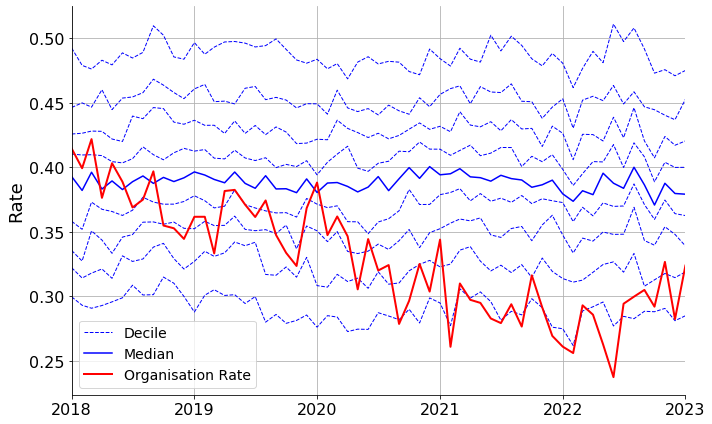

<h2 id=ace><a href=https://openprescribing.net/measure/ace>High-cost Angiotensin-Converting Enzyme (ACE) inhibitors</a></h2>

<h4><a href=https://openprescribing.net/measure/ace/sicbl/00L>NHS NORTHUMBERLAND</a></h4>

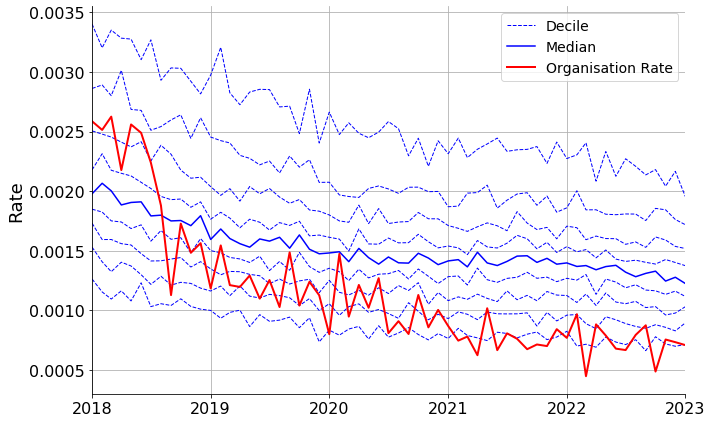

<h4><a href=https://openprescribing.net/measure/ace/sicbl/01W>NHS STOCKPORT</a></h4>

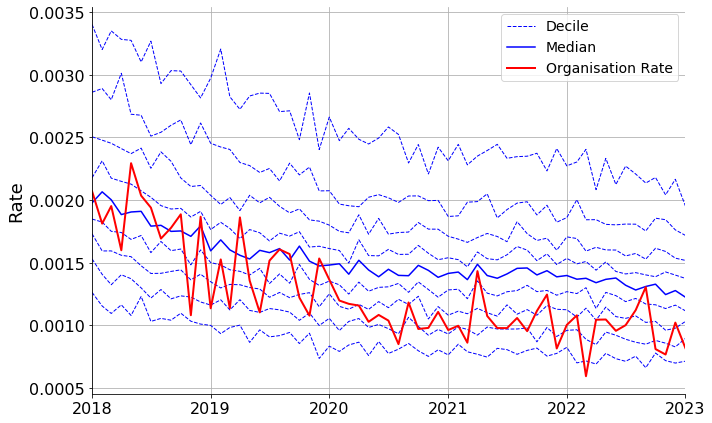

<h4><a href=https://openprescribing.net/measure/ace/sicbl/02P>NHS BARNSLEY</a></h4>

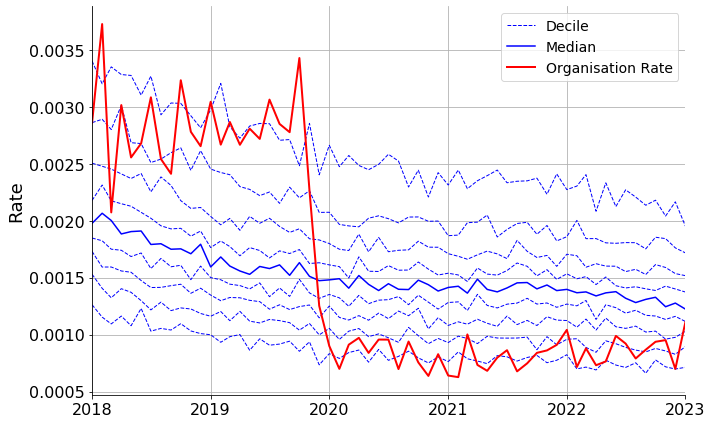

<h4><a href=https://openprescribing.net/measure/ace/sicbl/06Q>NHS MID ESSEX</a></h4>

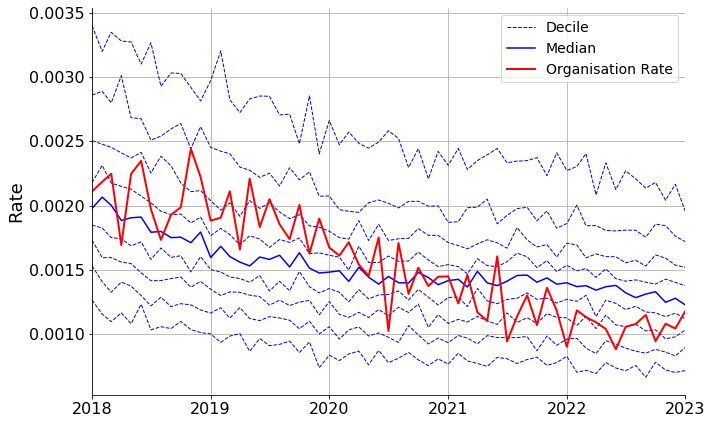

<h4><a href=https://openprescribing.net/measure/ace/sicbl/07G>NHS THURROCK</a></h4>

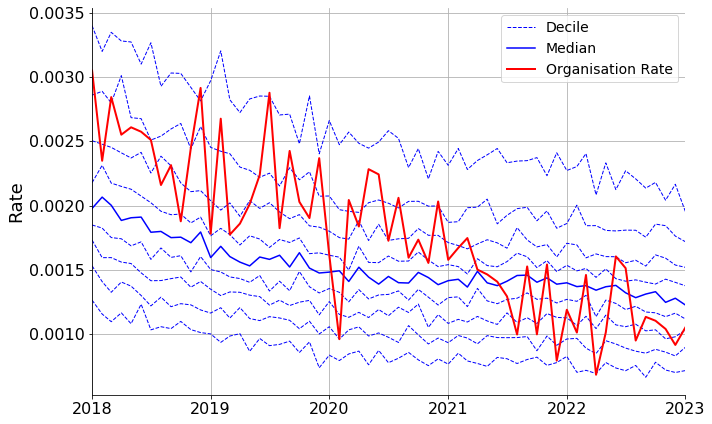

<h2 id=bdzadq><a href=https://openprescribing.net/measure/bdzadq>Anxiolytics and Hypnotics: Average Daily Quantity per item</a></h2>

No organisations identified for this measure.

<h2 id=bdzper1000><a href=https://openprescribing.net/measure/bdzper1000>Anxiolytics and Hypnotics: Average Daily Quantity per 1000 patients</a></h2>

<h4><a href=https://openprescribing.net/measure/bdzper1000/sicbl/01D>NHS HEYWOOD, MIDDLETON AND ROCHDALE</a></h4>

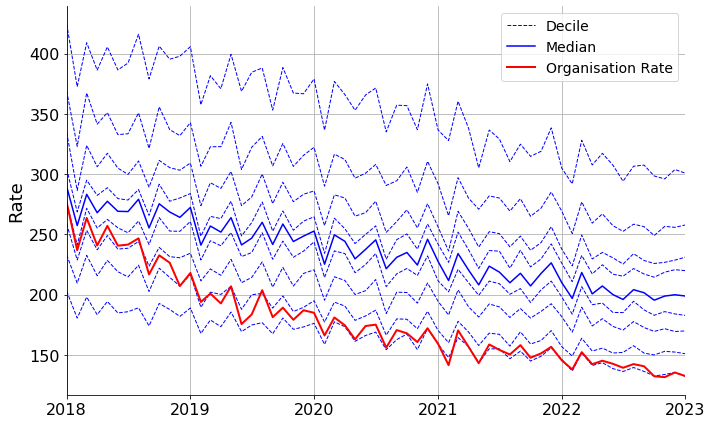

<h4><a href=https://openprescribing.net/measure/bdzper1000/sicbl/03F>NHS HULL</a></h4>

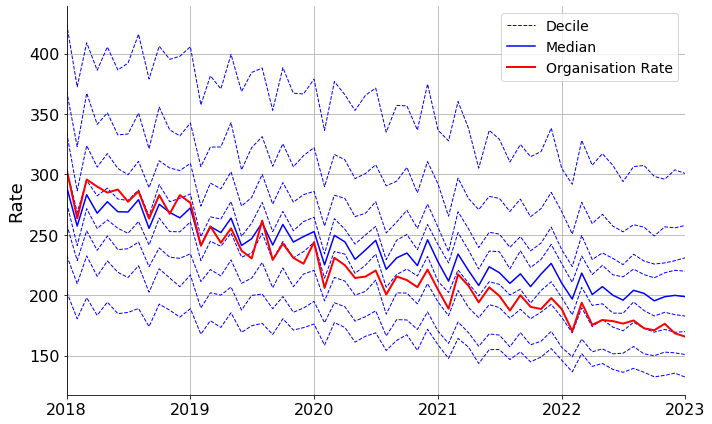

<h2 id=carbon_salbutamol><a href=https://openprescribing.net/measure/carbon_salbutamol>Environmental impact of inhalers - average carbon footprint per salbutamol inhaler</a></h2>

<h4><a href=https://openprescribing.net/measure/carbon_salbutamol/sicbl/01V>NHS SOUTHPORT AND FORMBY</a></h4>

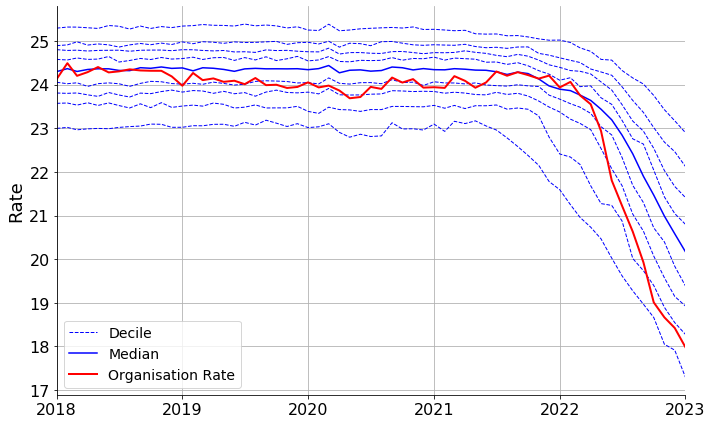

<h4><a href=https://openprescribing.net/measure/carbon_salbutamol/sicbl/02E>NHS WARRINGTON</a></h4>

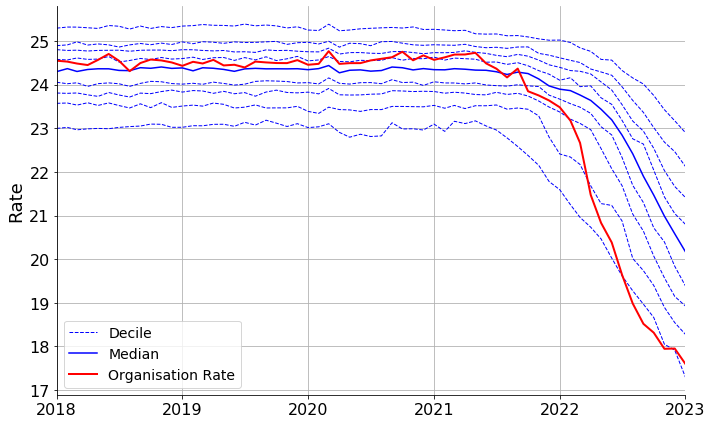

<h4><a href=https://openprescribing.net/measure/carbon_salbutamol/sicbl/03N>NHS SHEFFIELD</a></h4>

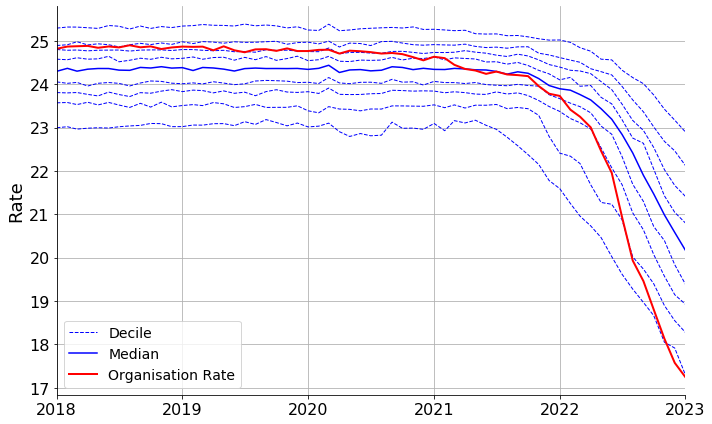

<h4><a href=https://openprescribing.net/measure/carbon_salbutamol/sicbl/05G>NHS NORTH STAFFORDSHIRE</a></h4>

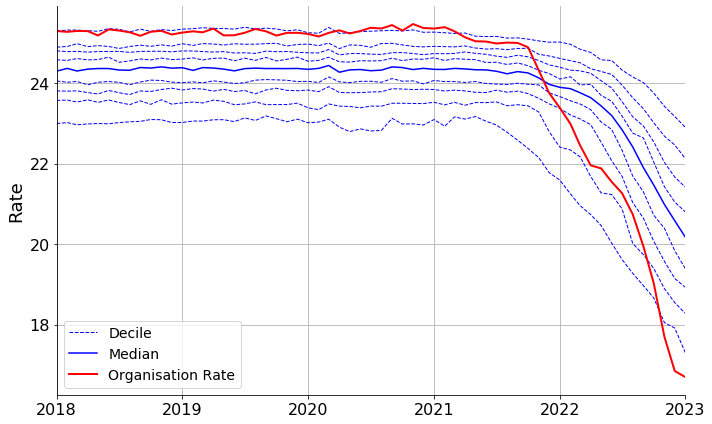

<h4><a href=https://openprescribing.net/measure/carbon_salbutamol/sicbl/11M>NHS GLOUCESTERSHIRE</a></h4>

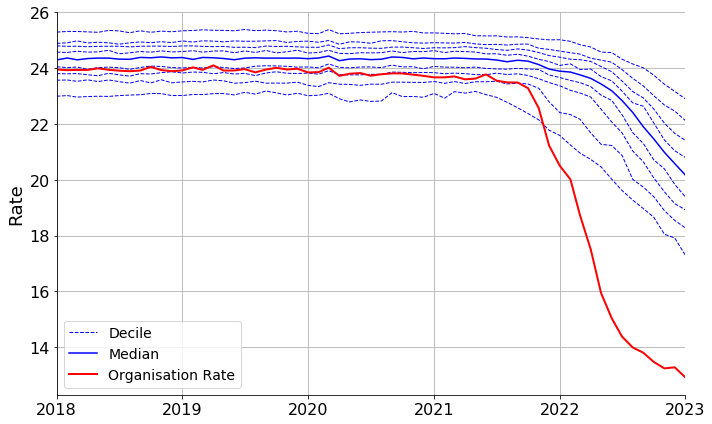

<h2 id=cgm_sensors><a href=https://openprescribing.net/measure/cgm_sensors>Prescribing of continuous glucose monitoring sensors</a></h2>

No organisations identified for this measure.

<h2 id=ciclosporin><a href=https://openprescribing.net/measure/ciclosporin>Ciclosporin and tacrolimus oral preparations prescribed generically</a></h2>

No organisations identified for this measure.

<h2 id=cmpaperpt><a href=https://openprescribing.net/measure/cmpaperpt>Cost of milk formulae for Cow's Milk Protein Allergy (CMPA) per listed patients aged 0-4</a></h2>

No organisations identified for this measure.

<h2 id=coproxamol><a href=https://openprescribing.net/measure/coproxamol>Co-proxamol</a></h2>

No organisations identified for this measure.

<h2 id=desogestrel><a href=https://openprescribing.net/measure/desogestrel>Desogestrel prescribed as a branded product</a></h2>

<h4><a href=https://openprescribing.net/measure/desogestrel/sicbl/02P>NHS BARNSLEY</a></h4>

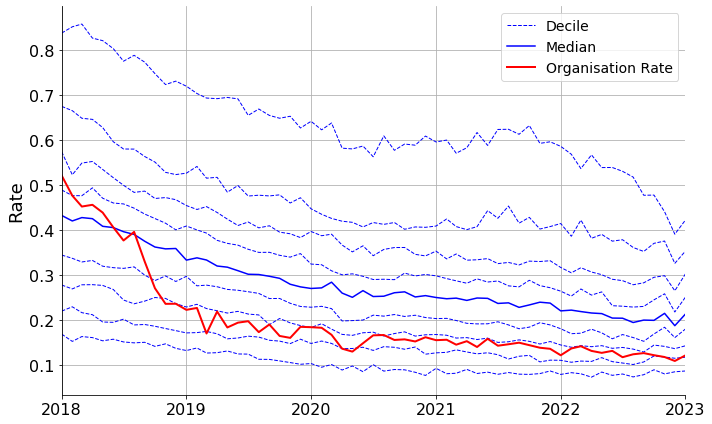

<h4><a href=https://openprescribing.net/measure/desogestrel/sicbl/03L>NHS ROTHERHAM</a></h4>

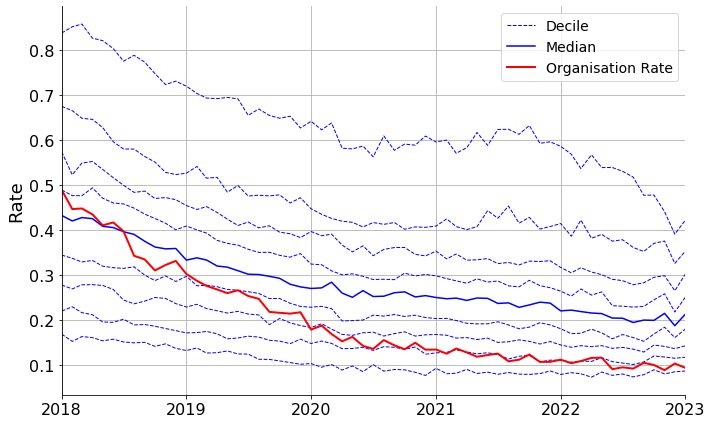

<h4><a href=https://openprescribing.net/measure/desogestrel/sicbl/03N>NHS SHEFFIELD</a></h4>

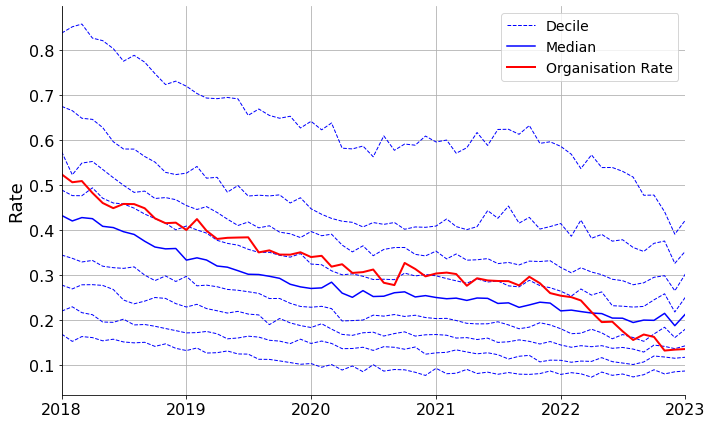

<h4><a href=https://openprescribing.net/measure/desogestrel/sicbl/15F>NHS LEEDS</a></h4>

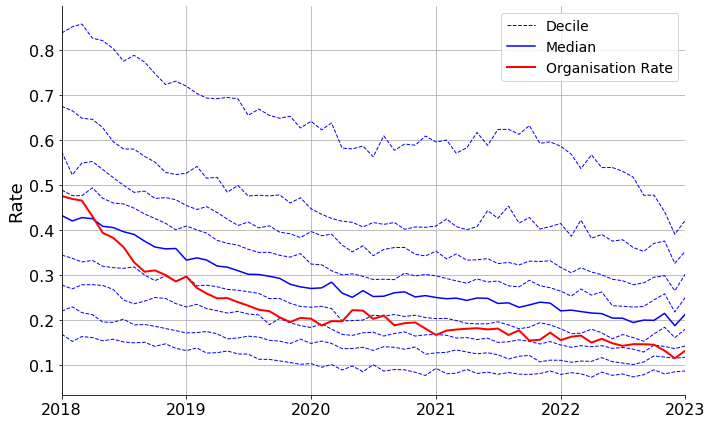

<h4><a href=https://openprescribing.net/measure/desogestrel/sicbl/92G>NHS BATH AND NORTH EAST SOMERSET, SWINDON AND WILTSHIRE</a></h4>

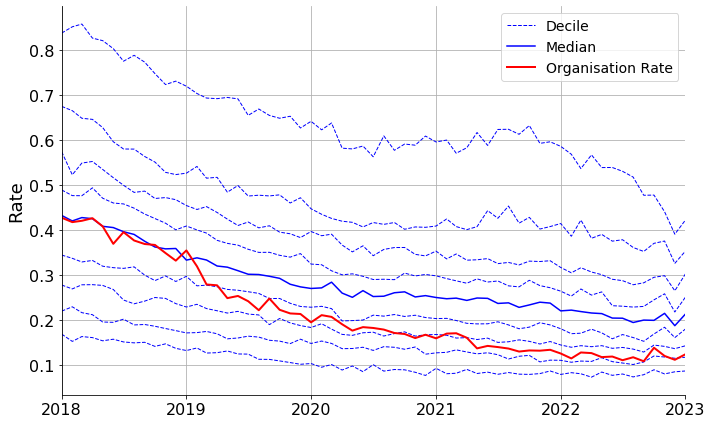

<h2 id=diltiazem><a href=https://openprescribing.net/measure/diltiazem>Diltiazem preparations (>60mg) prescribed generically</a></h2>

<h4><a href=https://openprescribing.net/measure/diltiazem/sicbl/01F>NHS HALTON</a></h4>

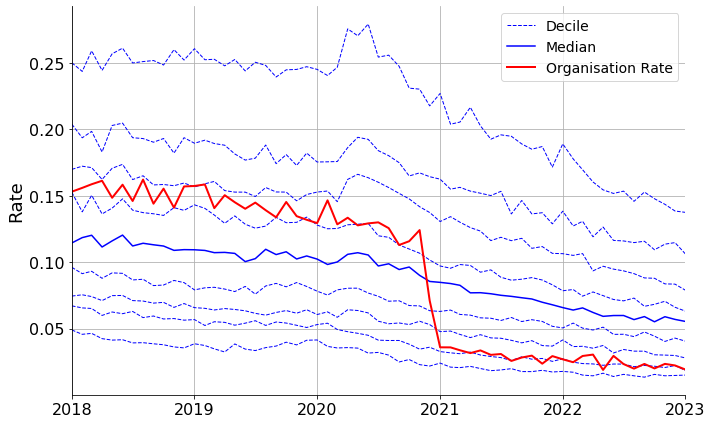

<h4><a href=https://openprescribing.net/measure/diltiazem/sicbl/02P>NHS BARNSLEY</a></h4>

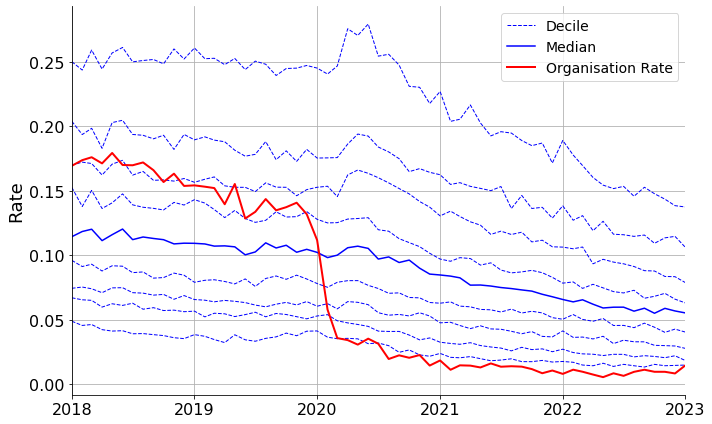

<h4><a href=https://openprescribing.net/measure/diltiazem/sicbl/09D>NHS BRIGHTON AND HOVE</a></h4>

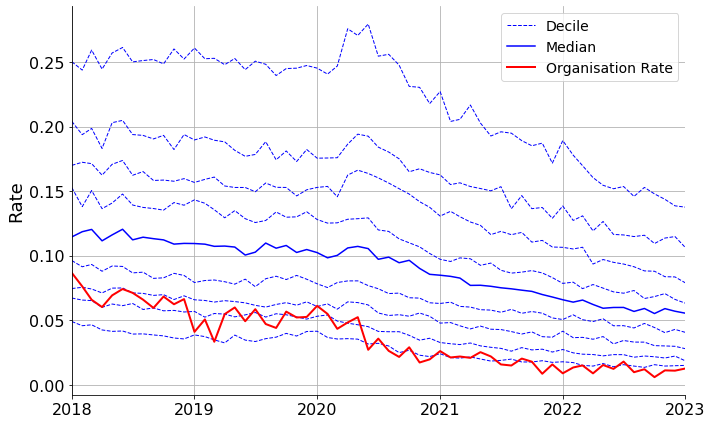

<h4><a href=https://openprescribing.net/measure/diltiazem/sicbl/12F>NHS WIRRAL</a></h4>

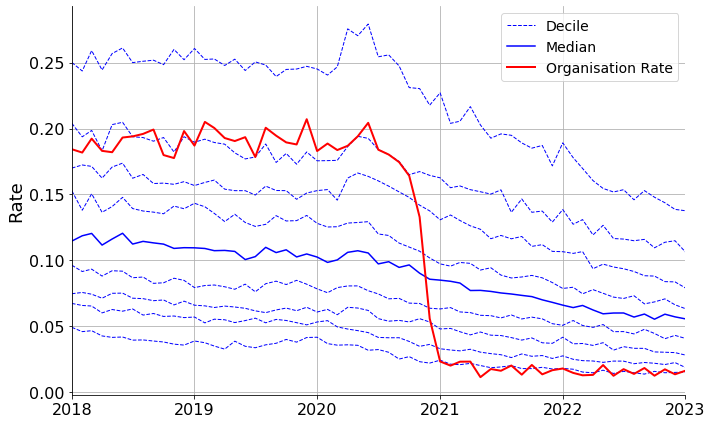

<h4><a href=https://openprescribing.net/measure/diltiazem/sicbl/99G>NHS SOUTHEND</a></h4>

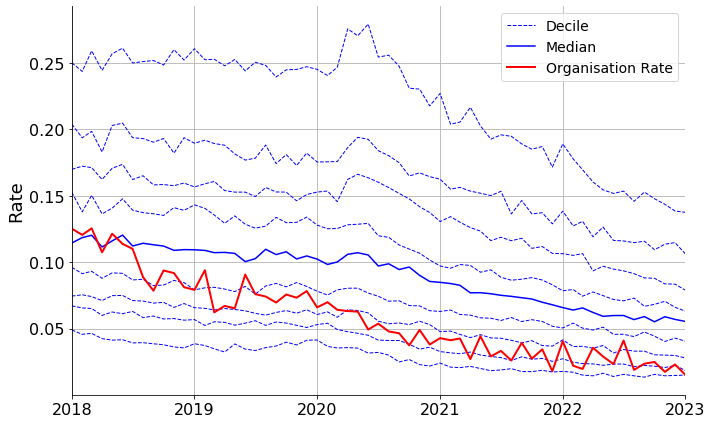

<h2 id=dipyridamole><a href=https://openprescribing.net/measure/dipyridamole>Prescribing of dipyridamole</a></h2>

<h4><a href=https://openprescribing.net/measure/dipyridamole/sicbl/02M>NHS FYLDE AND WYRE</a></h4>

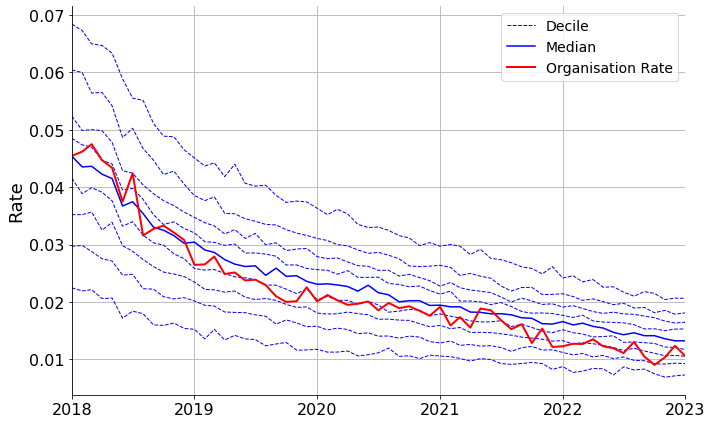

<h4><a href=https://openprescribing.net/measure/dipyridamole/sicbl/14Y>NHS BUCKINGHAMSHIRE</a></h4>

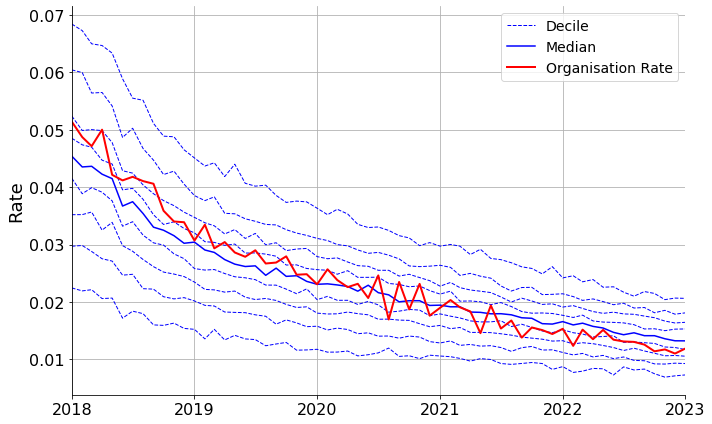

<h4><a href=https://openprescribing.net/measure/dipyridamole/sicbl/42D>NHS NORTH YORKSHIRE</a></h4>

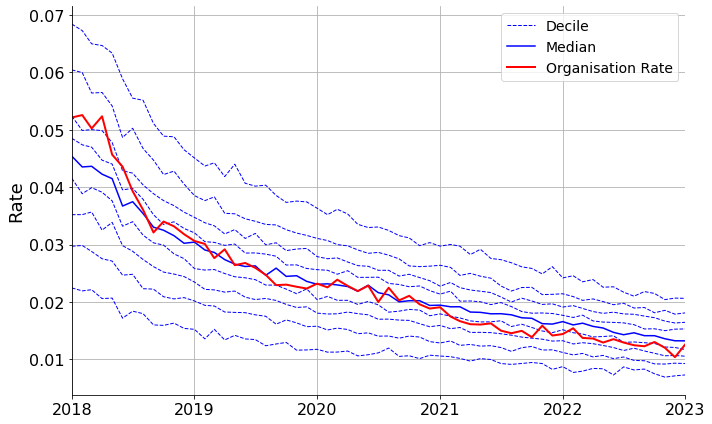

<h4><a href=https://openprescribing.net/measure/dipyridamole/sicbl/M2L0M>NHS SHROPSHIRE, TELFORD AND WREKIN</a></h4>

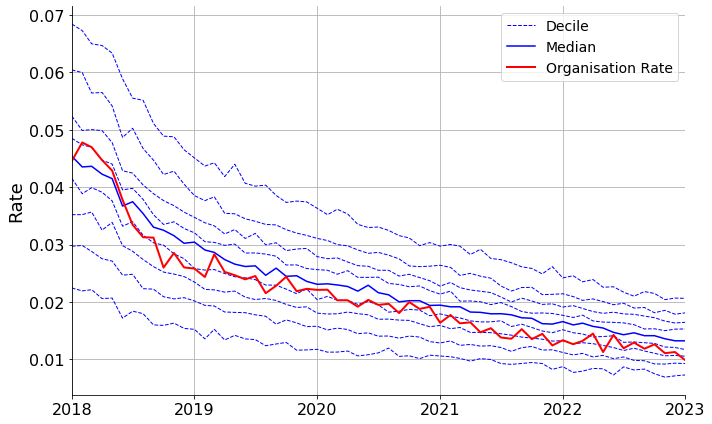

<h2 id=doacs><a href=https://openprescribing.net/measure/doacs>Direct Oral Anticoagulants (DOACs)</a></h2>

No organisations identified for this measure.

<h2 id=edoxaban><a href=https://openprescribing.net/measure/edoxaban>Proportion of Direct Acting Oral Anticoagulants (DOACs) not prescribed as edoxaban</a></h2>

<h4><a href=https://openprescribing.net/measure/edoxaban/sicbl/03Q>NHS VALE OF YORK</a></h4>

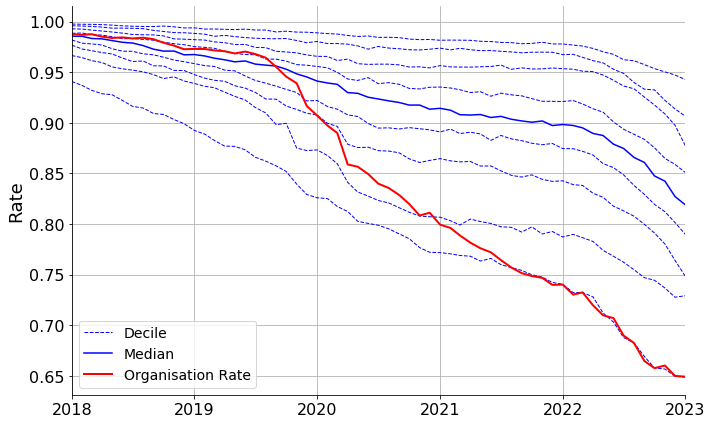

<h4><a href=https://openprescribing.net/measure/edoxaban/sicbl/03W>NHS EAST LEICESTERSHIRE AND RUTLAND</a></h4>

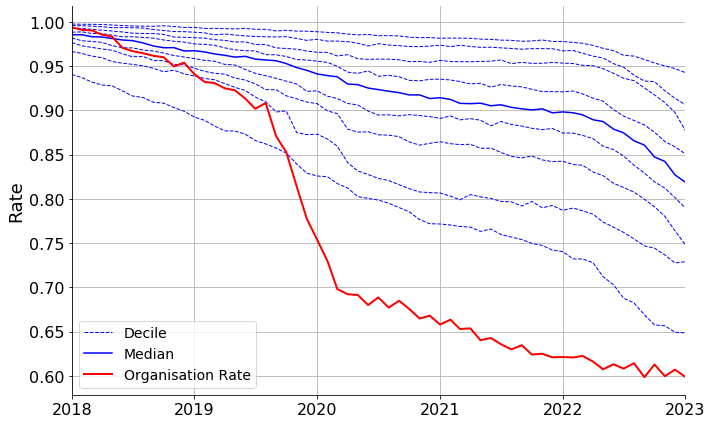

<h4><a href=https://openprescribing.net/measure/edoxaban/sicbl/04C>NHS LEICESTER CITY</a></h4>

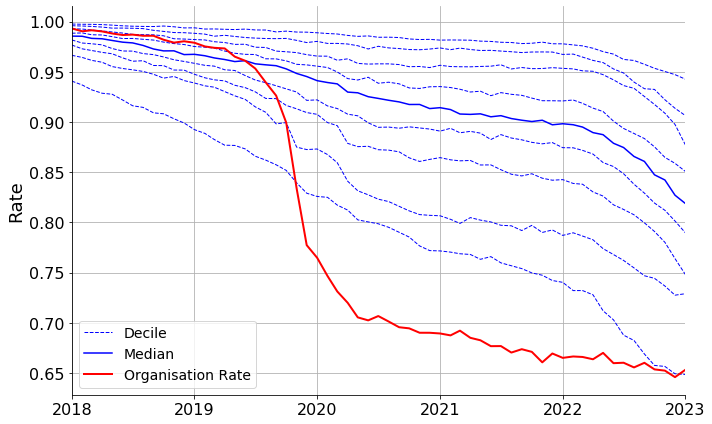

<h4><a href=https://openprescribing.net/measure/edoxaban/sicbl/04V>NHS WEST LEICESTERSHIRE</a></h4>

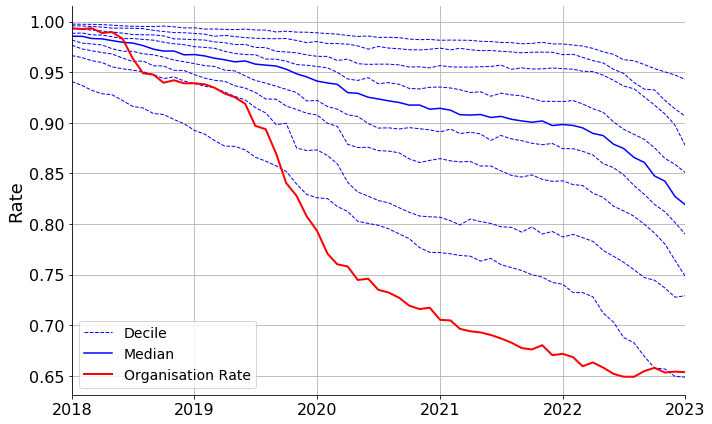

<h4><a href=https://openprescribing.net/measure/edoxaban/sicbl/06Q>NHS MID ESSEX</a></h4>

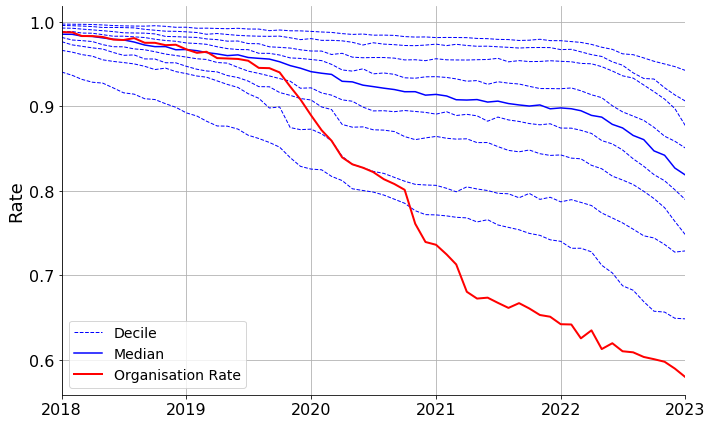

<h2 id=environmental_inhalers><a href=https://openprescribing.net/measure/environmental_inhalers>Environmental impact of inhalers - prescribing of non-salbutamol Metered Dose Inhalers (MDIs)</a></h2>

No organisations identified for this measure.

<h2 id=fungal><a href=https://openprescribing.net/measure/fungal>Topical treatment of fungal nail infections</a></h2>

<h4><a href=https://openprescribing.net/measure/fungal/sicbl/10R>NHS PORTSMOUTH</a></h4>

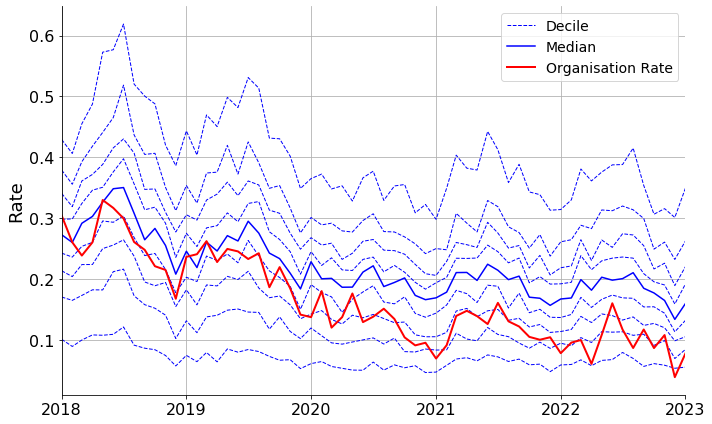

<h2 id=gabapentinoidsddd><a href=https://openprescribing.net/measure/gabapentinoidsddd>Prescribing of gabapentin and pregabalin (DDD)</a></h2>

No organisations identified for this measure.

<h2 id=glaucoma><a href=https://openprescribing.net/measure/glaucoma>Glaucoma eye drops prescribed by brand</a></h2>

<h4><a href=https://openprescribing.net/measure/glaucoma/sicbl/02E>NHS WARRINGTON</a></h4>

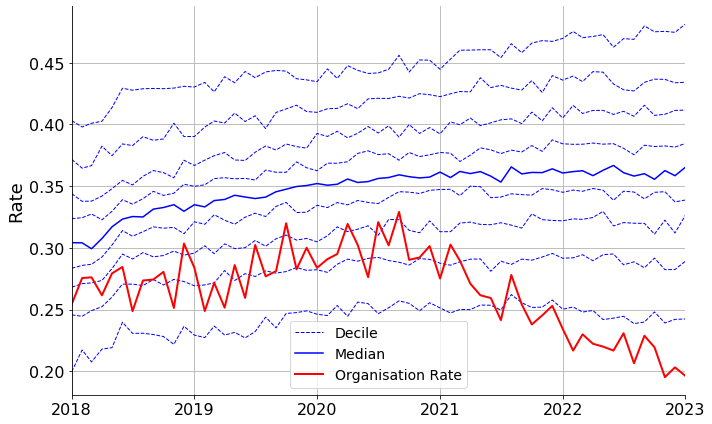

<h2 id=glutenfree><a href=https://openprescribing.net/measure/glutenfree>Prescribing of gluten free products</a></h2>

No organisations identified for this measure.

<h2 id=icsdose><a href=https://openprescribing.net/measure/icsdose>High dose inhaled corticosteroids</a></h2>

<h4><a href=https://openprescribing.net/measure/icsdose/sicbl/00R>NHS BLACKPOOL</a></h4>

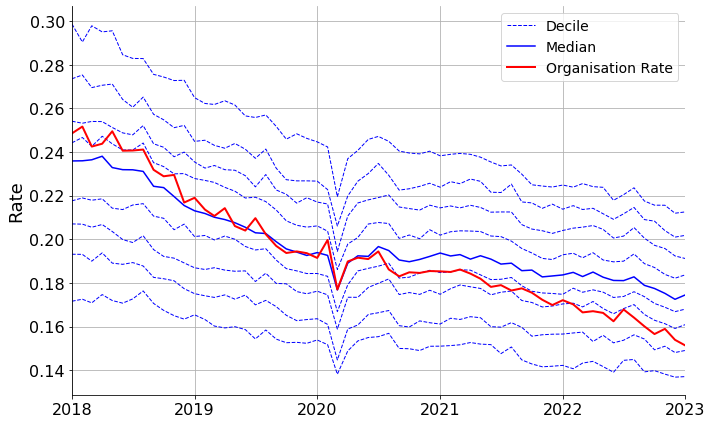

<h4><a href=https://openprescribing.net/measure/icsdose/sicbl/02X>NHS DONCASTER</a></h4>

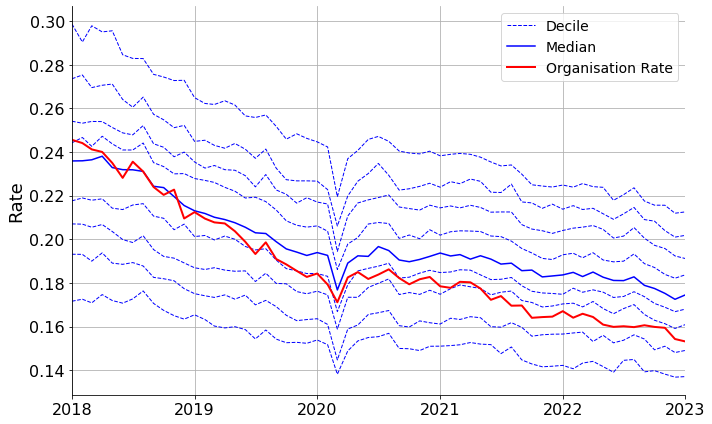

<h4><a href=https://openprescribing.net/measure/icsdose/sicbl/15N>NHS DEVON</a></h4>

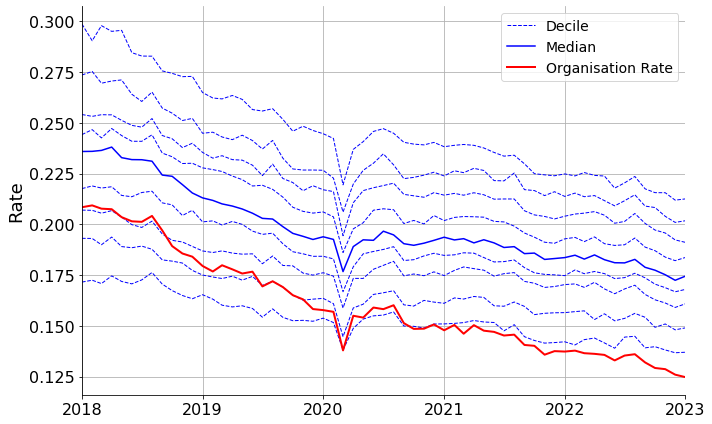

<h4><a href=https://openprescribing.net/measure/icsdose/sicbl/D2P2L>NHS BLACK COUNTRY AND WEST BIRMINGHAM</a></h4>

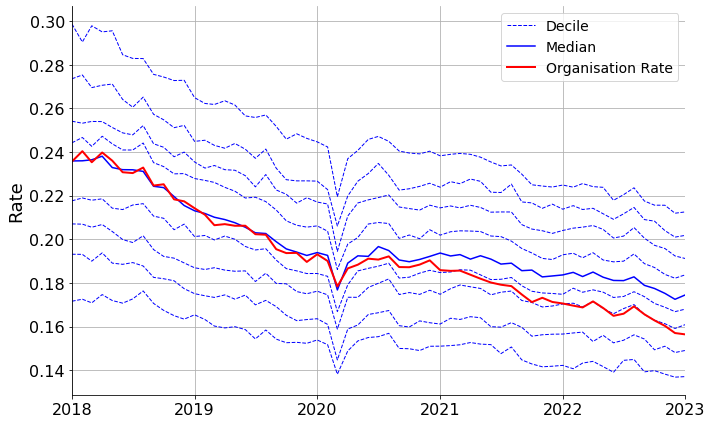

<h2 id=injectable_antibiotics><a href=https://openprescribing.net/measure/injectable_antibiotics>Antibiotic stewardship: Injectable preparations for the treatment of infection</a></h2>

No organisations identified for this measure.

<h2 id=keppra><a href=https://openprescribing.net/measure/keppra>Levetiracetam prescribed as Keppra</a></h2>

<h4><a href=https://openprescribing.net/measure/keppra/sicbl/03F>NHS HULL</a></h4>

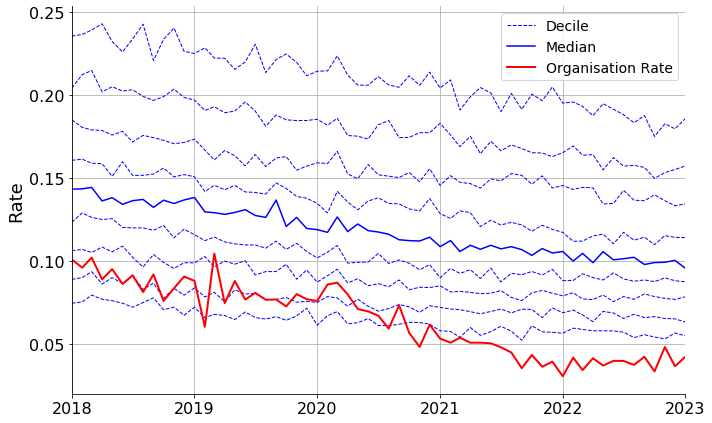

<h4><a href=https://openprescribing.net/measure/keppra/sicbl/07G>NHS THURROCK</a></h4>

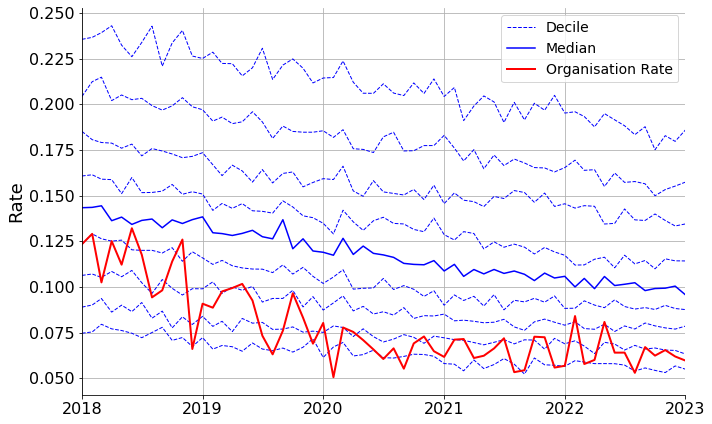

<h4><a href=https://openprescribing.net/measure/keppra/sicbl/10R>NHS PORTSMOUTH</a></h4>

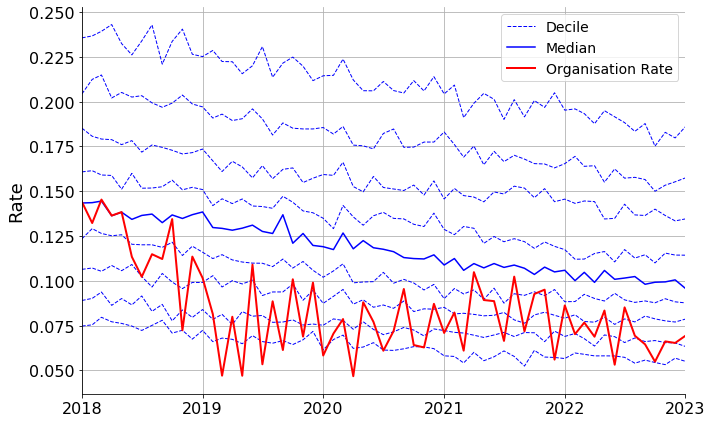

<h2 id=ktt12_diabetes_insulin><a href=https://openprescribing.net/measure/ktt12_diabetes_insulin>Long-acting insulin analogues (KTT12)</a></h2>

No organisations identified for this measure.

<h2 id=ktt13_nsaids_ibuprofen><a href=https://openprescribing.net/measure/ktt13_nsaids_ibuprofen>Non-preferred NSAIDs and COX-2 inhibitors (KTT13)</a></h2>

No organisations identified for this measure.

<h2 id=ktt9_antibiotics><a href=https://openprescribing.net/measure/ktt9_antibiotics>Antibiotic stewardship: volume of antibiotic prescribing (KTT9)</a></h2>

No organisations identified for this measure.

<h2 id=ktt9_cephalosporins><a href=https://openprescribing.net/measure/ktt9_cephalosporins>Antibiotic stewardship: co-amoxiclav, cephalosporins & quinolones (KTT9)</a></h2>

<h4><a href=https://openprescribing.net/measure/ktt9_cephalosporins/sicbl/07G>NHS THURROCK</a></h4>

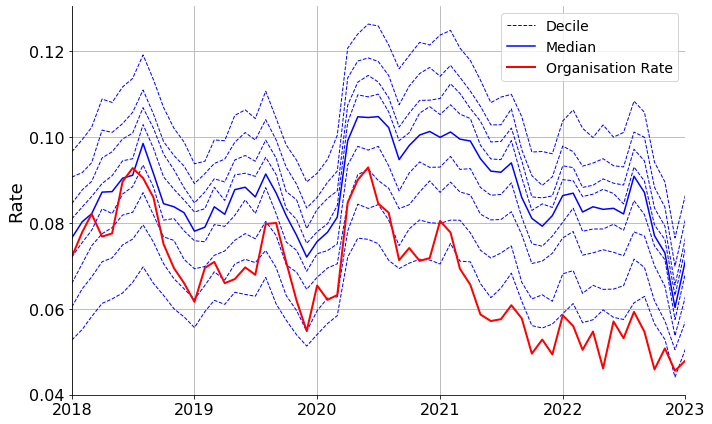

<h2 id=ktt9_cephalosporins_star><a href=https://openprescribing.net/measure/ktt9_cephalosporins_star>Antibiotic stewardship: co-amoxiclav, cephalosporins & quinolones (KTT9) prescribing volume</a></h2>

<h4><a href=https://openprescribing.net/measure/ktt9_cephalosporins_star/sicbl/07G>NHS THURROCK</a></h4>

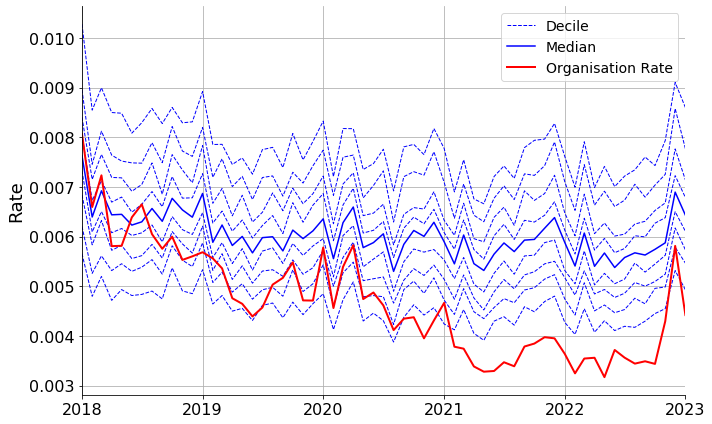

<h4><a href=https://openprescribing.net/measure/ktt9_cephalosporins_star/sicbl/93C>NHS NORTH CENTRAL LONDON</a></h4>

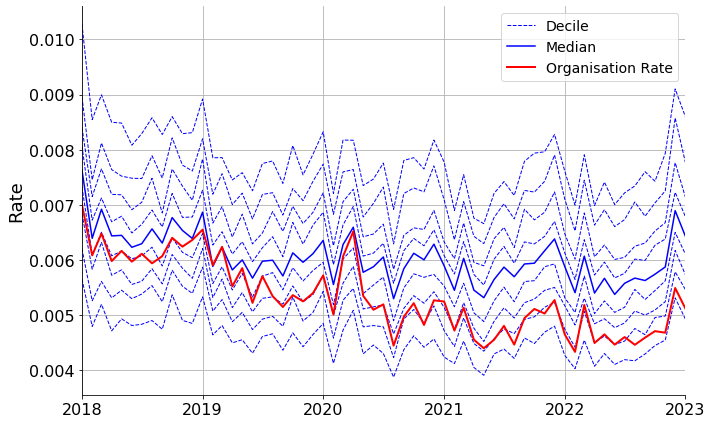

<h4><a href=https://openprescribing.net/measure/ktt9_cephalosporins_star/sicbl/A3A8R>NHS NORTH EAST LONDON</a></h4>

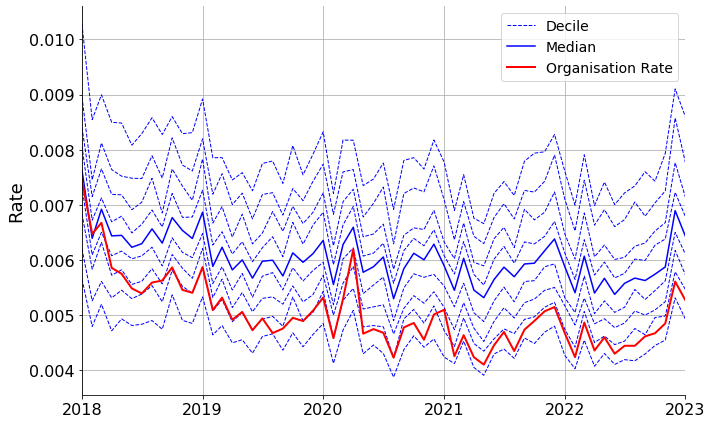

<h4><a href=https://openprescribing.net/measure/ktt9_cephalosporins_star/sicbl/W2U3Z>NHS NORTH WEST LONDON</a></h4>

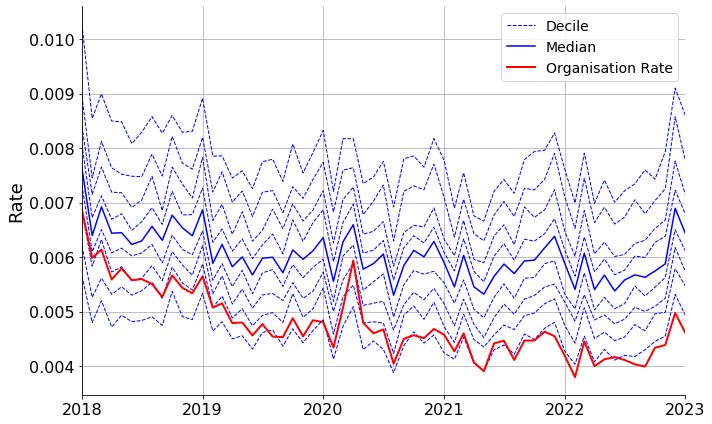

<h4><a href=https://openprescribing.net/measure/ktt9_cephalosporins_star/sicbl/X2C4Y>NHS KIRKLEES</a></h4>

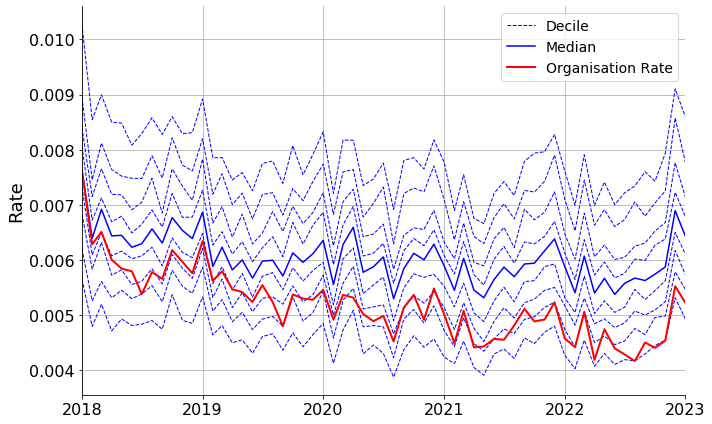

<h2 id=lpaliskiren><a href=https://openprescribing.net/measure/lpaliskiren>NHS England Low Priority Treatment - Aliskiren</a></h2>

<h4><a href=https://openprescribing.net/measure/lpaliskiren/sicbl/00Y>NHS OLDHAM</a></h4>

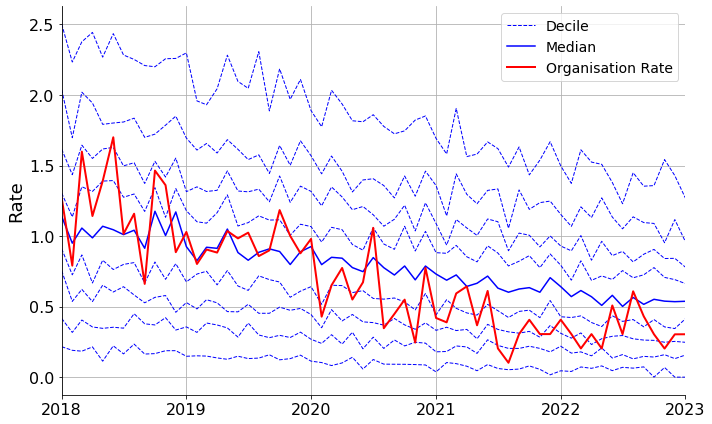

<h4><a href=https://openprescribing.net/measure/lpaliskiren/sicbl/03H>NHS NORTH EAST LINCOLNSHIRE</a></h4>

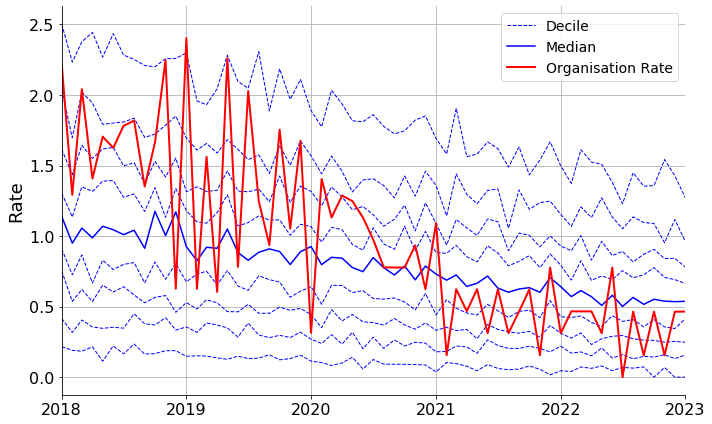

<h2 id=lpamiodarone><a href=https://openprescribing.net/measure/lpamiodarone>NHS England Low Priority Treatment - Amiodarone</a></h2>

<h4><a href=https://openprescribing.net/measure/lpamiodarone/sicbl/00V>NHS BURY</a></h4>

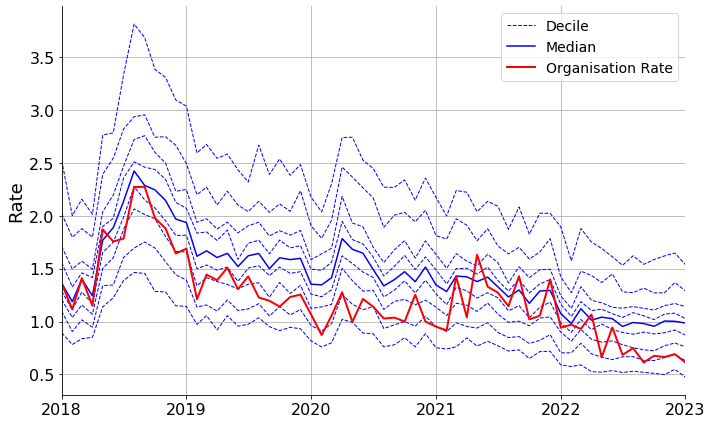

<h4><a href=https://openprescribing.net/measure/lpamiodarone/sicbl/02A>NHS TRAFFORD</a></h4>

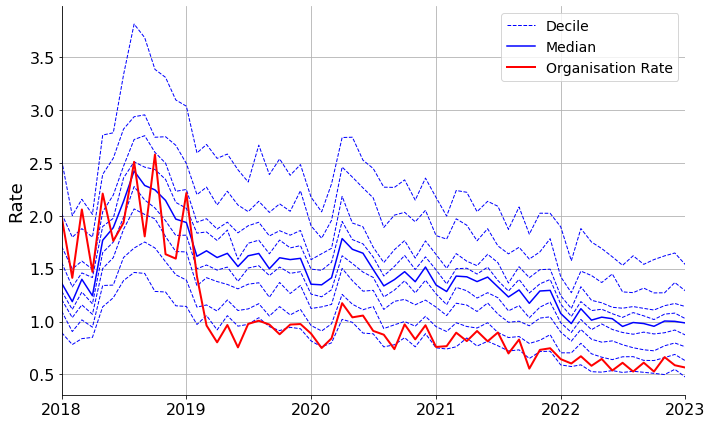

<h4><a href=https://openprescribing.net/measure/lpamiodarone/sicbl/84H>NHS COUNTY DURHAM</a></h4>

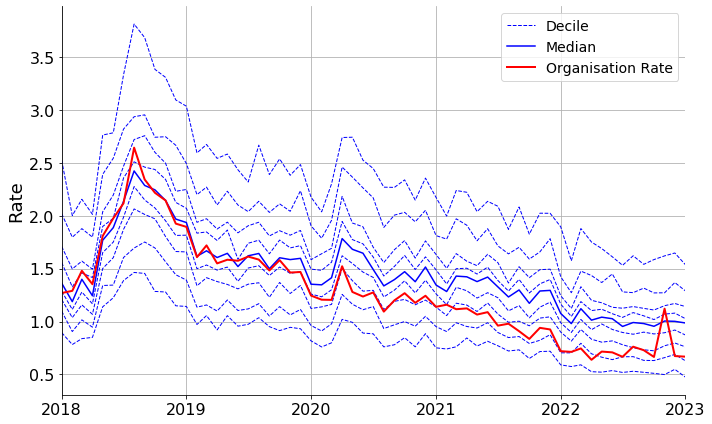

<h2 id=lpbathshoweremollients><a href=https://openprescribing.net/measure/lpbathshoweremollients>NHS England Low Priority Treatment - Bath and Shower emollients</a></h2>

<h4><a href=https://openprescribing.net/measure/lpbathshoweremollients/sicbl/01A>NHS EAST LANCASHIRE</a></h4>

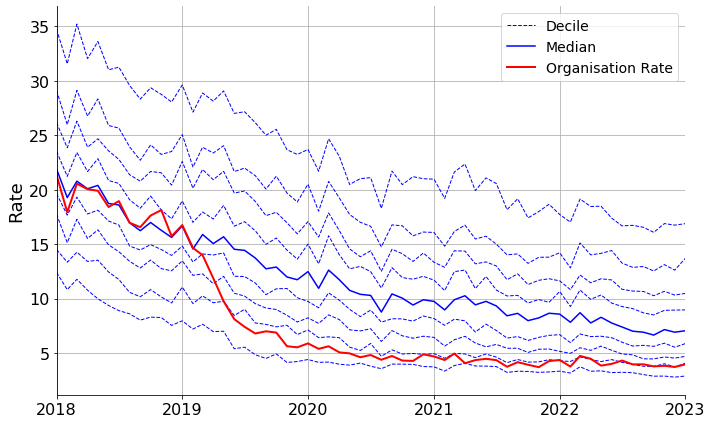

<h4><a href=https://openprescribing.net/measure/lpbathshoweremollients/sicbl/04C>NHS LEICESTER CITY</a></h4>

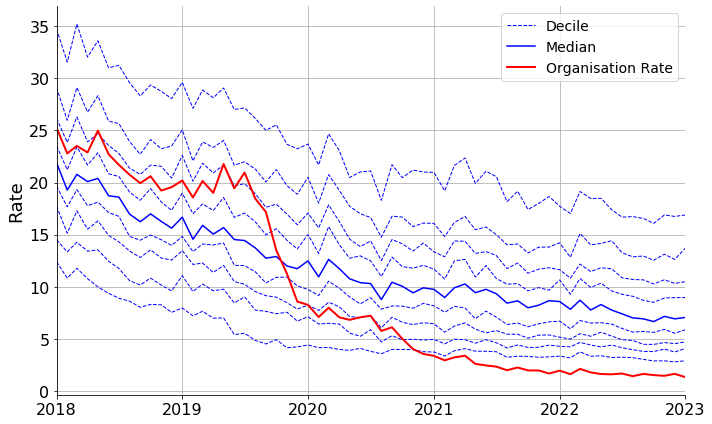

<h4><a href=https://openprescribing.net/measure/lpbathshoweremollients/sicbl/06T>NHS NORTH EAST ESSEX</a></h4>

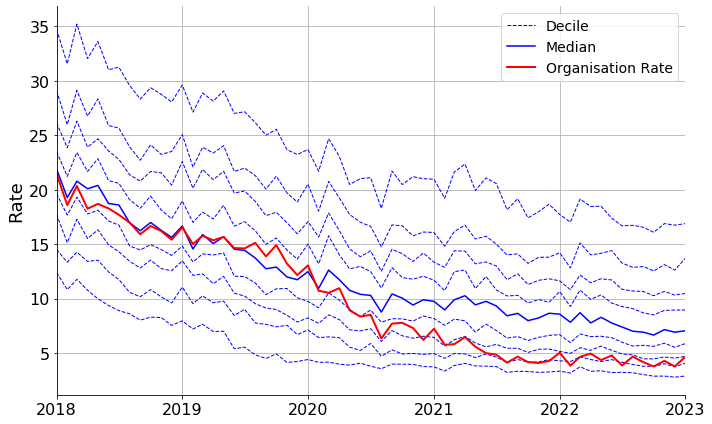

<h4><a href=https://openprescribing.net/measure/lpbathshoweremollients/sicbl/07G>NHS THURROCK</a></h4>

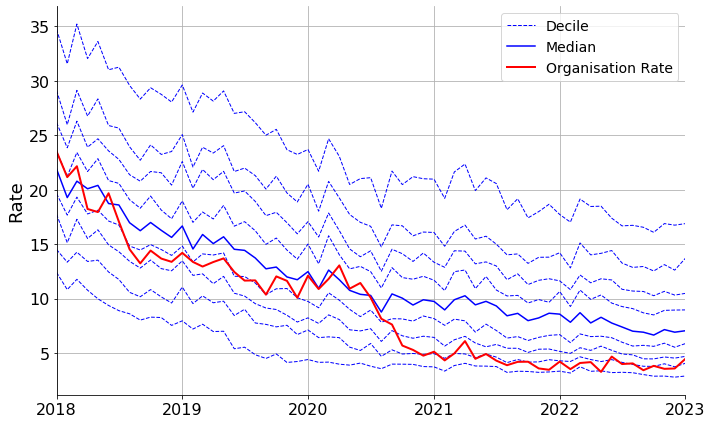

<h4><a href=https://openprescribing.net/measure/lpbathshoweremollients/sicbl/07H>NHS WEST ESSEX</a></h4>

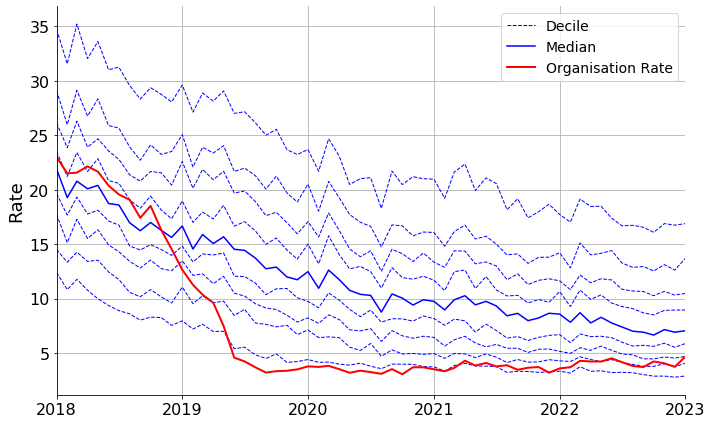

<h2 id=lpcoprox><a href=https://openprescribing.net/measure/lpcoprox>NHS England Low Priority Treatment - co-proxamol</a></h2>

<h4><a href=https://openprescribing.net/measure/lpcoprox/sicbl/00P>NHS SUNDERLAND</a></h4>

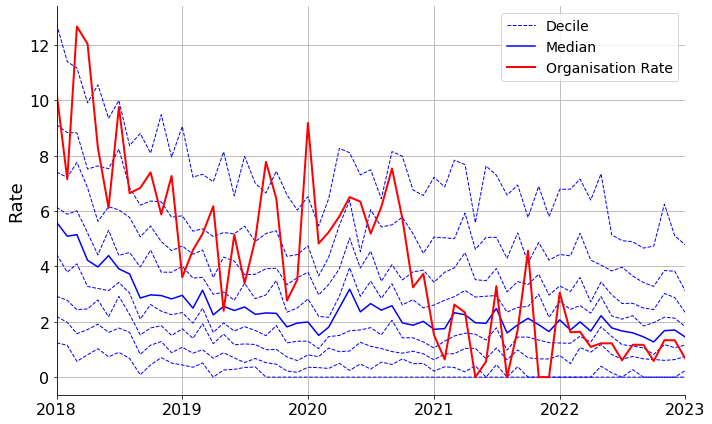

<h4><a href=https://openprescribing.net/measure/lpcoprox/sicbl/02A>NHS TRAFFORD</a></h4>

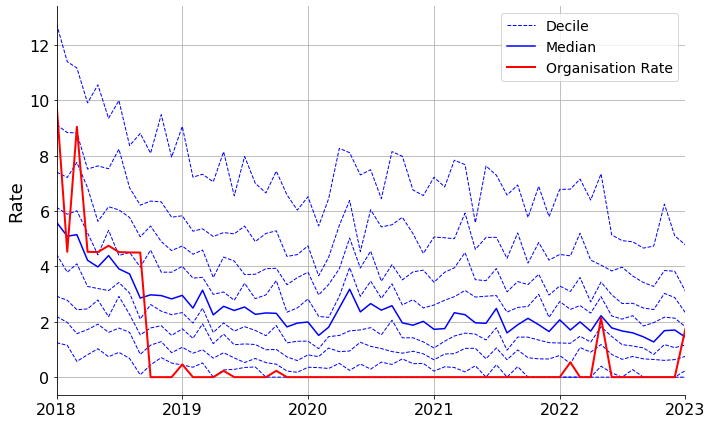

<h4><a href=https://openprescribing.net/measure/lpcoprox/sicbl/06K>NHS EAST AND NORTH HERTFORDSHIRE</a></h4>

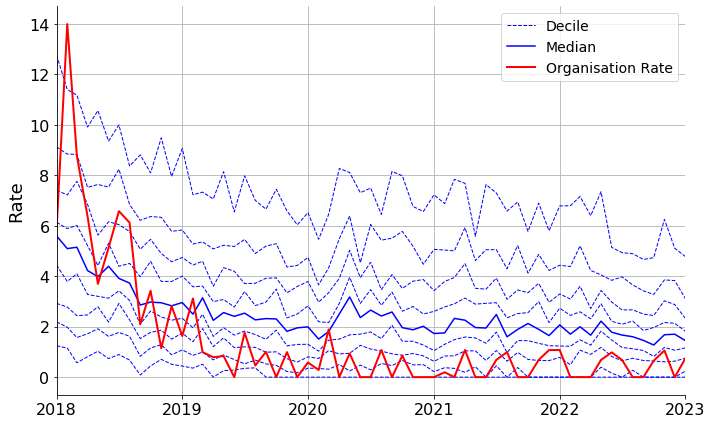

<h2 id=lpdosulepin><a href=https://openprescribing.net/measure/lpdosulepin>NHS England Low Priority Treatment - dosulepin</a></h2>

<h4><a href=https://openprescribing.net/measure/lpdosulepin/sicbl/03R>NHS WAKEFIELD</a></h4>

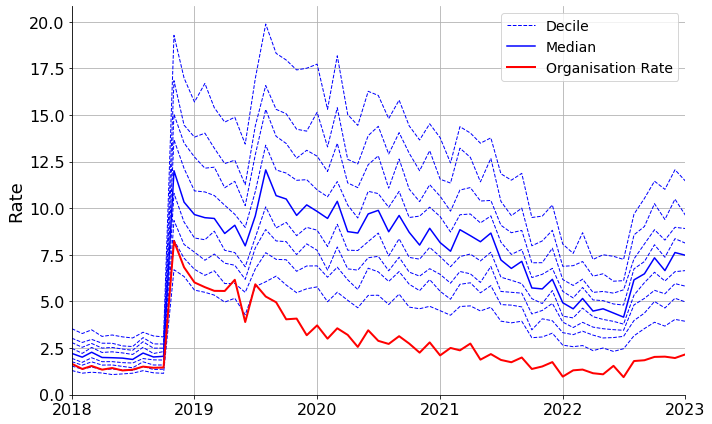

<h2 id=lpdoxazosin><a href=https://openprescribing.net/measure/lpdoxazosin>NHS England Low Priority Treatment - doxazosin modified release</a></h2>

<h4><a href=https://openprescribing.net/measure/lpdoxazosin/sicbl/00L>NHS NORTHUMBERLAND</a></h4>

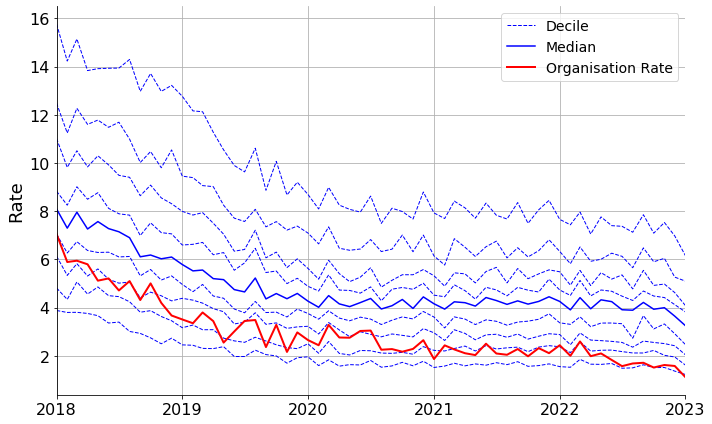

<h4><a href=https://openprescribing.net/measure/lpdoxazosin/sicbl/01T>NHS SOUTH SEFTON</a></h4>

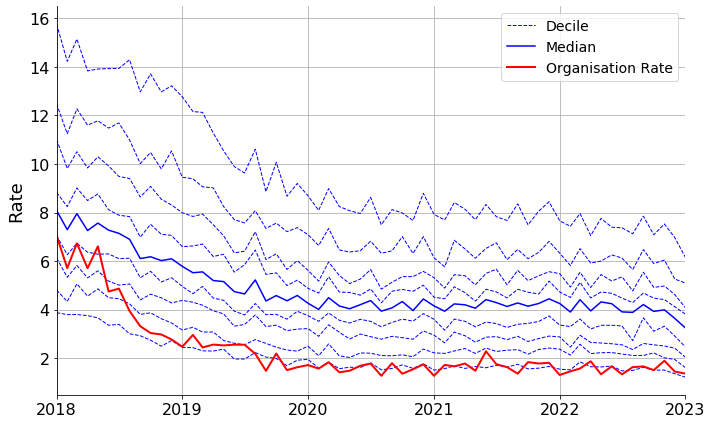

<h4><a href=https://openprescribing.net/measure/lpdoxazosin/sicbl/01V>NHS SOUTHPORT AND FORMBY</a></h4>

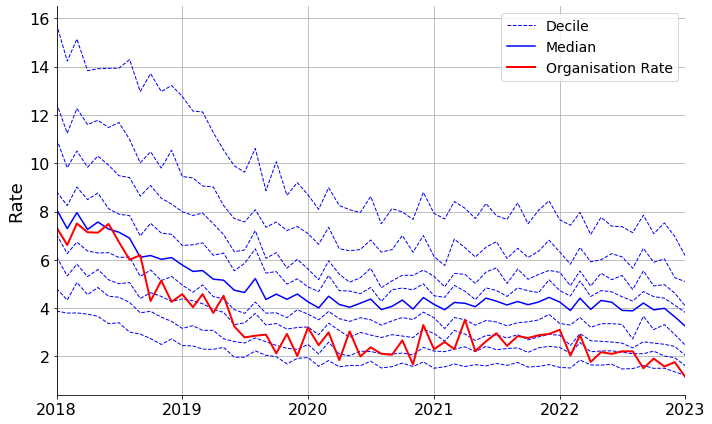

<h4><a href=https://openprescribing.net/measure/lpdoxazosin/sicbl/02P>NHS BARNSLEY</a></h4>

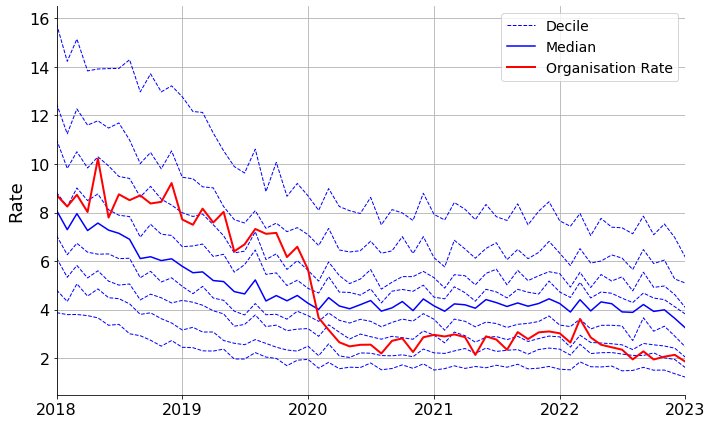

<h4><a href=https://openprescribing.net/measure/lpdoxazosin/sicbl/03R>NHS WAKEFIELD</a></h4>

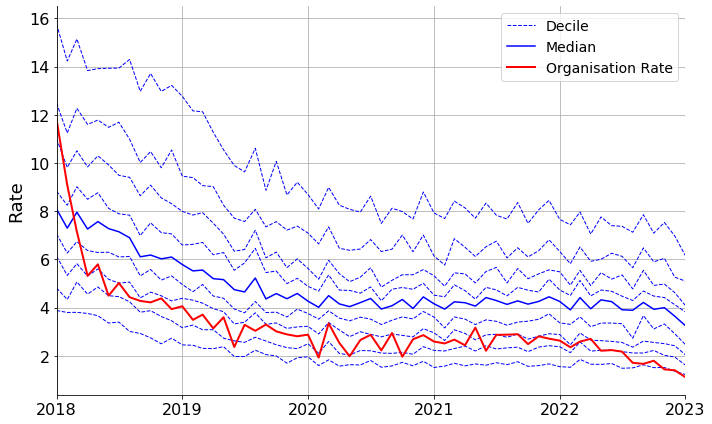

<h2 id=lpdronedarone><a href=https://openprescribing.net/measure/lpdronedarone>NHS England Low Priority Treatment - Dronedarone</a></h2>

<h4><a href=https://openprescribing.net/measure/lpdronedarone/sicbl/92A>NHS SURREY HEARTLANDS</a></h4>

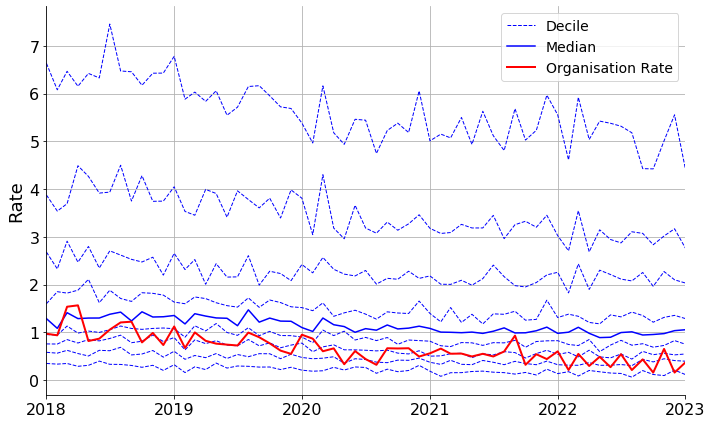

<h2 id=lpfentanylir><a href=https://openprescribing.net/measure/lpfentanylir>NHS England Low Priority Treatment - fentanyl immediate release</a></h2>

<h4><a href=https://openprescribing.net/measure/lpfentanylir/sicbl/01J>NHS KNOWSLEY</a></h4>

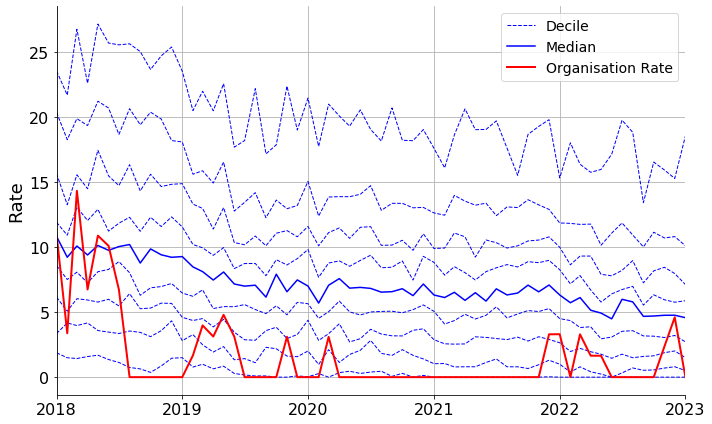

<h4><a href=https://openprescribing.net/measure/lpfentanylir/sicbl/01V>NHS SOUTHPORT AND FORMBY</a></h4>

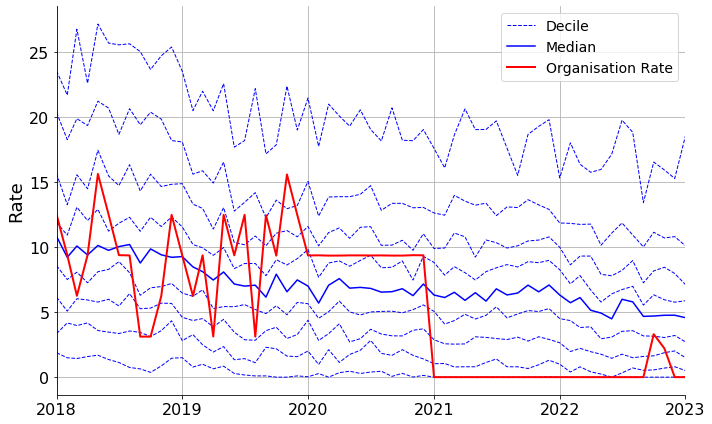

<h4><a href=https://openprescribing.net/measure/lpfentanylir/sicbl/07G>NHS THURROCK</a></h4>

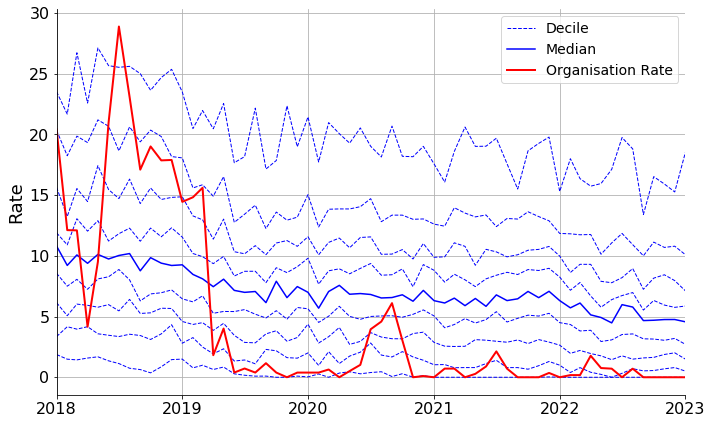

<h4><a href=https://openprescribing.net/measure/lpfentanylir/sicbl/52R>NHS NOTTINGHAM AND NOTTINGHAMSHIRE</a></h4>

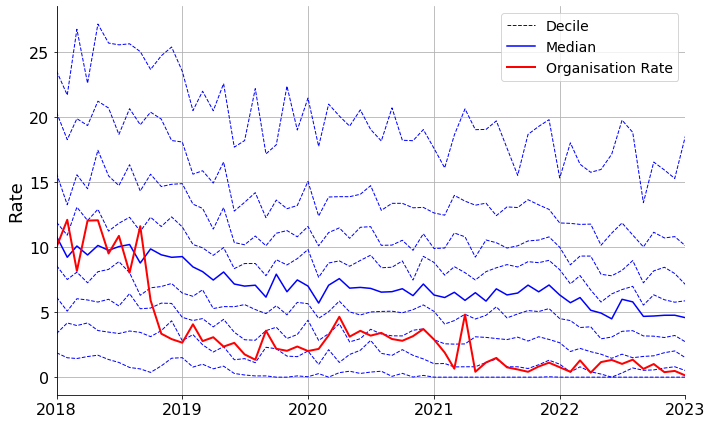

<h2 id=lpglucosamine><a href=https://openprescribing.net/measure/lpglucosamine>NHS England Low Priority Treatment - glucosamine and chondroitin</a></h2>

No organisations identified for this measure.

<h2 id=lpherbal><a href=https://openprescribing.net/measure/lpherbal>NHS England Low Priority Treatment - herbal medicines</a></h2>

No organisations identified for this measure.

<h2 id=lphomeopathy><a href=https://openprescribing.net/measure/lphomeopathy>NHS England Low Priority Treatment - homeopathy</a></h2>

No organisations identified for this measure.

<h2 id=lplidocaine><a href=https://openprescribing.net/measure/lplidocaine>NHS England Low Priority Treatment - lidocaine plasters</a></h2>

<h4><a href=https://openprescribing.net/measure/lplidocaine/sicbl/02T>NHS CALDERDALE</a></h4>

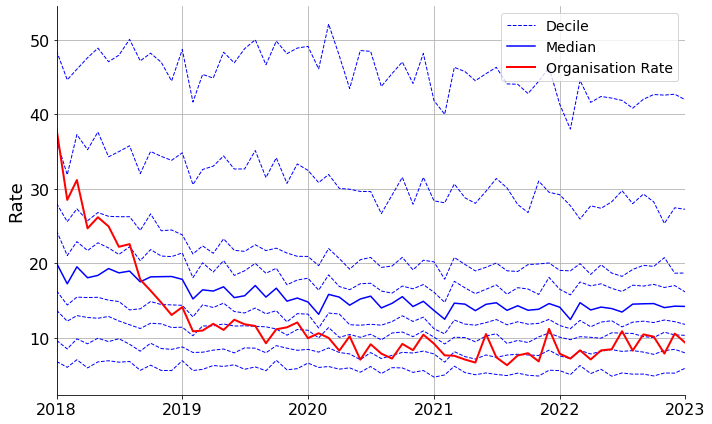

<h4><a href=https://openprescribing.net/measure/lplidocaine/sicbl/03L>NHS ROTHERHAM</a></h4>

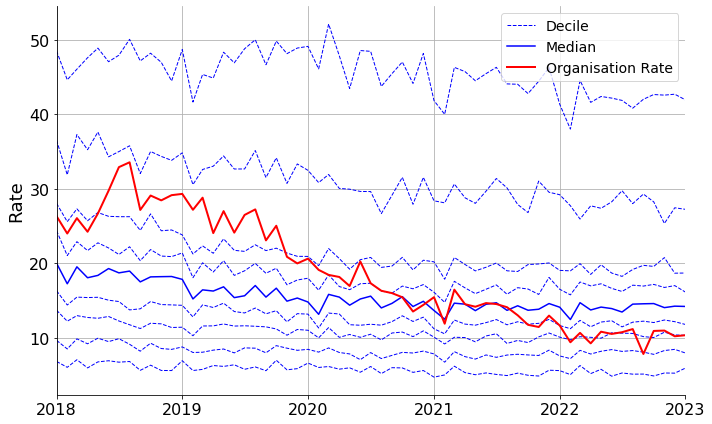

<h4><a href=https://openprescribing.net/measure/lplidocaine/sicbl/07H>NHS WEST ESSEX</a></h4>

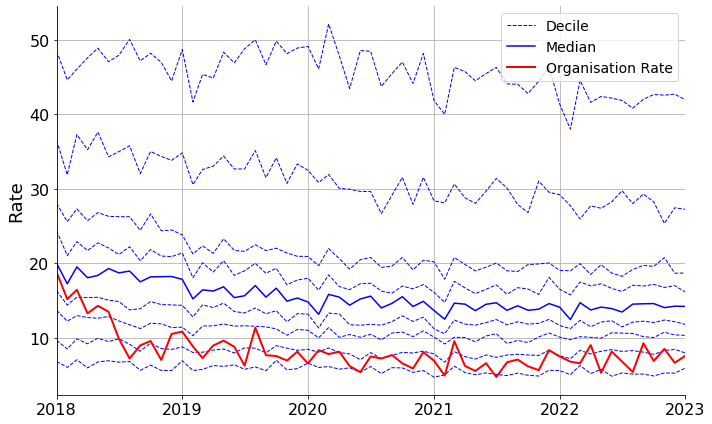

<h2 id=lpliothyronine><a href=https://openprescribing.net/measure/lpliothyronine>NHS England Low Priority Treatment - liothyronine (including Armour Thyroid and liothyronine combination products)</a></h2>

<h4><a href=https://openprescribing.net/measure/lpliothyronine/sicbl/02M>NHS FYLDE AND WYRE</a></h4>

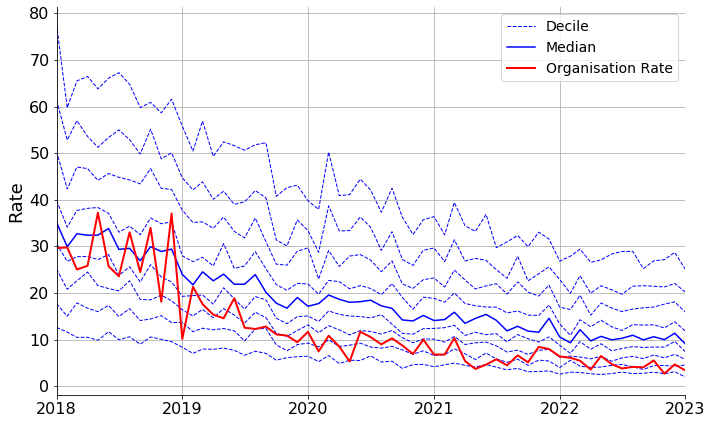

<h4><a href=https://openprescribing.net/measure/lpliothyronine/sicbl/99F>NHS CASTLE POINT AND ROCHFORD</a></h4>

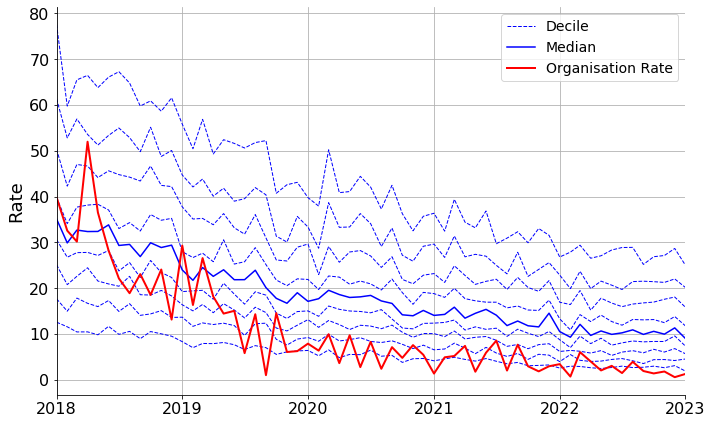

<h2 id=lplutein><a href=https://openprescribing.net/measure/lplutein>NHS England Low Priority Treatment - lutein and antioxidants</a></h2>

<h4><a href=https://openprescribing.net/measure/lplutein/sicbl/03R>NHS WAKEFIELD</a></h4>

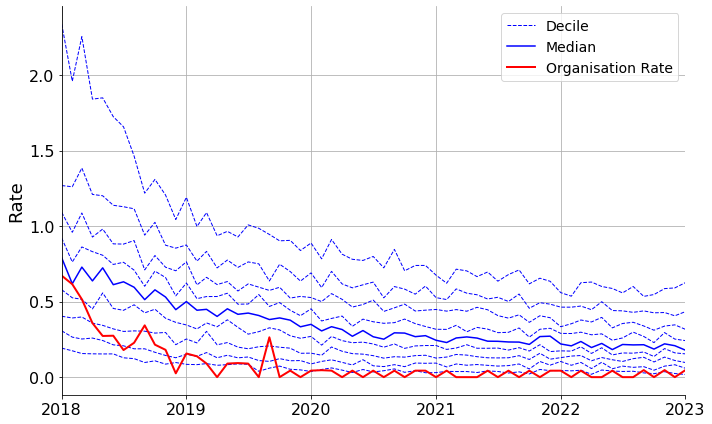

<h4><a href=https://openprescribing.net/measure/lplutein/sicbl/09D>NHS BRIGHTON AND HOVE</a></h4>

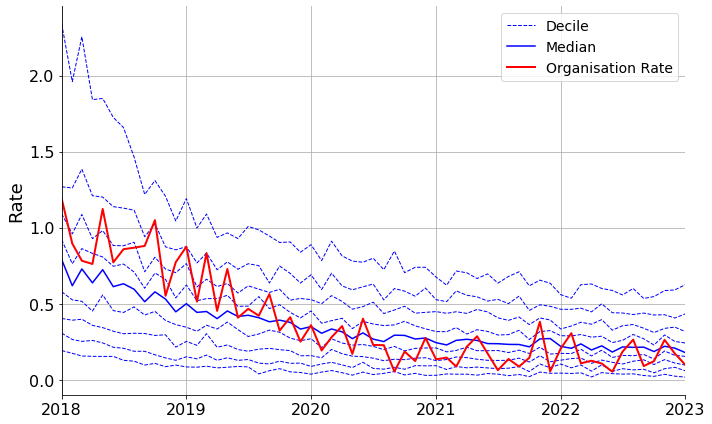

<h4><a href=https://openprescribing.net/measure/lplutein/sicbl/99F>NHS CASTLE POINT AND ROCHFORD</a></h4>

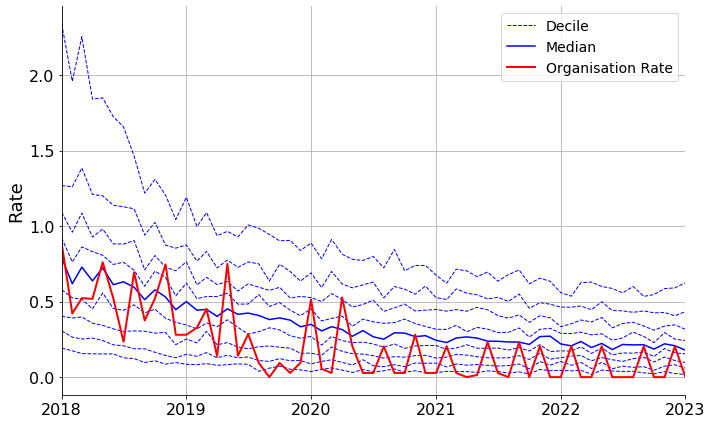

<h2 id=lpminocycline><a href=https://openprescribing.net/measure/lpminocycline>NHS England Low Priority Treatment - Minocycline</a></h2>

<h4><a href=https://openprescribing.net/measure/lpminocycline/sicbl/00Y>NHS OLDHAM</a></h4>

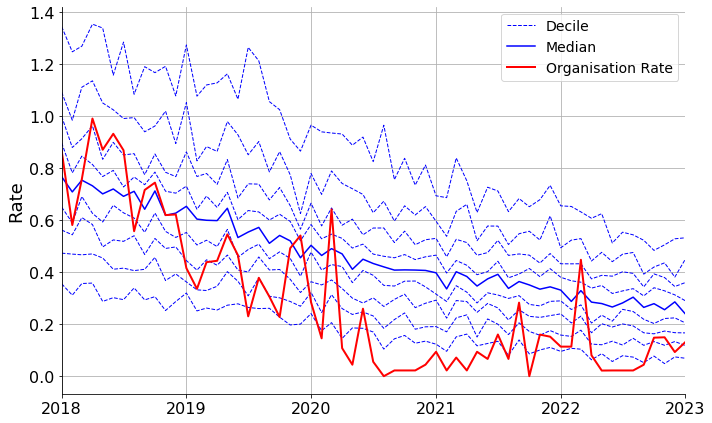

<h4><a href=https://openprescribing.net/measure/lpminocycline/sicbl/01J>NHS KNOWSLEY</a></h4>

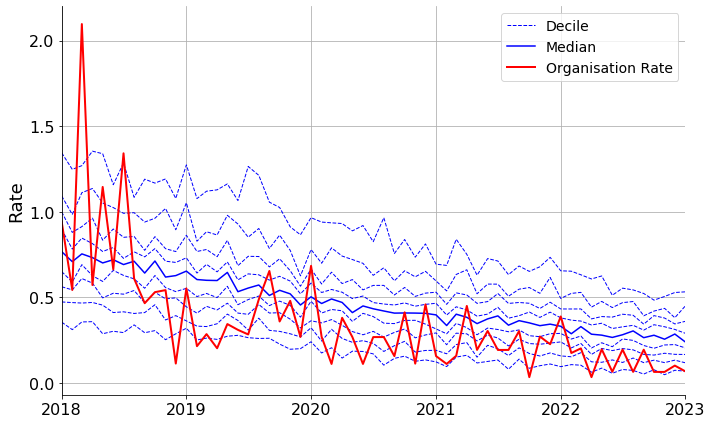

<h4><a href=https://openprescribing.net/measure/lpminocycline/sicbl/02E>NHS WARRINGTON</a></h4>

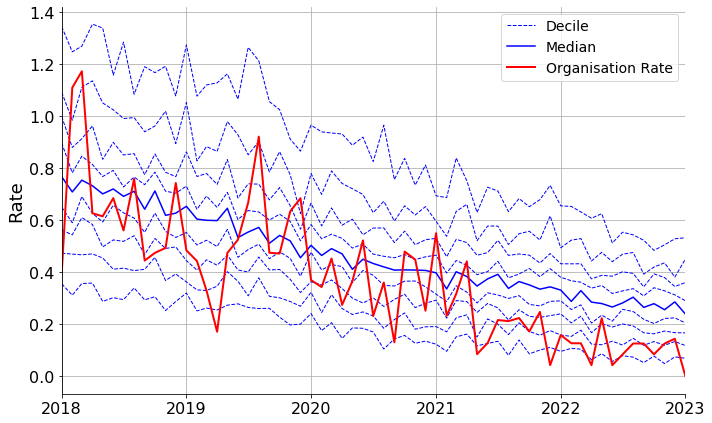

<h4><a href=https://openprescribing.net/measure/lpminocycline/sicbl/05V>NHS STAFFORD AND SURROUNDS</a></h4>

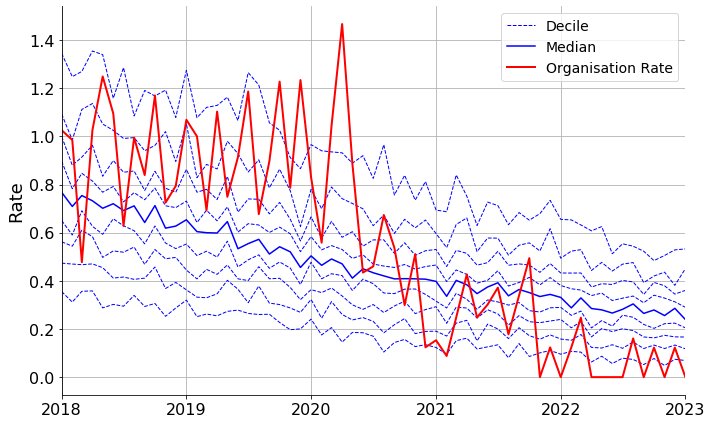

<h2 id=lpneedles><a href=https://openprescribing.net/measure/lpneedles>NHS England Low Priority Treatment - Higher Cost Insulin Pen Needles</a></h2>

<h4><a href=https://openprescribing.net/measure/lpneedles/sicbl/01G>NHS SALFORD</a></h4>

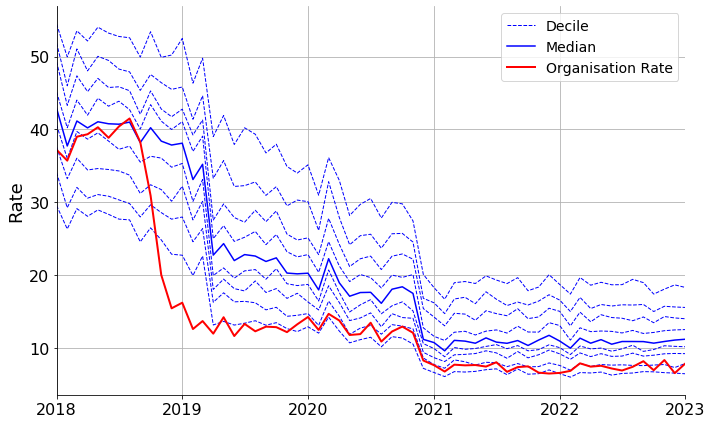

<h4><a href=https://openprescribing.net/measure/lpneedles/sicbl/01H>NHS NORTH CUMBRIA</a></h4>

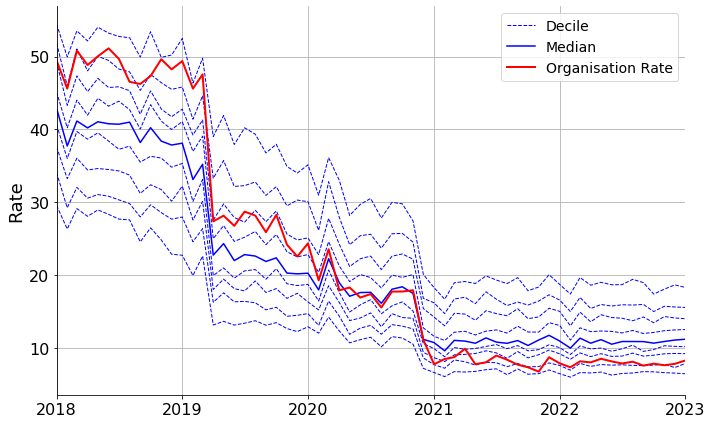

<h4><a href=https://openprescribing.net/measure/lpneedles/sicbl/01K>NHS MORECAMBE BAY</a></h4>

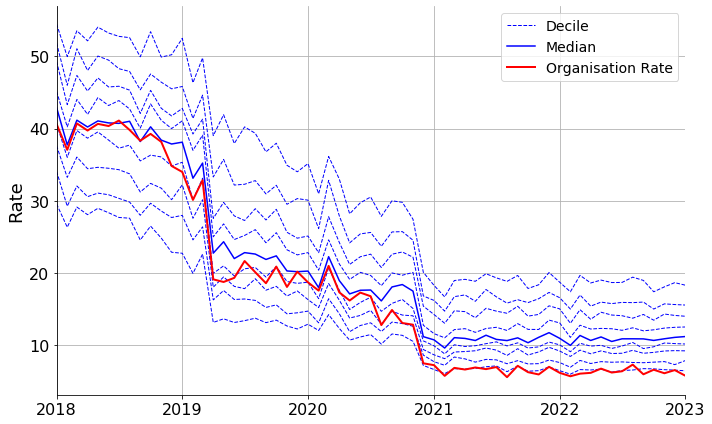

<h4><a href=https://openprescribing.net/measure/lpneedles/sicbl/03R>NHS WAKEFIELD</a></h4>

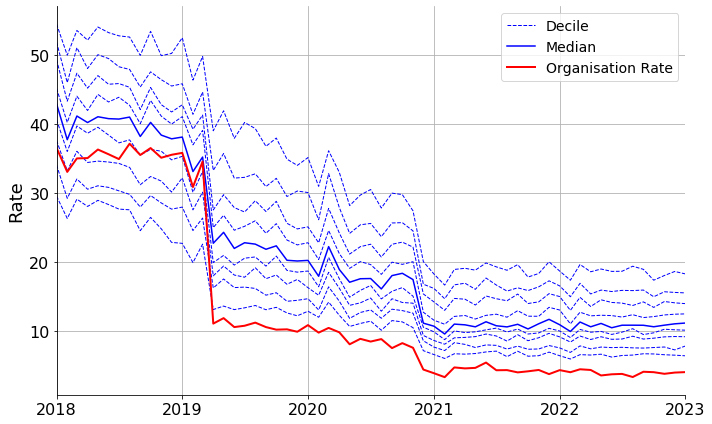

<h4><a href=https://openprescribing.net/measure/lpneedles/sicbl/05V>NHS STAFFORD AND SURROUNDS</a></h4>

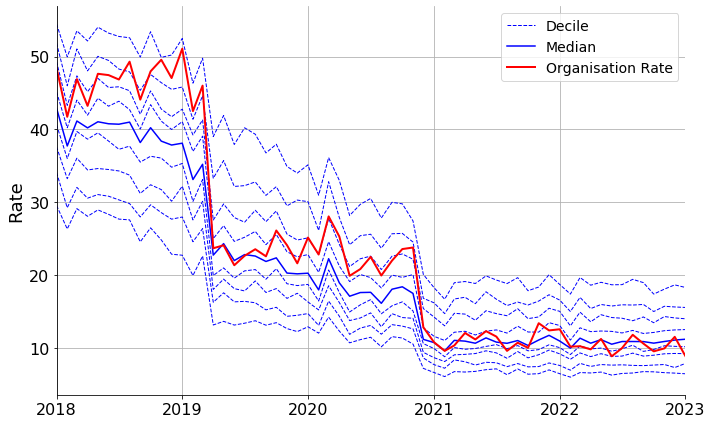

<h2 id=lpomega3><a href=https://openprescribing.net/measure/lpomega3>NHS England Low Priority Treatment - omega-3 fatty acid compounds</a></h2>

<h4><a href=https://openprescribing.net/measure/lpomega3/sicbl/00Q>NHS BLACKBURN WITH DARWEN</a></h4>

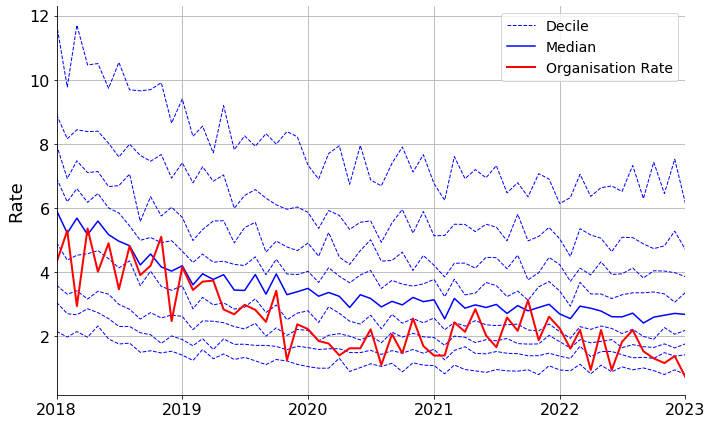

<h4><a href=https://openprescribing.net/measure/lpomega3/sicbl/10R>NHS PORTSMOUTH</a></h4>

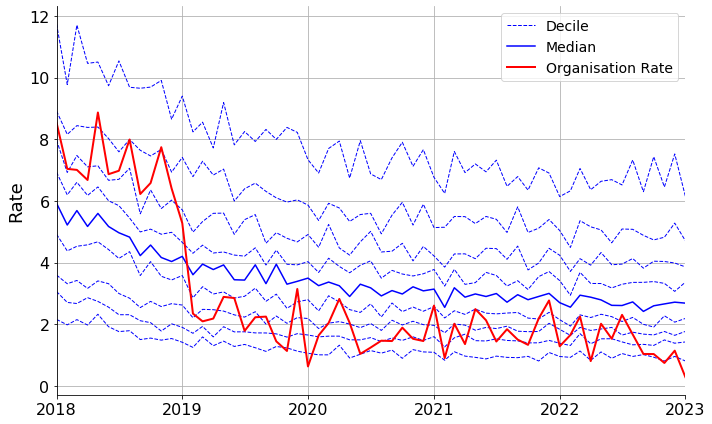

<h4><a href=https://openprescribing.net/measure/lpomega3/sicbl/84H>NHS COUNTY DURHAM</a></h4>

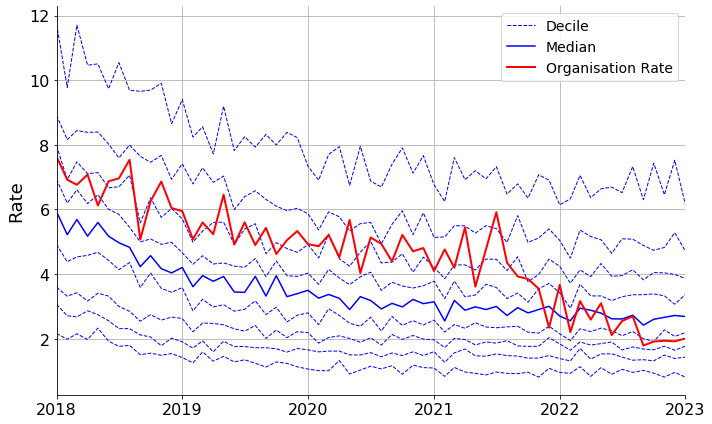

<h4><a href=https://openprescribing.net/measure/lpomega3/sicbl/99F>NHS CASTLE POINT AND ROCHFORD</a></h4>

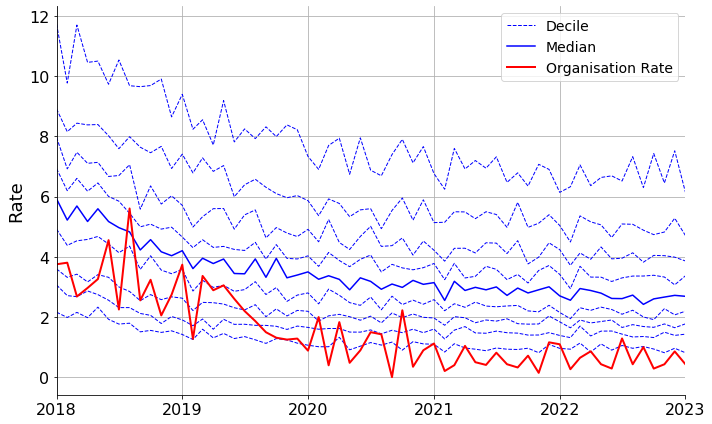

<h2 id=lpoxycodone><a href=https://openprescribing.net/measure/lpoxycodone>NHS England Low Priority Treatment - oxycodone and naloxone combination product</a></h2>

<h4><a href=https://openprescribing.net/measure/lpoxycodone/sicbl/02T>NHS CALDERDALE</a></h4>

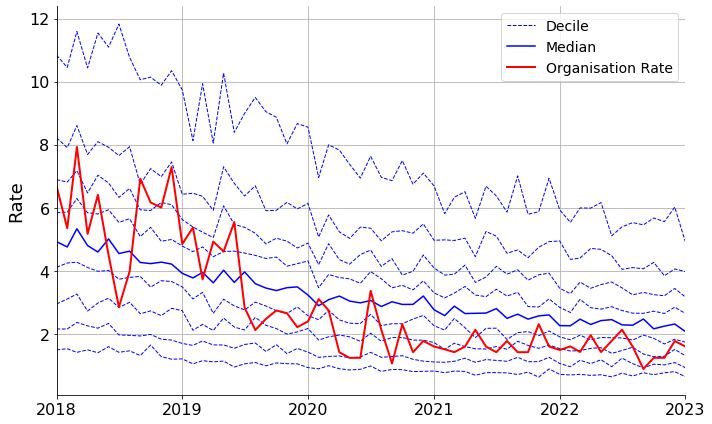

<h4><a href=https://openprescribing.net/measure/lpoxycodone/sicbl/03R>NHS WAKEFIELD</a></h4>

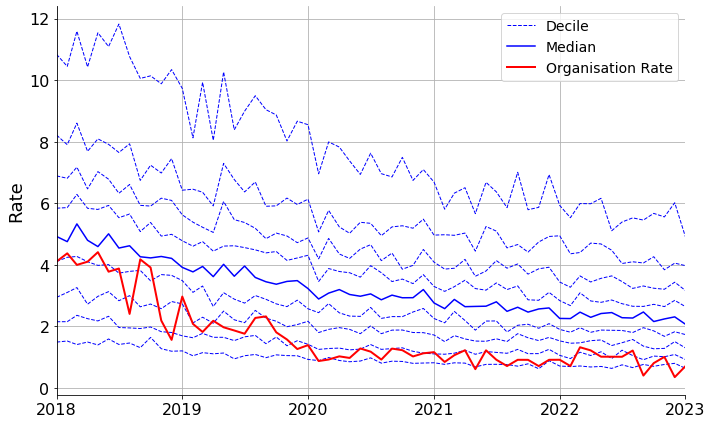

<h4><a href=https://openprescribing.net/measure/lpoxycodone/sicbl/42D>NHS NORTH YORKSHIRE</a></h4>

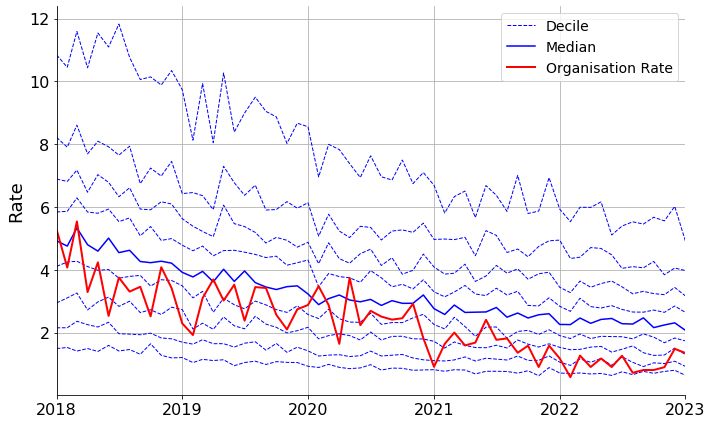

<h2 id=lpperindopril><a href=https://openprescribing.net/measure/lpperindopril>NHS England Low Priority Treatment - perindopril arginine</a></h2>

<h4><a href=https://openprescribing.net/measure/lpperindopril/sicbl/00L>NHS NORTHUMBERLAND</a></h4>

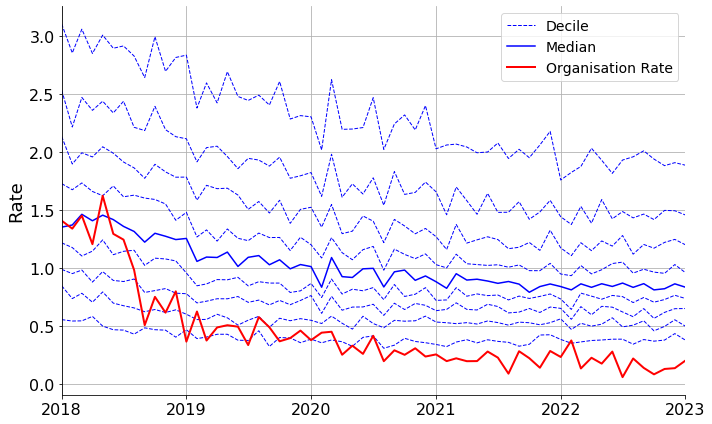

<h4><a href=https://openprescribing.net/measure/lpperindopril/sicbl/00Y>NHS OLDHAM</a></h4>

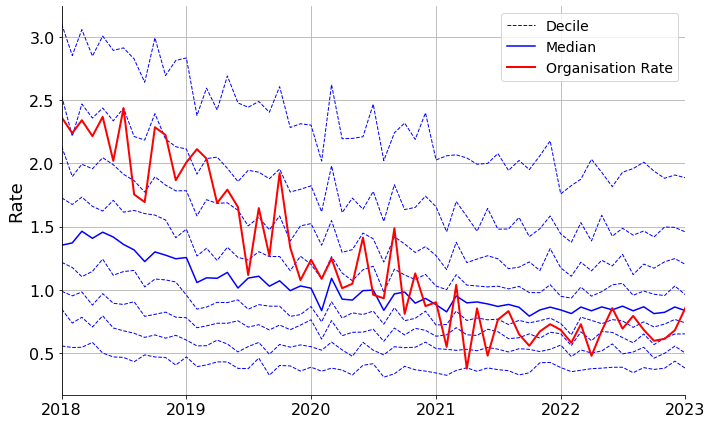

<h4><a href=https://openprescribing.net/measure/lpperindopril/sicbl/06Q>NHS MID ESSEX</a></h4>

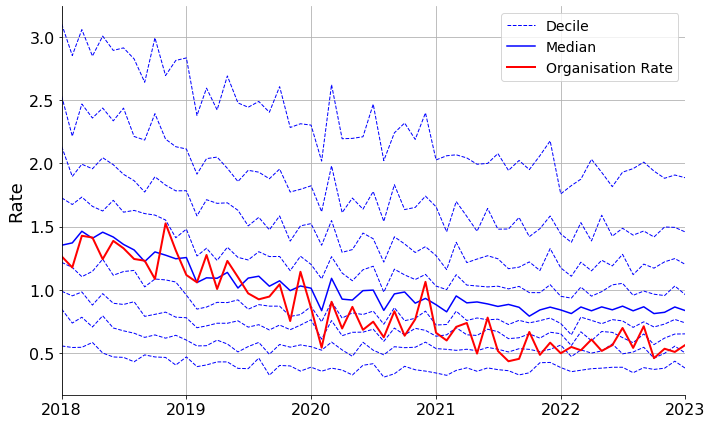

<h4><a href=https://openprescribing.net/measure/lpperindopril/sicbl/10R>NHS PORTSMOUTH</a></h4>

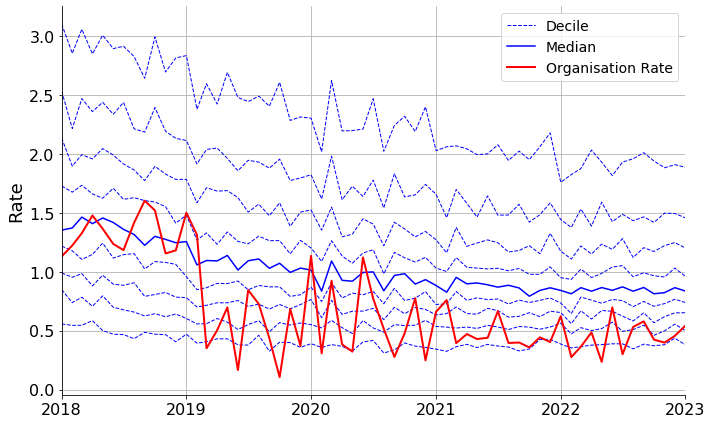

<h4><a href=https://openprescribing.net/measure/lpperindopril/sicbl/18C>NHS HEREFORDSHIRE AND WORCESTERSHIRE</a></h4>

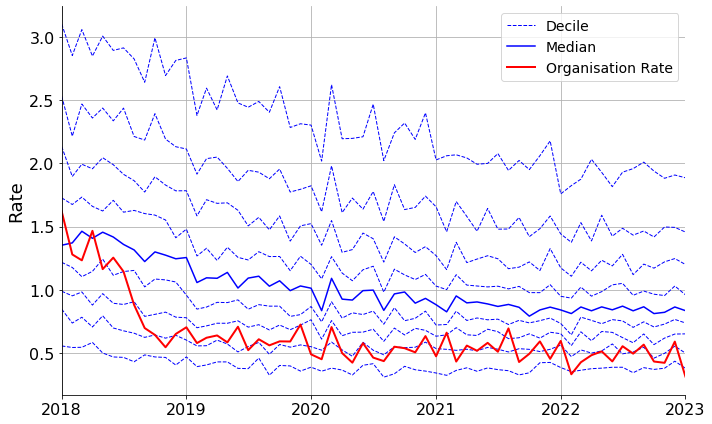

<h2 id=lprubefacients><a href=https://openprescribing.net/measure/lprubefacients>NHS England Low Priority Treatment - rubefacients</a></h2>

<h4><a href=https://openprescribing.net/measure/lprubefacients/sicbl/02E>NHS WARRINGTON</a></h4>

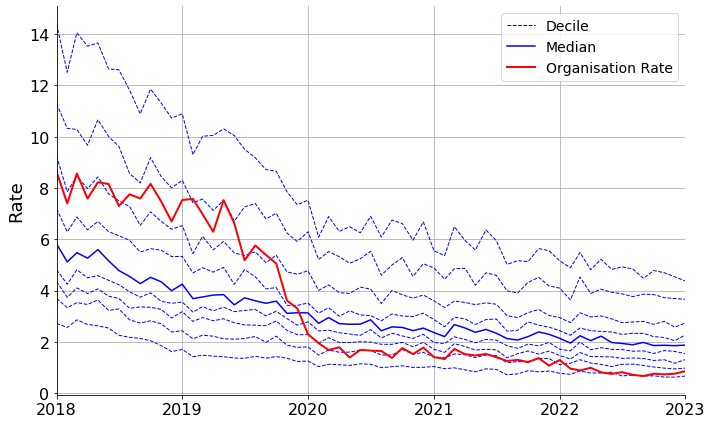

<h4><a href=https://openprescribing.net/measure/lprubefacients/sicbl/02T>NHS CALDERDALE</a></h4>

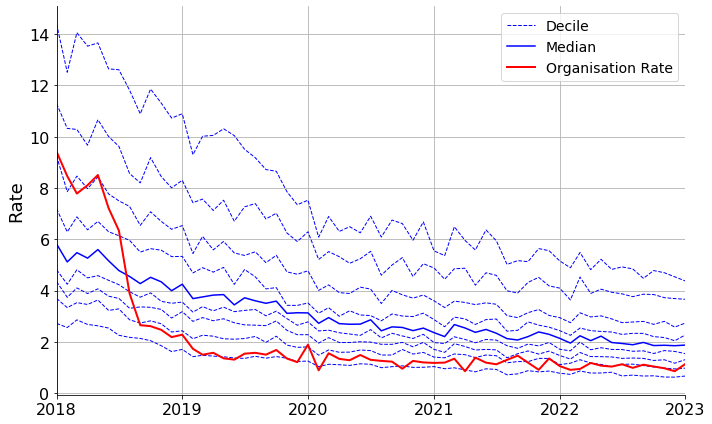

<h4><a href=https://openprescribing.net/measure/lprubefacients/sicbl/06K>NHS EAST AND NORTH HERTFORDSHIRE</a></h4>

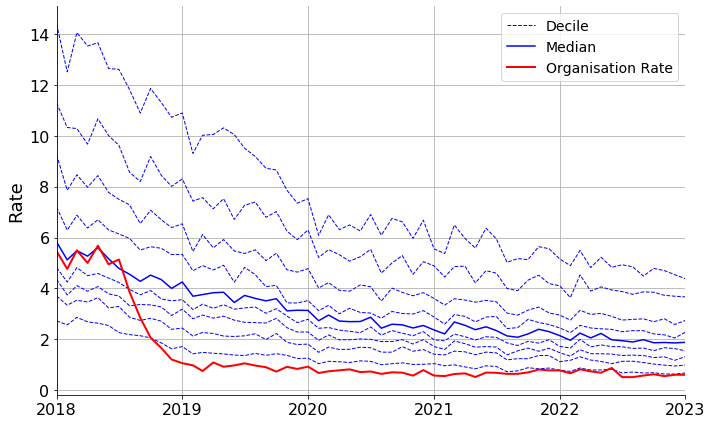

<h4><a href=https://openprescribing.net/measure/lprubefacients/sicbl/15F>NHS LEEDS</a></h4>

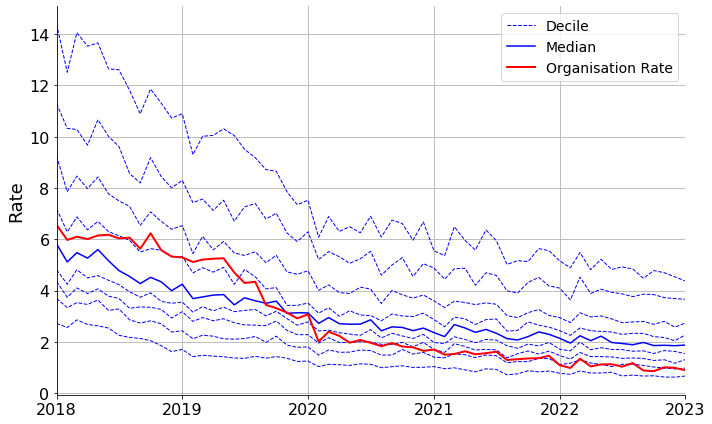

<h2 id=lpsilkgarments><a href=https://openprescribing.net/measure/lpsilkgarments>NHS England Low Priority Treatment - Silk Garments</a></h2>

<h4><a href=https://openprescribing.net/measure/lpsilkgarments/sicbl/01X>NHS ST HELENS</a></h4>

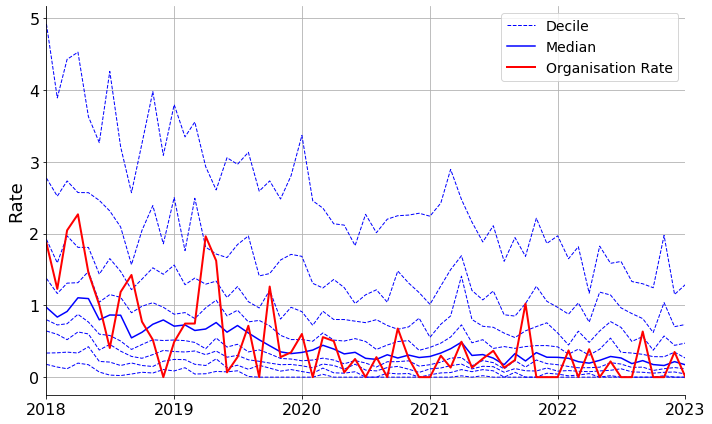

<h4><a href=https://openprescribing.net/measure/lpsilkgarments/sicbl/06L>NHS IPSWICH AND EAST SUFFOLK</a></h4>

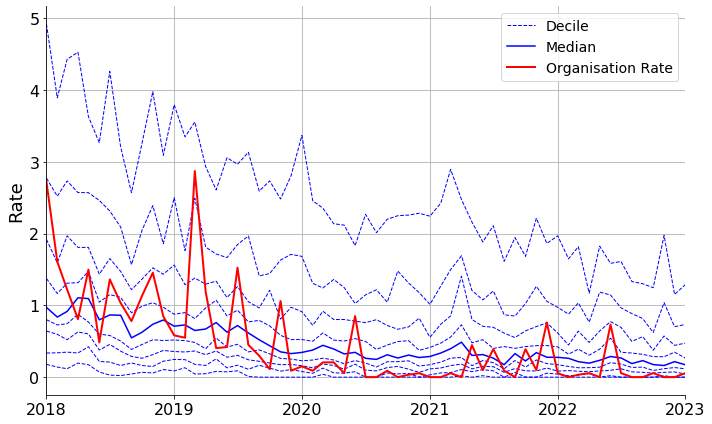

<h2 id=lptadalafil><a href=https://openprescribing.net/measure/lptadalafil>NHS England Low Priority Treatment - tadalafil once daily</a></h2>

<h4><a href=https://openprescribing.net/measure/lptadalafil/sicbl/01A>NHS EAST LANCASHIRE</a></h4>

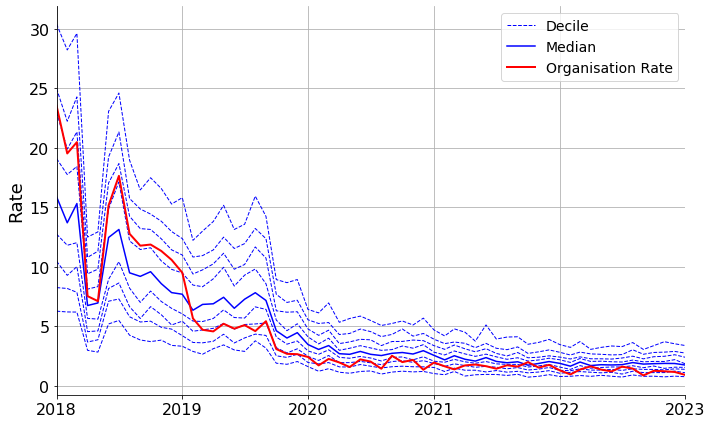

<h4><a href=https://openprescribing.net/measure/lptadalafil/sicbl/02E>NHS WARRINGTON</a></h4>

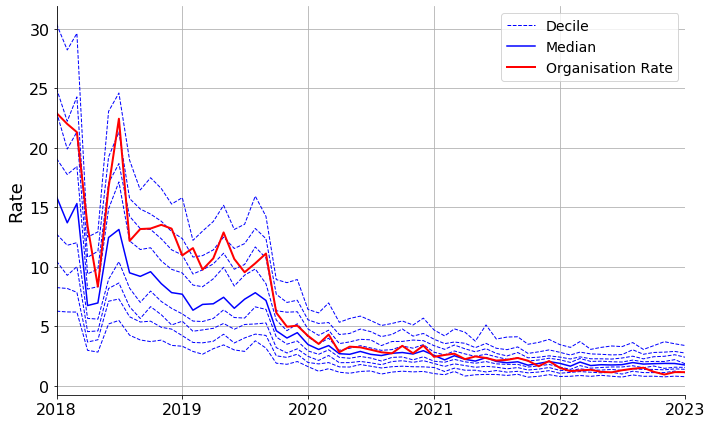

<h4><a href=https://openprescribing.net/measure/lptadalafil/sicbl/03H>NHS NORTH EAST LINCOLNSHIRE</a></h4>

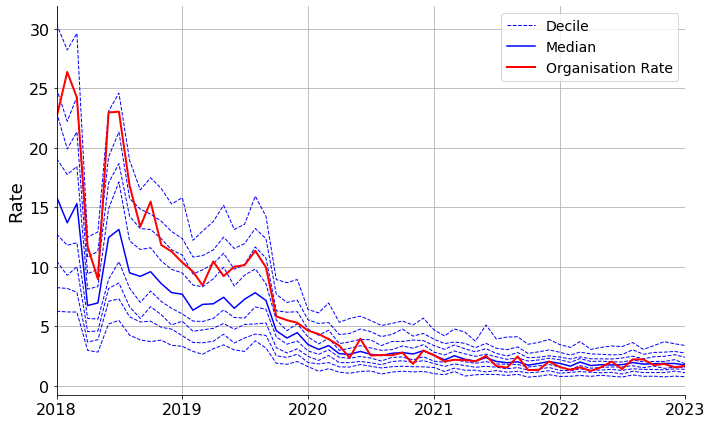

<h4><a href=https://openprescribing.net/measure/lptadalafil/sicbl/07G>NHS THURROCK</a></h4>

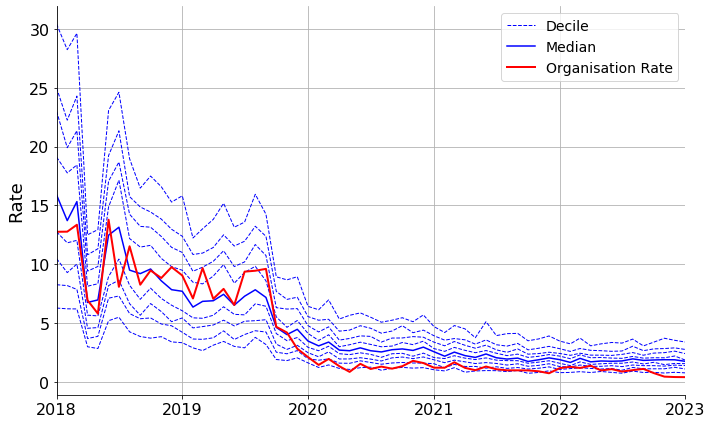

<h4><a href=https://openprescribing.net/measure/lptadalafil/sicbl/15C>NHS BRISTOL, NORTH SOMERSET AND SOUTH GLOUCESTERSHIRE</a></h4>

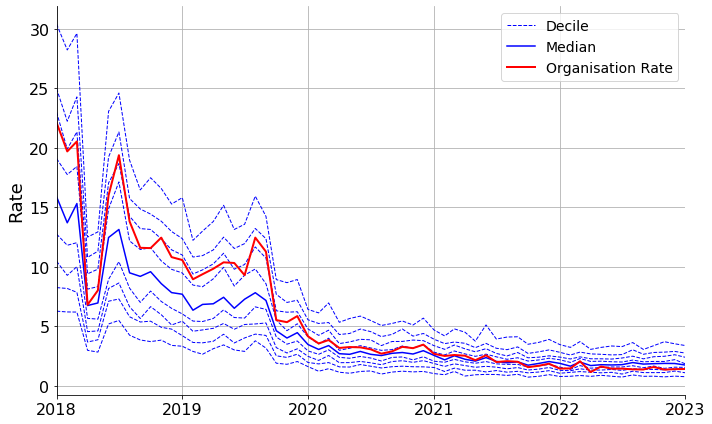

<h2 id=lptramadolpara><a href=https://openprescribing.net/measure/lptramadolpara>NHS England Low Priority Treatment - paracetamol and tramadol combination</a></h2>

<h4><a href=https://openprescribing.net/measure/lptramadolpara/sicbl/00N>NHS SOUTH TYNESIDE</a></h4>

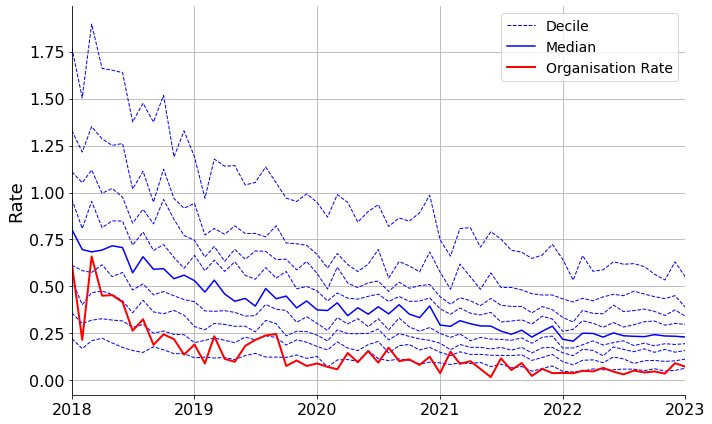

<h4><a href=https://openprescribing.net/measure/lptramadolpara/sicbl/00Y>NHS OLDHAM</a></h4>

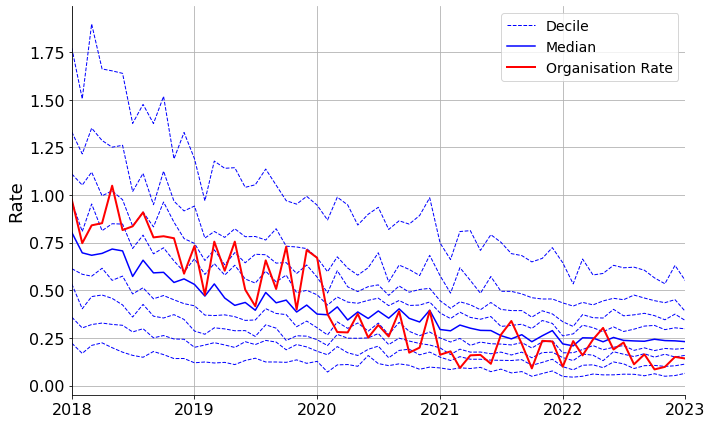

<h4><a href=https://openprescribing.net/measure/lptramadolpara/sicbl/01E>NHS GREATER PRESTON</a></h4>

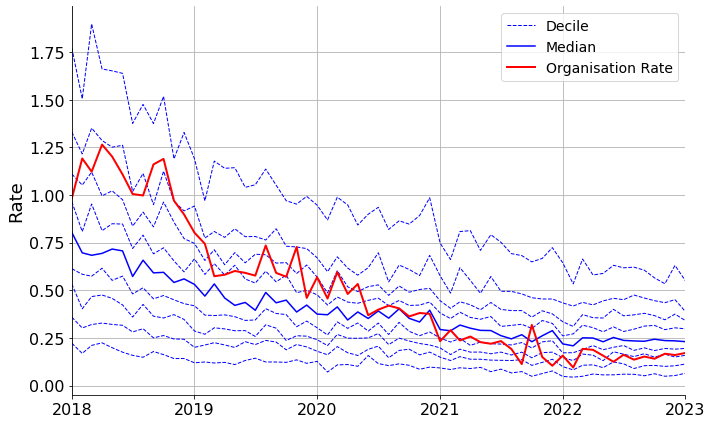

<h4><a href=https://openprescribing.net/measure/lptramadolpara/sicbl/01J>NHS KNOWSLEY</a></h4>

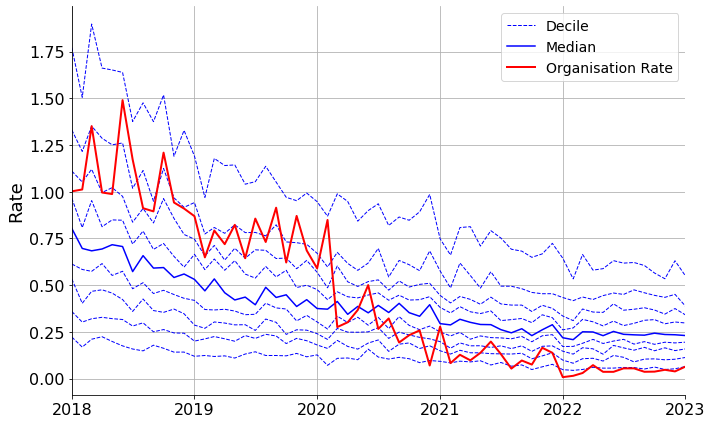

<h4><a href=https://openprescribing.net/measure/lptramadolpara/sicbl/02E>NHS WARRINGTON</a></h4>

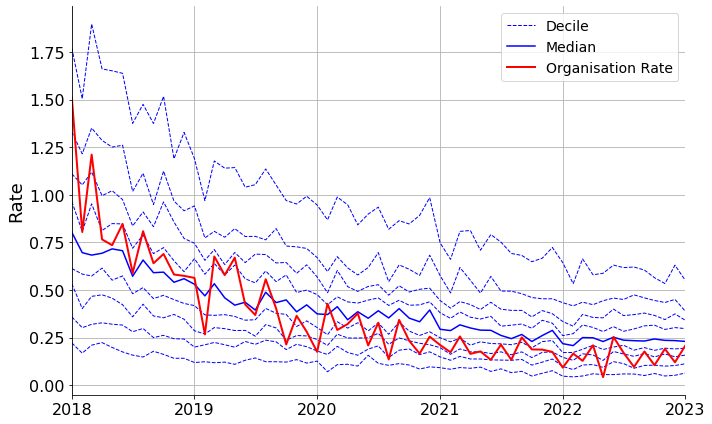

<h2 id=lptravelvacs><a href=https://openprescribing.net/measure/lptravelvacs>NHS England Low Priority Treatment - travel vaccines</a></h2>

<h4><a href=https://openprescribing.net/measure/lptravelvacs/sicbl/01W>NHS STOCKPORT</a></h4>

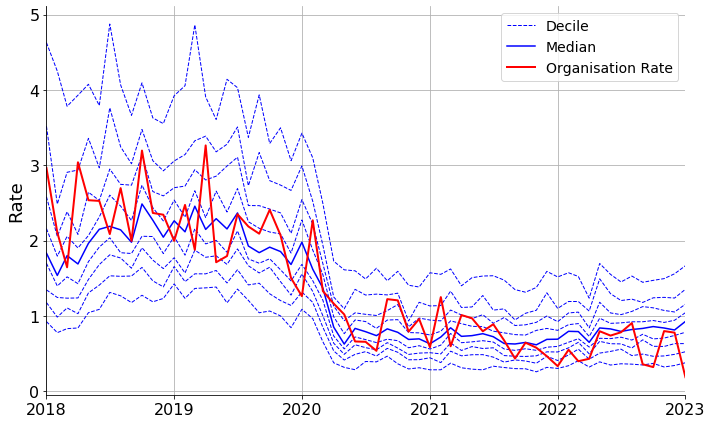

<h4><a href=https://openprescribing.net/measure/lptravelvacs/sicbl/01Y>NHS TAMESIDE AND GLOSSOP</a></h4>

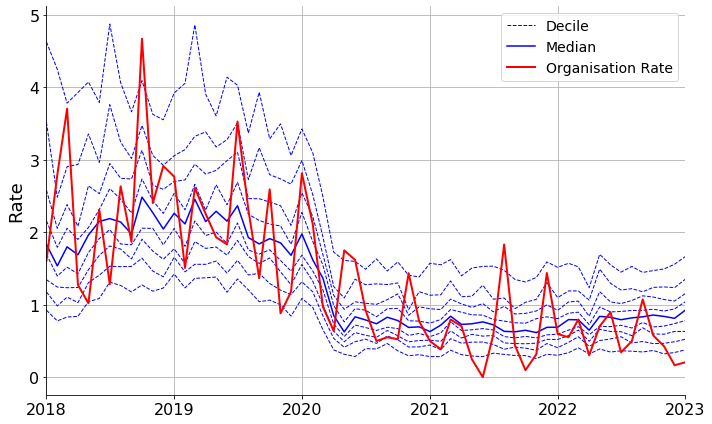

<h4><a href=https://openprescribing.net/measure/lptravelvacs/sicbl/02A>NHS TRAFFORD</a></h4>

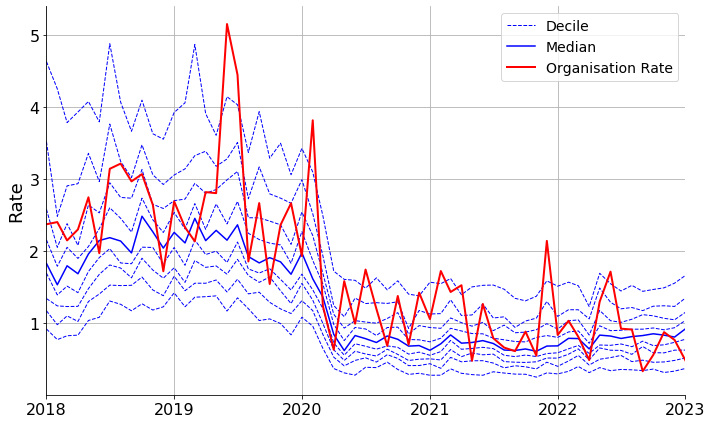

<h4><a href=https://openprescribing.net/measure/lptravelvacs/sicbl/05G>NHS NORTH STAFFORDSHIRE</a></h4>

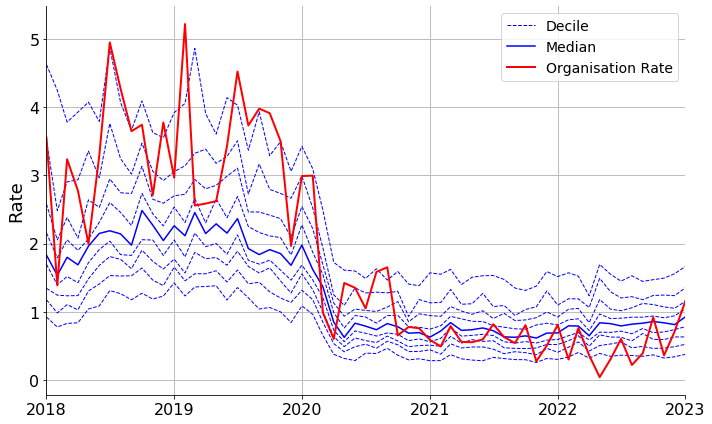

<h4><a href=https://openprescribing.net/measure/lptravelvacs/sicbl/05V>NHS STAFFORD AND SURROUNDS</a></h4>

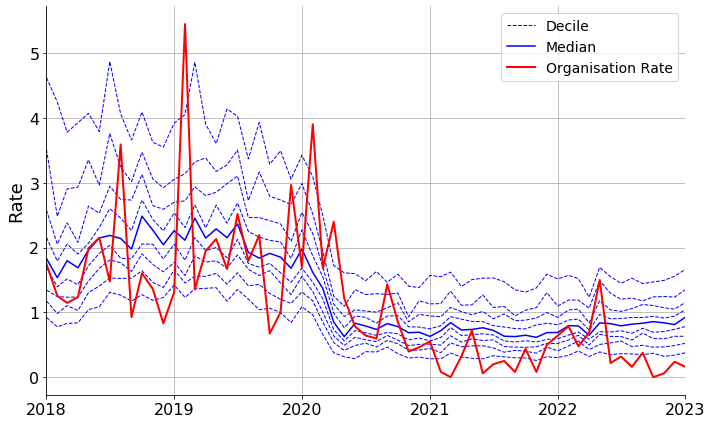

<h2 id=lptrimipramine><a href=https://openprescribing.net/measure/lptrimipramine>NHS England Low Priority Treatment - trimipramine</a></h2>

<h4><a href=https://openprescribing.net/measure/lptrimipramine/sicbl/01W>NHS STOCKPORT</a></h4>

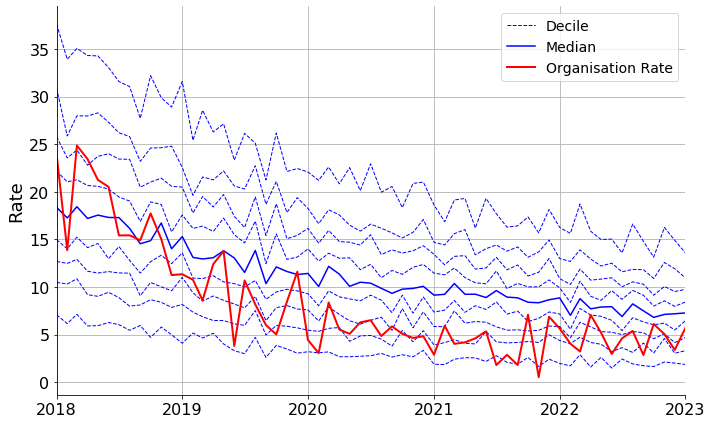

<h4><a href=https://openprescribing.net/measure/lptrimipramine/sicbl/02H>NHS WIGAN BOROUGH</a></h4>

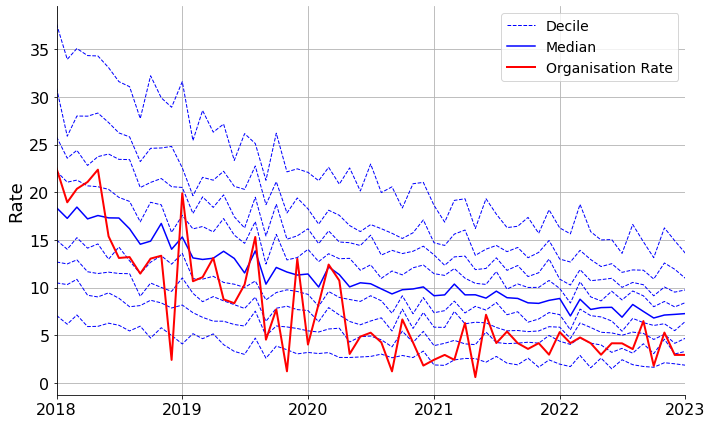

<h4><a href=https://openprescribing.net/measure/lptrimipramine/sicbl/04Y>NHS CANNOCK CHASE</a></h4>

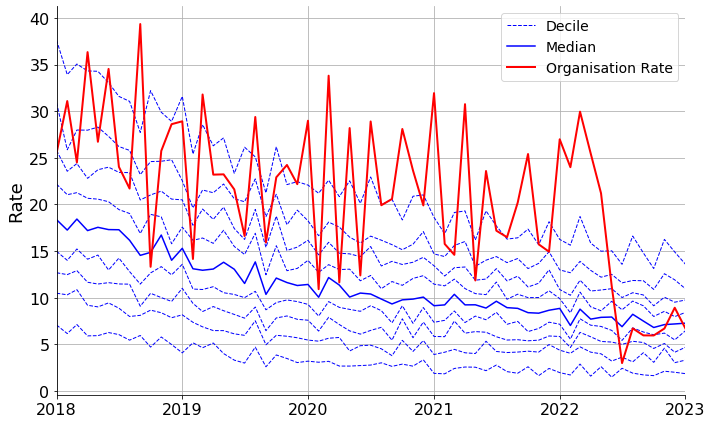

<h4><a href=https://openprescribing.net/measure/lptrimipramine/sicbl/10R>NHS PORTSMOUTH</a></h4>

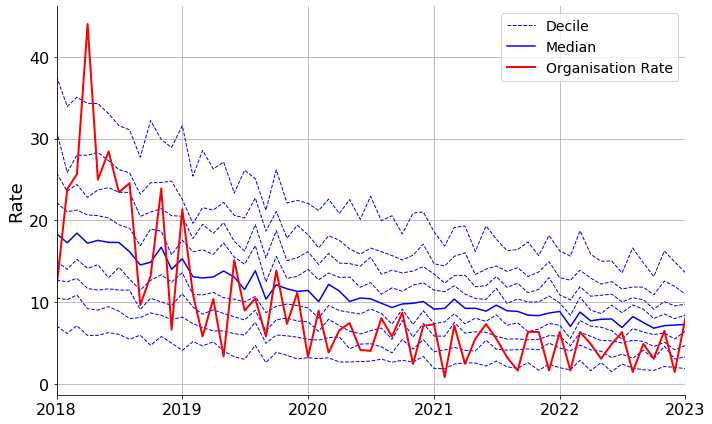

<h4><a href=https://openprescribing.net/measure/lptrimipramine/sicbl/99F>NHS CASTLE POINT AND ROCHFORD</a></h4>

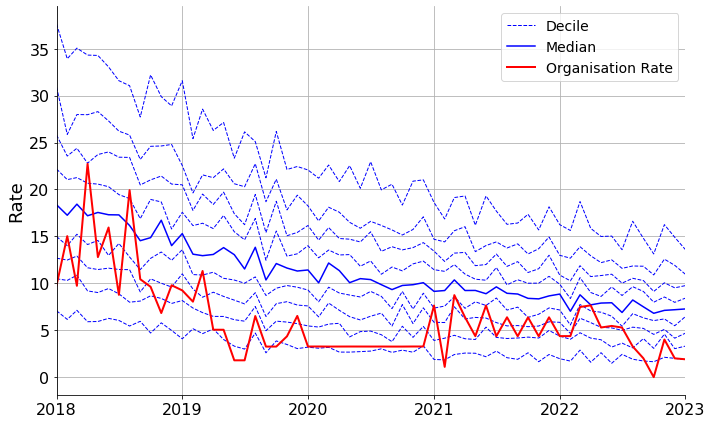

<h2 id=lpzomnibus><a href=https://openprescribing.net/measure/lpzomnibus>NHS England Low Priority Treatment - All Low Priority Treatments</a></h2>

<h4><a href=https://openprescribing.net/measure/lpzomnibus/sicbl/03L>NHS ROTHERHAM</a></h4>

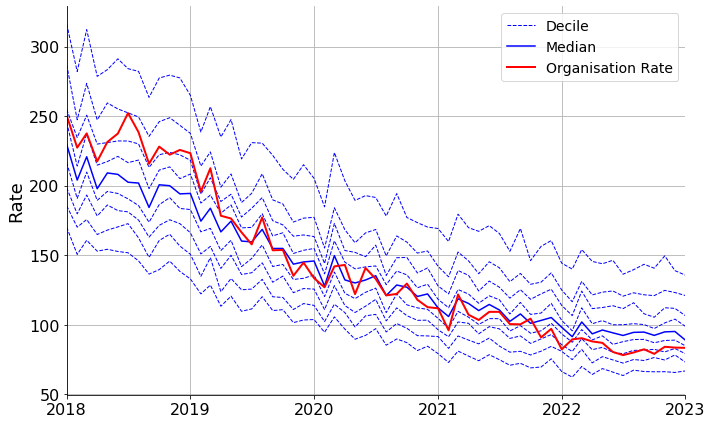

<h4><a href=https://openprescribing.net/measure/lpzomnibus/sicbl/07G>NHS THURROCK</a></h4>

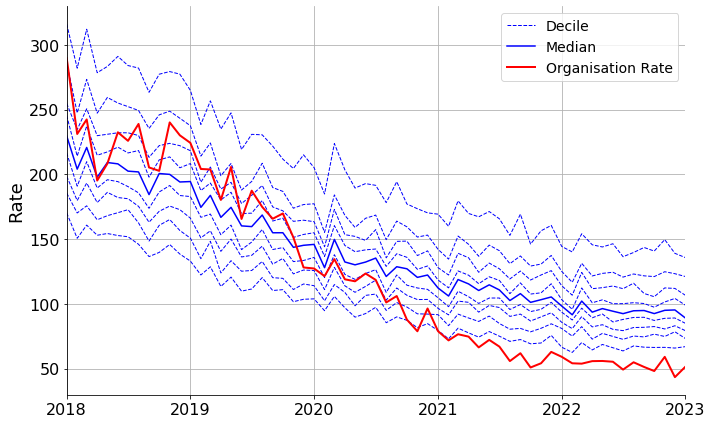

<h4><a href=https://openprescribing.net/measure/lpzomnibus/sicbl/07H>NHS WEST ESSEX</a></h4>

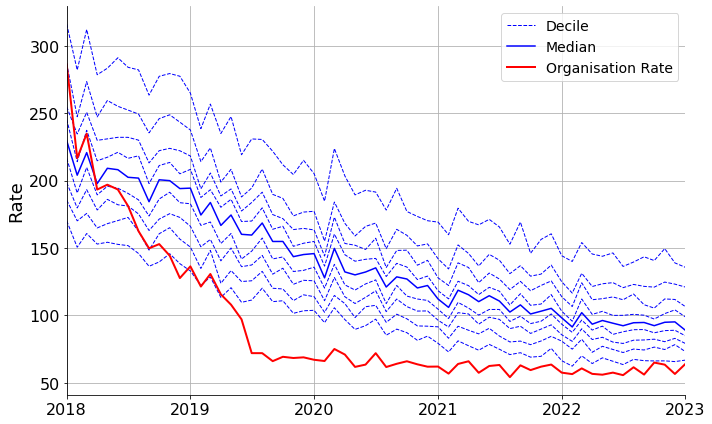

<h4><a href=https://openprescribing.net/measure/lpzomnibus/sicbl/27D>NHS CHESHIRE</a></h4>

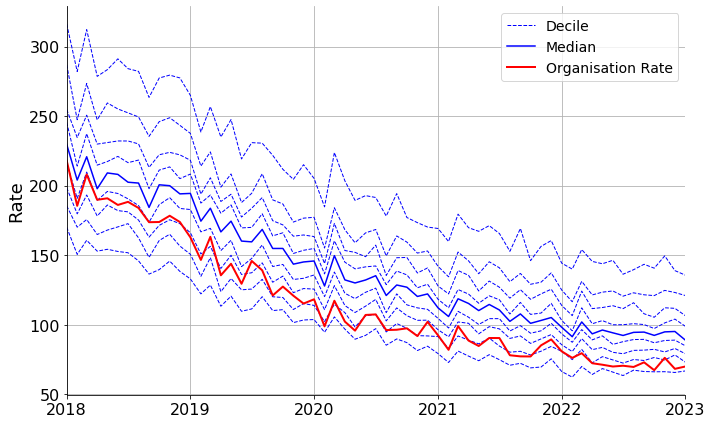

<h2 id=lyrica><a href=https://openprescribing.net/measure/lyrica>Pregabalin capsules prescribed as Lyrica</a></h2>

<h4><a href=https://openprescribing.net/measure/lyrica/sicbl/00L>NHS NORTHUMBERLAND</a></h4>

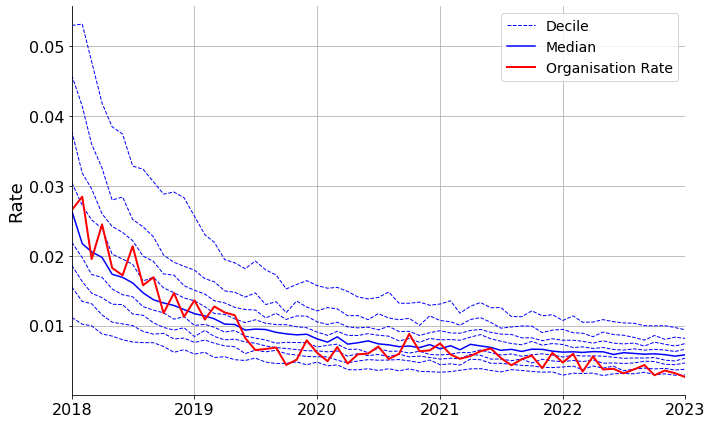

<h4><a href=https://openprescribing.net/measure/lyrica/sicbl/00Y>NHS OLDHAM</a></h4>

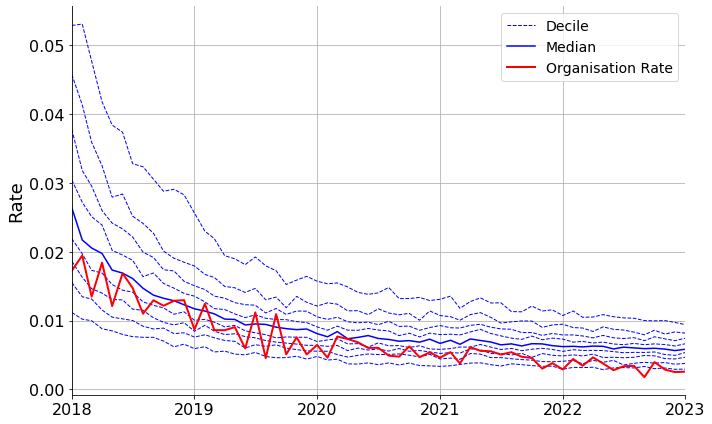

<h4><a href=https://openprescribing.net/measure/lyrica/sicbl/01E>NHS GREATER PRESTON</a></h4>

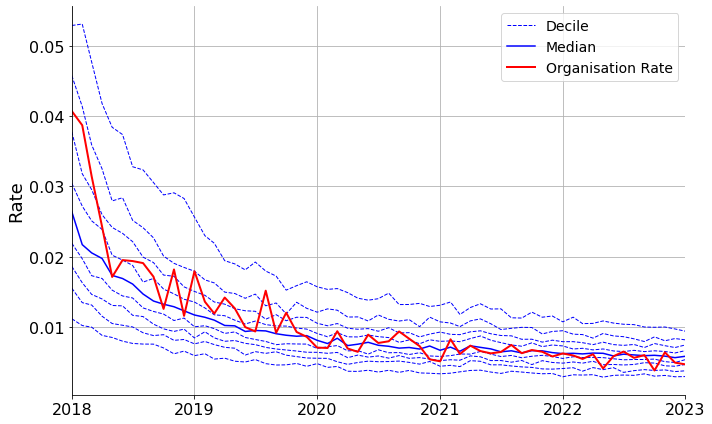

<h4><a href=https://openprescribing.net/measure/lyrica/sicbl/01F>NHS HALTON</a></h4>

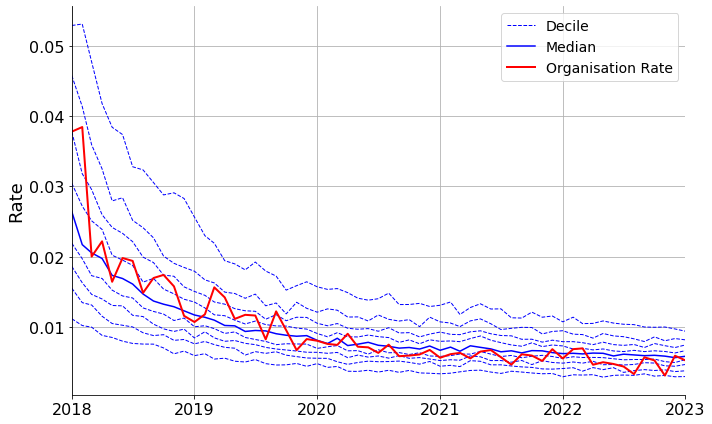

<h4><a href=https://openprescribing.net/measure/lyrica/sicbl/01J>NHS KNOWSLEY</a></h4>

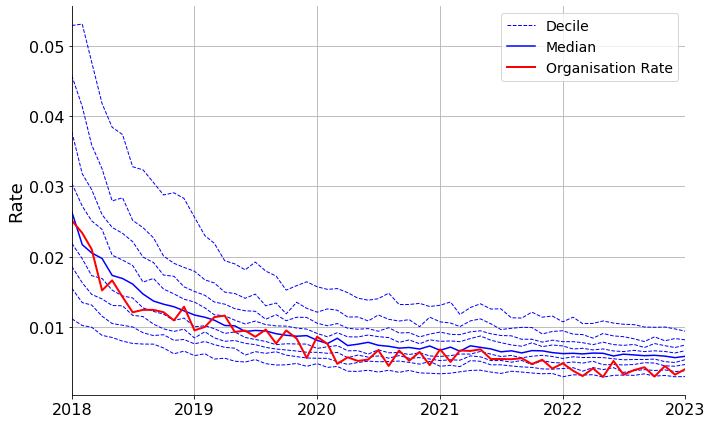

<h2 id=methotrexate><a href=https://openprescribing.net/measure/methotrexate>Methotrexate 10 mg tablets </a></h2>

No organisations identified for this measure.

<h2 id=nimodipine><a href=https://openprescribing.net/measure/nimodipine>Prescribing of nimodipine</a></h2>

No organisations identified for this measure.

<h2 id=opioidome><a href=https://openprescribing.net/measure/opioidome>Prescribing of opioids (total oral morphine equivalence)</a></h2>

No organisations identified for this measure.

<h2 id=opioidper1000><a href=https://openprescribing.net/measure/opioidper1000>High dose opioids per 1000 patients</a></h2>

<h4><a href=https://openprescribing.net/measure/opioidper1000/sicbl/01E>NHS GREATER PRESTON</a></h4>

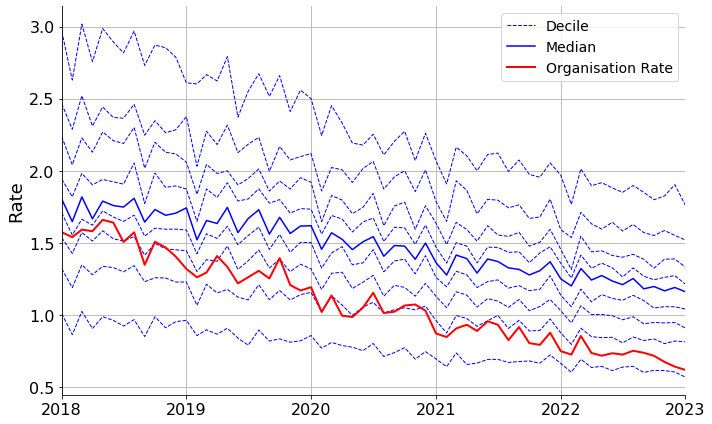

<h4><a href=https://openprescribing.net/measure/opioidper1000/sicbl/09D>NHS BRIGHTON AND HOVE</a></h4>

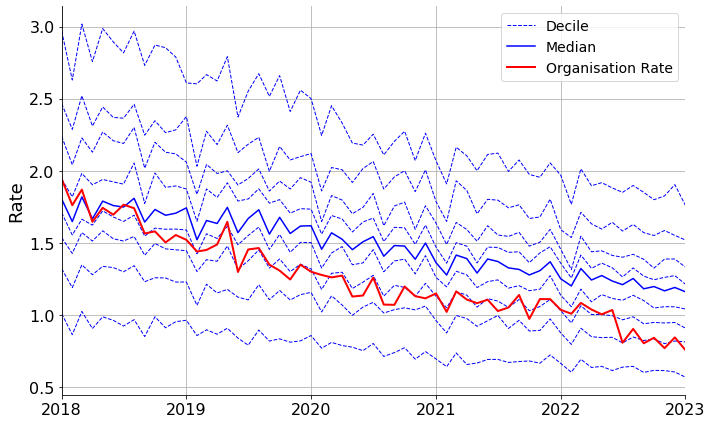

<h4><a href=https://openprescribing.net/measure/opioidper1000/sicbl/13T>NHS NEWCASTLE GATESHEAD</a></h4>

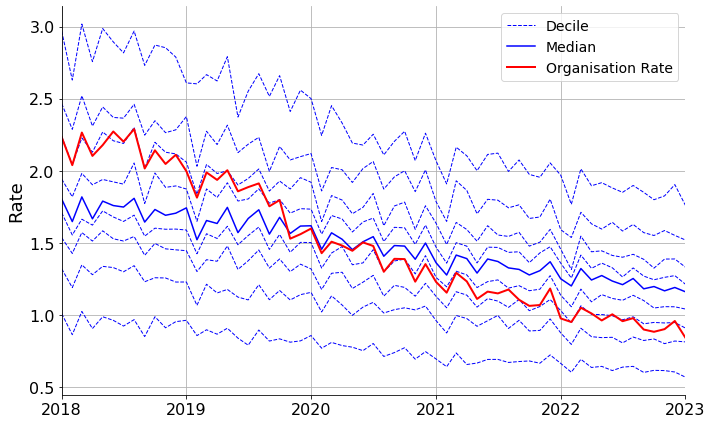

<h2 id=opioidspercent><a href=https://openprescribing.net/measure/opioidspercent>High dose opioid items as percentage regular opioids</a></h2>

<h4><a href=https://openprescribing.net/measure/opioidspercent/sicbl/07H>NHS WEST ESSEX</a></h4>

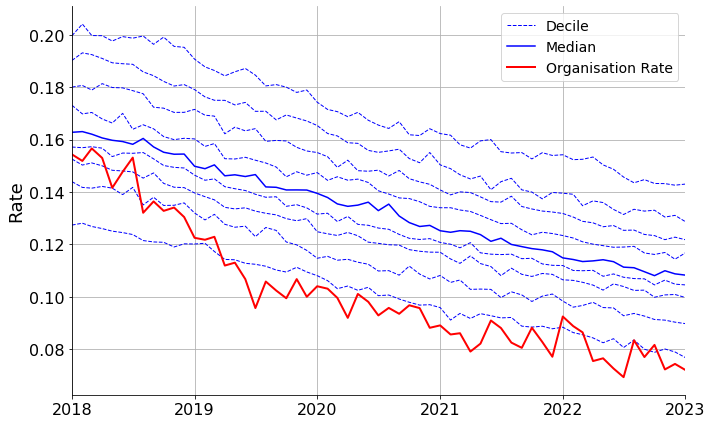

<h4><a href=https://openprescribing.net/measure/opioidspercent/sicbl/09D>NHS BRIGHTON AND HOVE</a></h4>

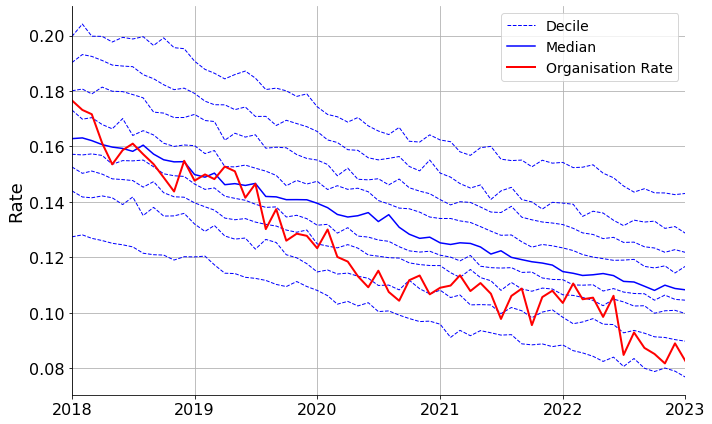

<h4><a href=https://openprescribing.net/measure/opioidspercent/sicbl/13T>NHS NEWCASTLE GATESHEAD</a></h4>

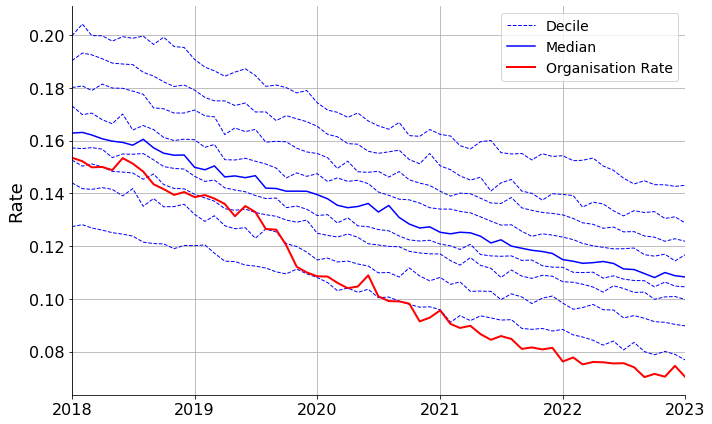

<h4><a href=https://openprescribing.net/measure/opioidspercent/sicbl/99C>NHS NORTH TYNESIDE</a></h4>

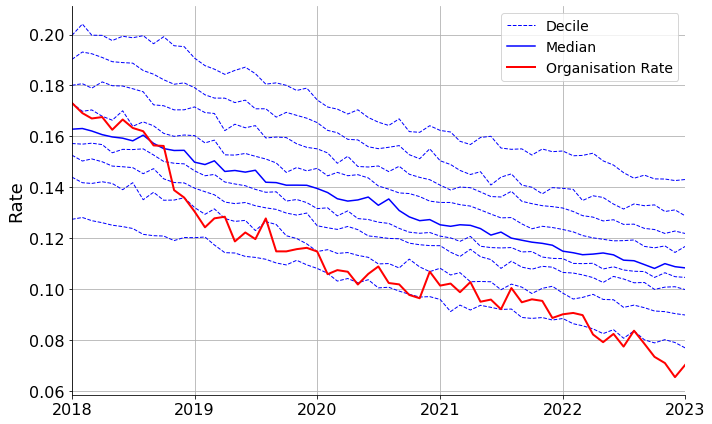

<h2 id=other_lipid_modifying_drugs><a href=https://openprescribing.net/measure/other_lipid_modifying_drugs>Other lipid-modifying drugs</a></h2>

No organisations identified for this measure.

<h2 id=ppi><a href=https://openprescribing.net/measure/ppi>High-cost PPIs</a></h2>

<h4><a href=https://openprescribing.net/measure/ppi/sicbl/02X>NHS DONCASTER</a></h4>

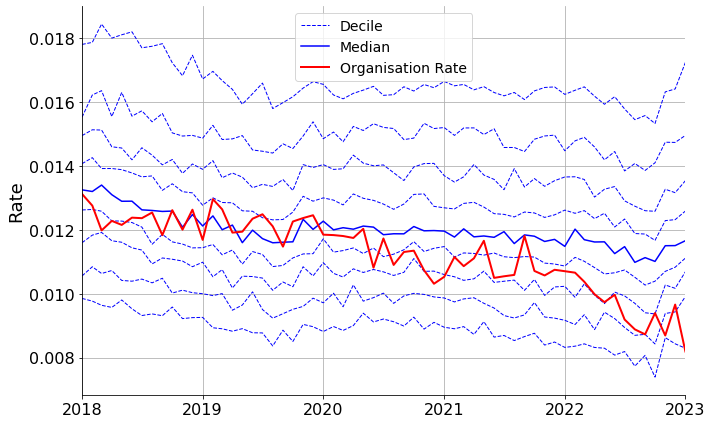

<h4><a href=https://openprescribing.net/measure/ppi/sicbl/06L>NHS IPSWICH AND EAST SUFFOLK</a></h4>

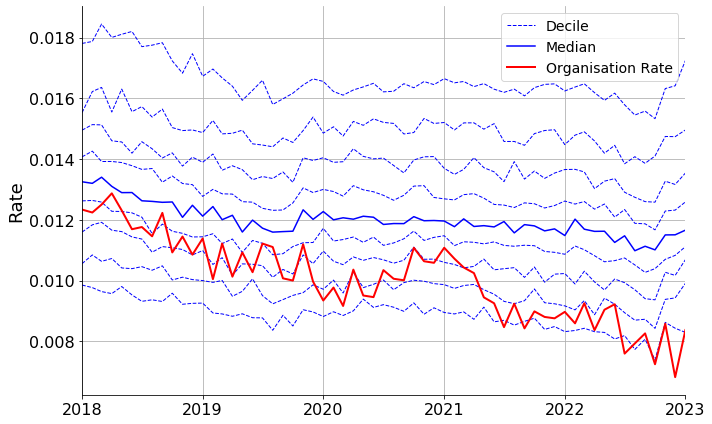

<h4><a href=https://openprescribing.net/measure/ppi/sicbl/07G>NHS THURROCK</a></h4>

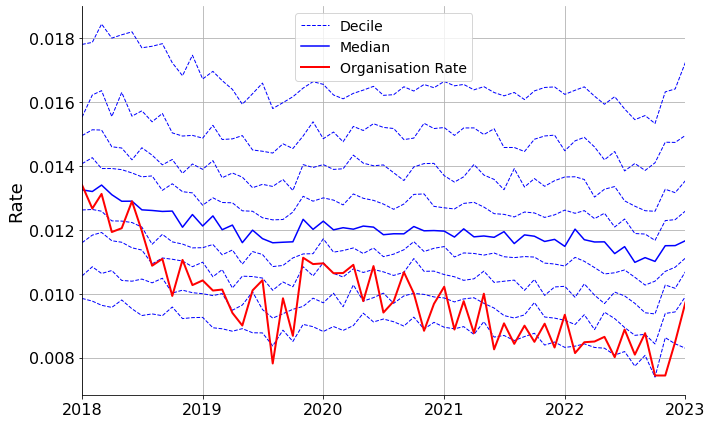

<h4><a href=https://openprescribing.net/measure/ppi/sicbl/18C>NHS HEREFORDSHIRE AND WORCESTERSHIRE</a></h4>

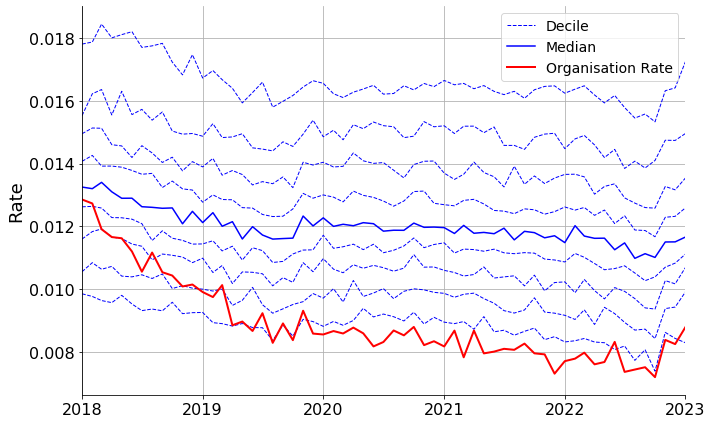

<h2 id=ppidose><a href=https://openprescribing.net/measure/ppidose>Higher dose Proton Pump Inhibitors (PPIs)</a></h2>

No organisations identified for this measure.

<h2 id=pregabalinmg><a href=https://openprescribing.net/measure/pregabalinmg>Prescribing of pregabalin (total mg)</a></h2>

No organisations identified for this measure.

<h2 id=probiotics><a href=https://openprescribing.net/measure/probiotics>Probiotics that have been removed from the drug tariff</a></h2>

<h4><a href=https://openprescribing.net/measure/probiotics/sicbl/01A>NHS EAST LANCASHIRE</a></h4>

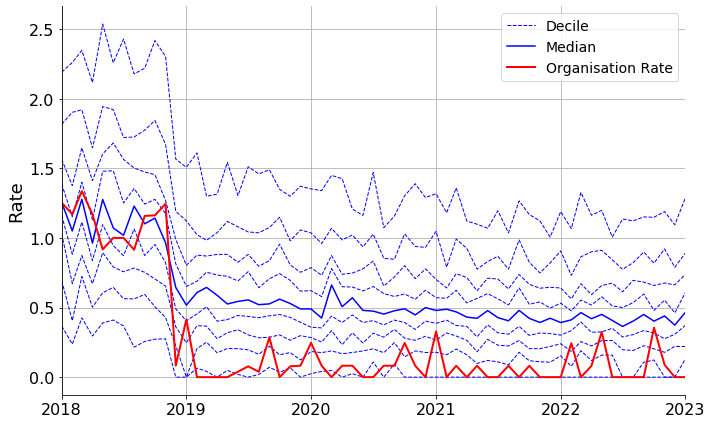

<h4><a href=https://openprescribing.net/measure/probiotics/sicbl/02G>NHS WEST LANCASHIRE</a></h4>

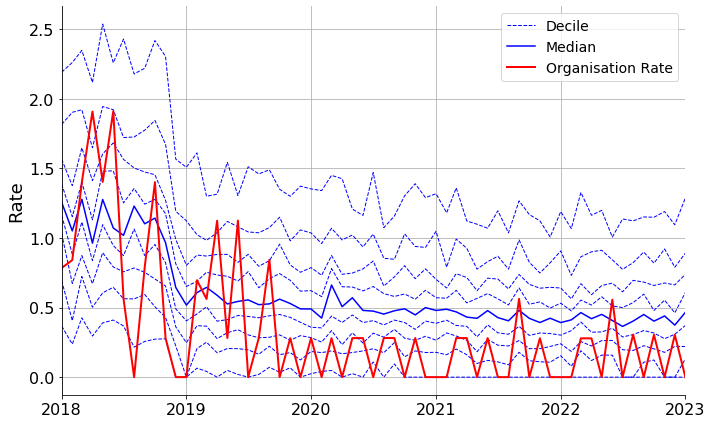

<h4><a href=https://openprescribing.net/measure/probiotics/sicbl/02H>NHS WIGAN BOROUGH</a></h4>

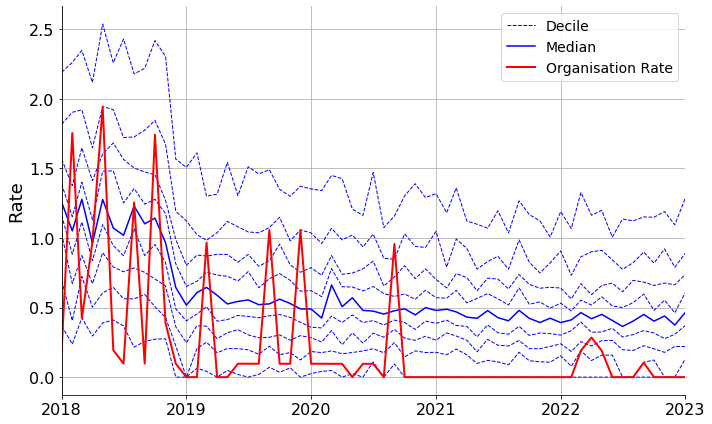

<h4><a href=https://openprescribing.net/measure/probiotics/sicbl/03F>NHS HULL</a></h4>

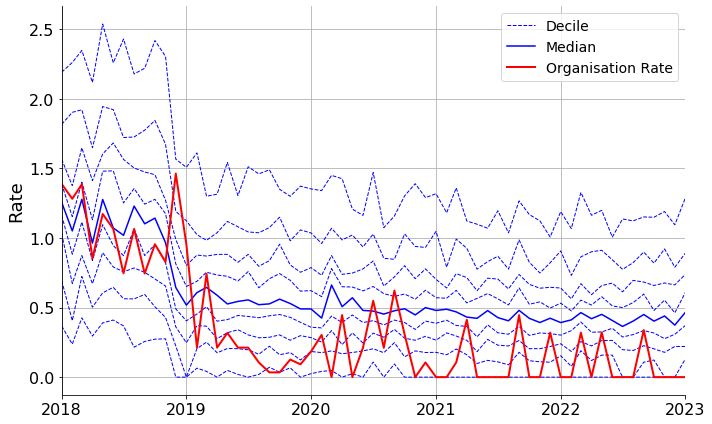

<h4><a href=https://openprescribing.net/measure/probiotics/sicbl/15F>NHS LEEDS</a></h4>

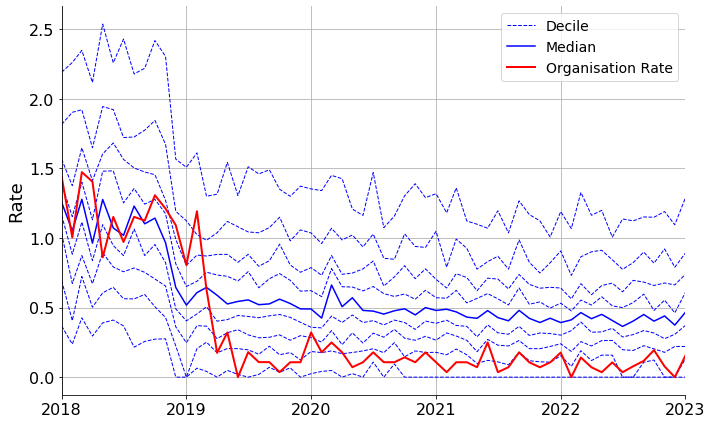

<h2 id=saba><a href=https://openprescribing.net/measure/saba>Short acting beta agonist inhalers</a></h2>

No organisations identified for this measure.

<h2 id=semagglutidequantity><a href=https://openprescribing.net/measure/semagglutidequantity>Possible excess quantities of semaglutide</a></h2>

No organisations identified for this measure.

<h2 id=seven_day_prescribing><a href=https://openprescribing.net/measure/seven_day_prescribing>Seven Day Prescribing for Long Term Conditions</a></h2>

<h4><a href=https://openprescribing.net/measure/seven_day_prescribing/sicbl/07G>NHS THURROCK</a></h4>

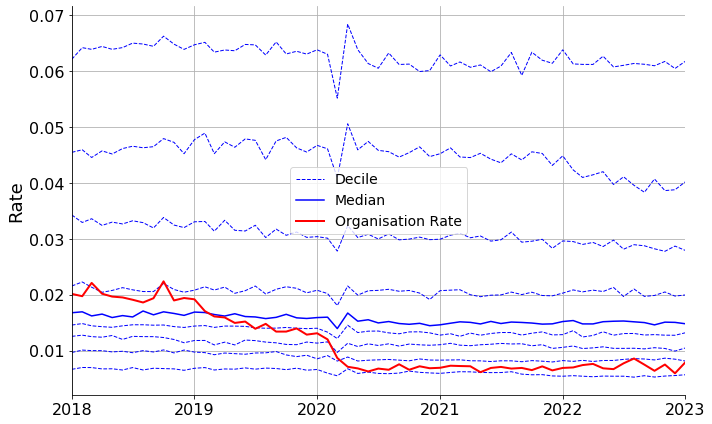

<h4><a href=https://openprescribing.net/measure/seven_day_prescribing/sicbl/99E>NHS BASILDON AND BRENTWOOD</a></h4>

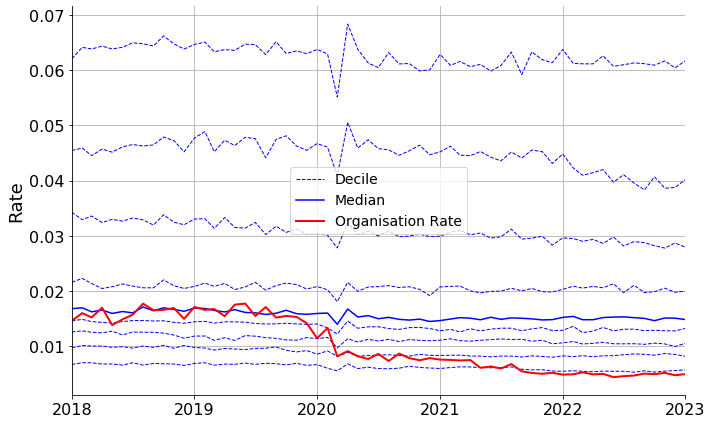

<h4><a href=https://openprescribing.net/measure/seven_day_prescribing/sicbl/99F>NHS CASTLE POINT AND ROCHFORD</a></h4>

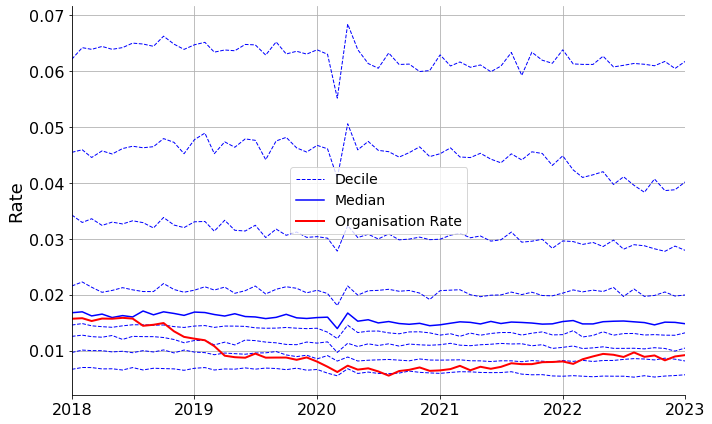

<h2 id=sildenafil><a href=https://openprescribing.net/measure/sildenafil>High-cost drugs for erectile dysfunction</a></h2>

<h4><a href=https://openprescribing.net/measure/sildenafil/sicbl/00L>NHS NORTHUMBERLAND</a></h4>

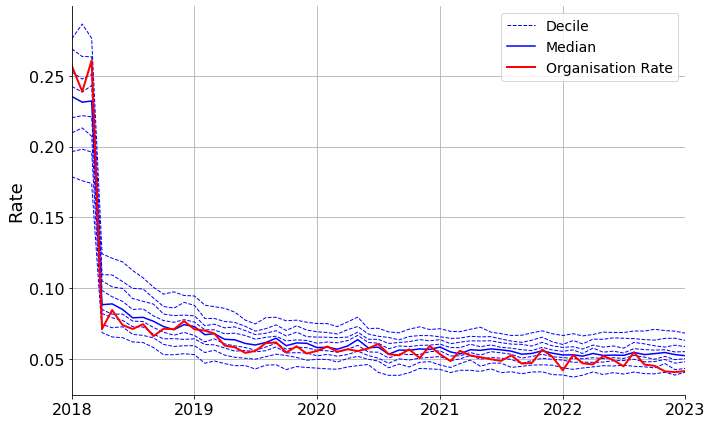

<h4><a href=https://openprescribing.net/measure/sildenafil/sicbl/00R>NHS BLACKPOOL</a></h4>

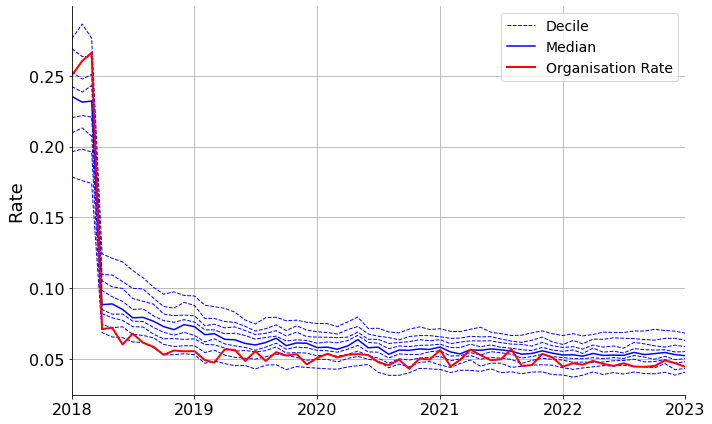

<h4><a href=https://openprescribing.net/measure/sildenafil/sicbl/01T>NHS SOUTH SEFTON</a></h4>

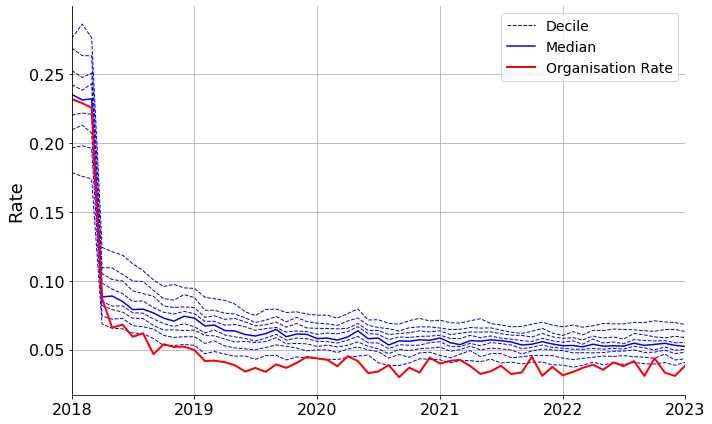

<h4><a href=https://openprescribing.net/measure/sildenafil/sicbl/01V>NHS SOUTHPORT AND FORMBY</a></h4>

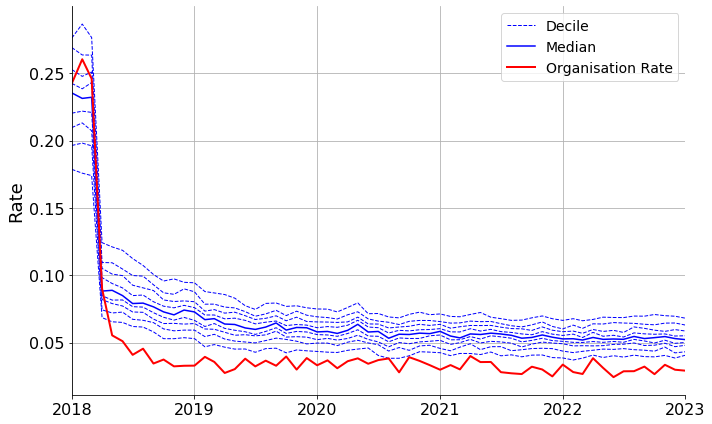

<h4><a href=https://openprescribing.net/measure/sildenafil/sicbl/01W>NHS STOCKPORT</a></h4>

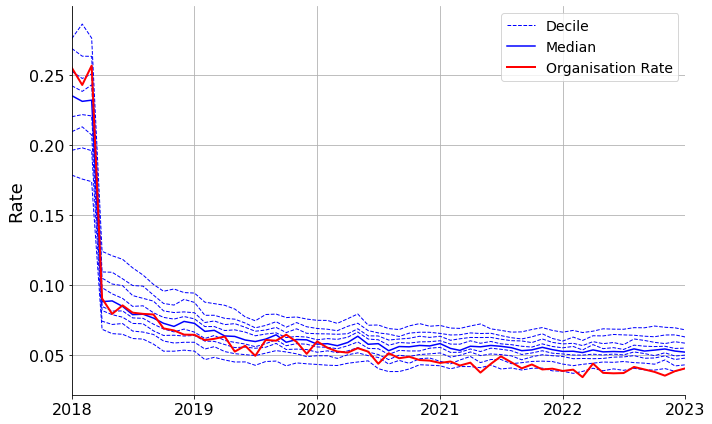

<h2 id=silver><a href=https://openprescribing.net/measure/silver>Silver dressings</a></h2>

<h4><a href=https://openprescribing.net/measure/silver/sicbl/13T>NHS NEWCASTLE GATESHEAD</a></h4>

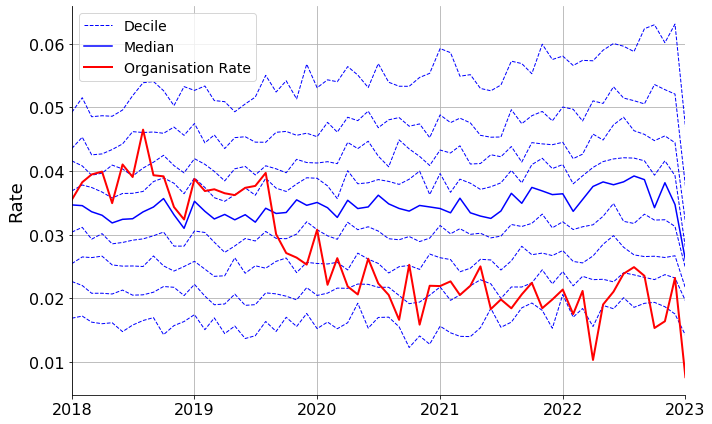

<h4><a href=https://openprescribing.net/measure/silver/sicbl/15M>NHS DERBY AND DERBYSHIRE</a></h4>

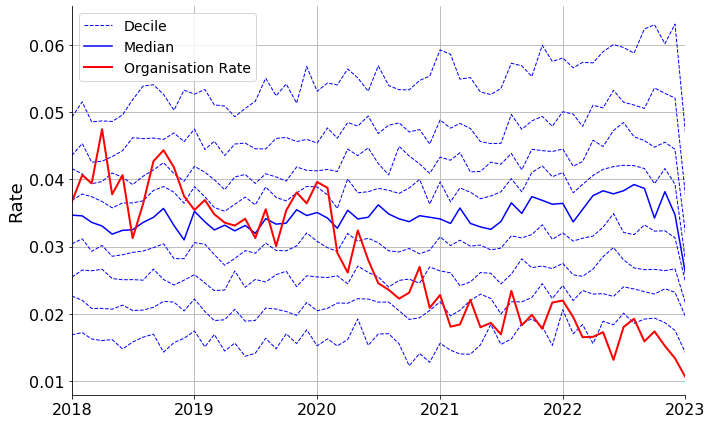

<h2 id=solublepara><a href=https://openprescribing.net/measure/solublepara>Soluble/effervescent forms of paracetamol and co-codamol</a></h2>

<h4><a href=https://openprescribing.net/measure/solublepara/sicbl/00R>NHS BLACKPOOL</a></h4>

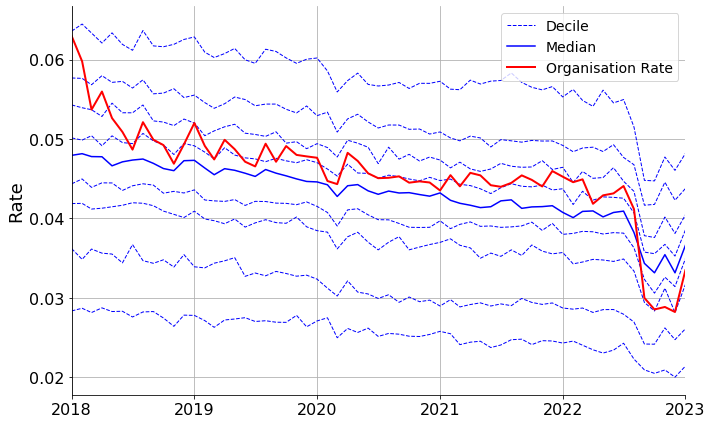

<h2 id=statinintensity><a href=https://openprescribing.net/measure/statinintensity>Low and medium intensity statins</a></h2>

<h4><a href=https://openprescribing.net/measure/statinintensity/sicbl/00R>NHS BLACKPOOL</a></h4>

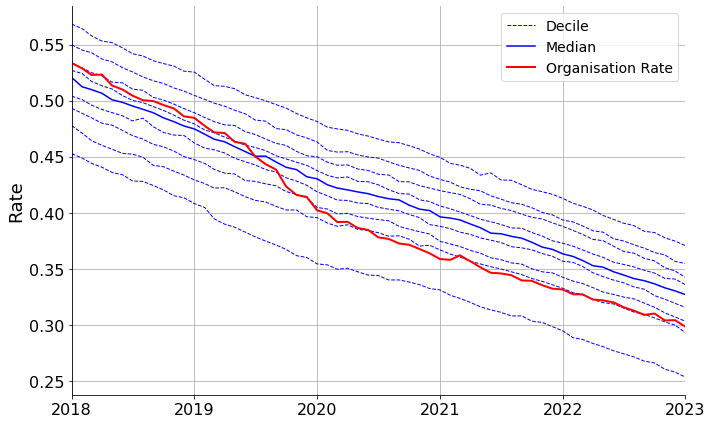

<h4><a href=https://openprescribing.net/measure/statinintensity/sicbl/01G>NHS SALFORD</a></h4>

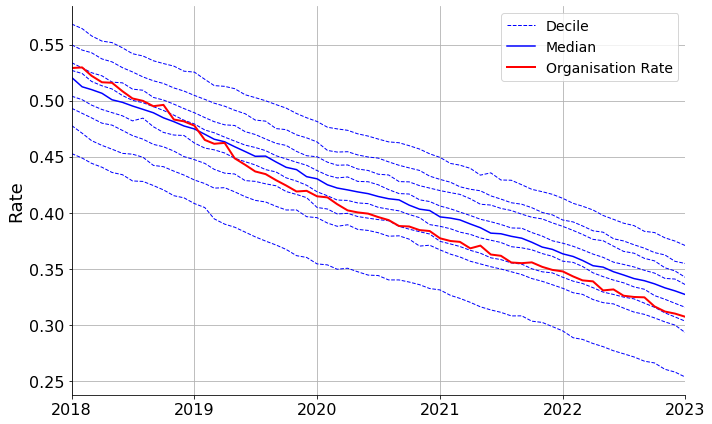

<h4><a href=https://openprescribing.net/measure/statinintensity/sicbl/02M>NHS FYLDE AND WYRE</a></h4>

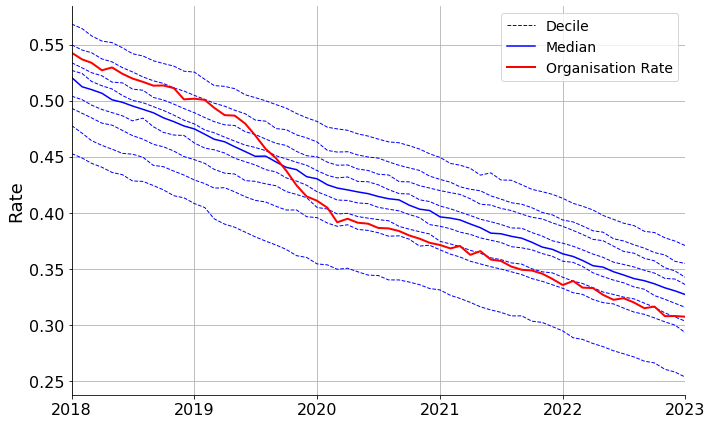

<h4><a href=https://openprescribing.net/measure/statinintensity/sicbl/03R>NHS WAKEFIELD</a></h4>

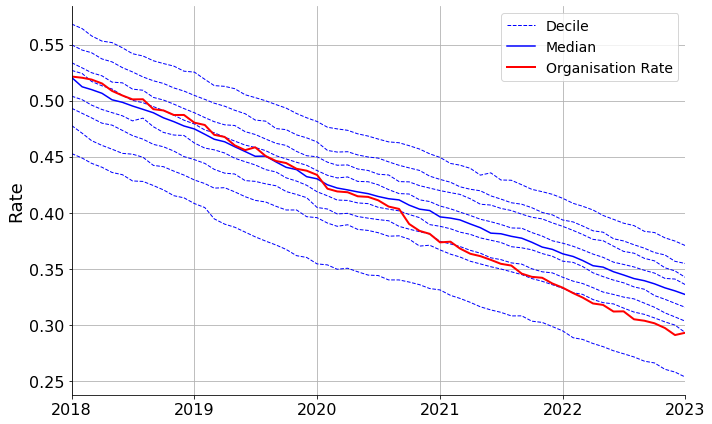

<h4><a href=https://openprescribing.net/measure/statinintensity/sicbl/06H>NHS CAMBRIDGESHIRE AND PETERBOROUGH</a></h4>

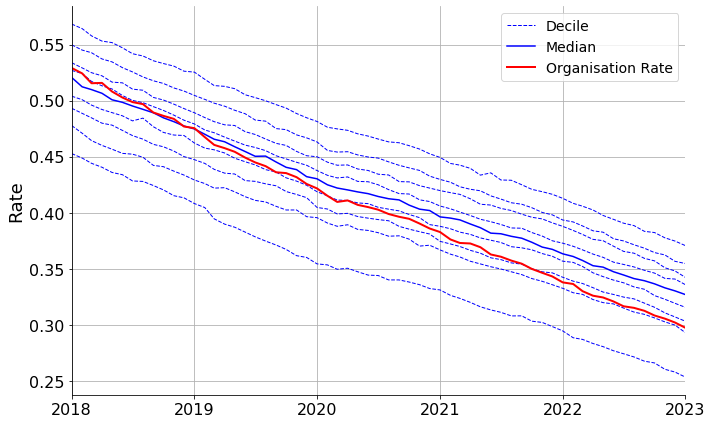

<h2 id=tamoxifen><a href=https://openprescribing.net/measure/tamoxifen>Prescribing of tamoxifen</a></h2>

<h4><a href=https://openprescribing.net/measure/tamoxifen/sicbl/03L>NHS ROTHERHAM</a></h4>

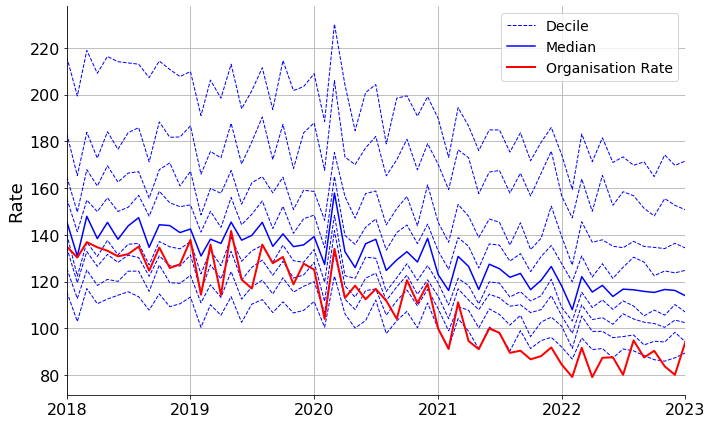

<h4><a href=https://openprescribing.net/measure/tamoxifen/sicbl/05D>NHS EAST STAFFORDSHIRE</a></h4>

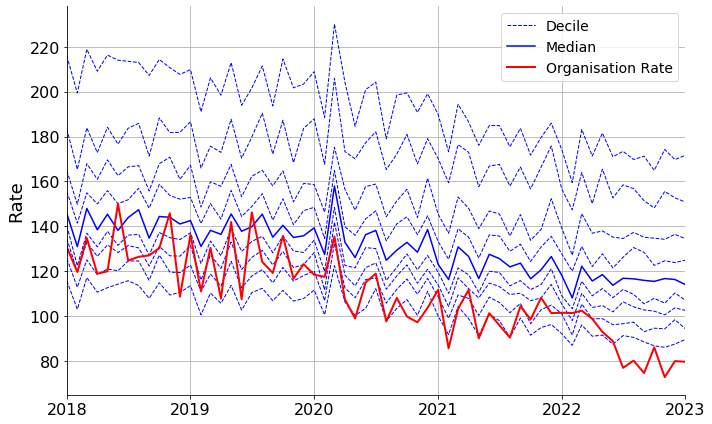

<h4><a href=https://openprescribing.net/measure/tamoxifen/sicbl/05Q>NHS SOUTH EAST STAFFORDSHIRE AND SEISDON PENINSULA</a></h4>

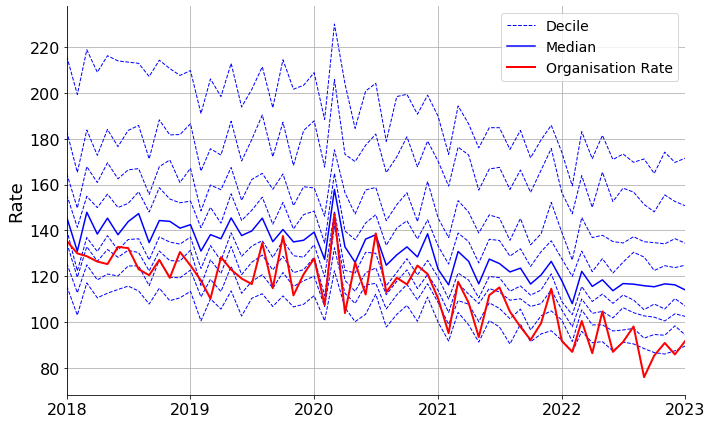

<h4><a href=https://openprescribing.net/measure/tamoxifen/sicbl/15M>NHS DERBY AND DERBYSHIRE</a></h4>

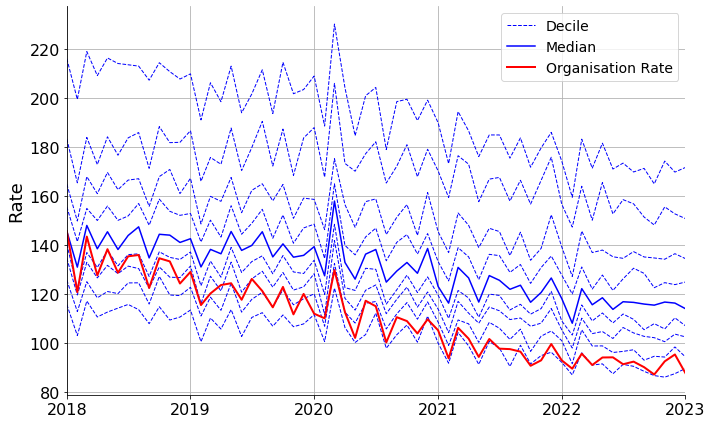

<h4><a href=https://openprescribing.net/measure/tamoxifen/sicbl/78H>NHS NORTHAMPTONSHIRE</a></h4>

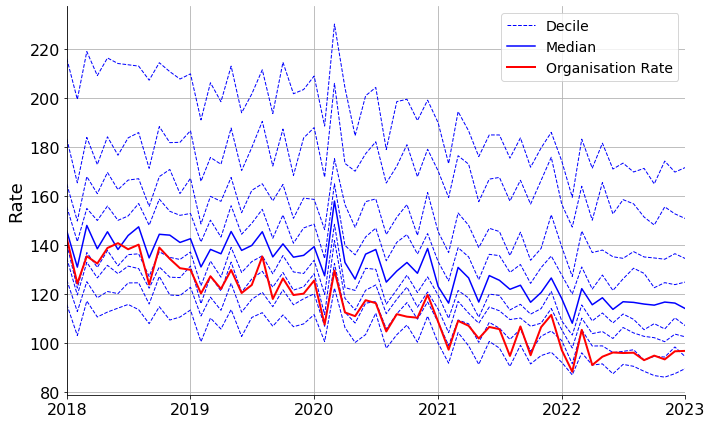

<h2 id=toothpaste><a href=https://openprescribing.net/measure/toothpaste>Toothpaste Prescribing</a></h2>

<h4><a href=https://openprescribing.net/measure/toothpaste/sicbl/07G>NHS THURROCK</a></h4>

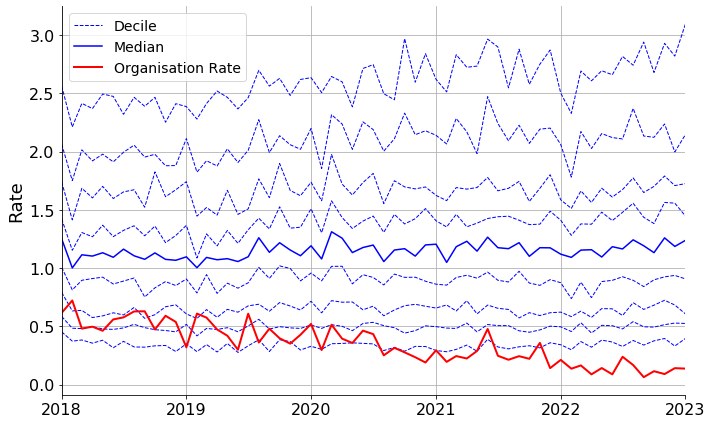

<h2 id=tramadol><a href=https://openprescribing.net/measure/tramadol>Prescribing of high cost tramadol preparations </a></h2>

No organisations identified for this measure.

<h2 id=trimethoprim><a href=https://openprescribing.net/measure/trimethoprim>Antibiotic stewardship: prescribing of trimethoprim vs nitrofurantoin</a></h2>

<h4><a href=https://openprescribing.net/measure/trimethoprim/sicbl/00Q>NHS BLACKBURN WITH DARWEN</a></h4>

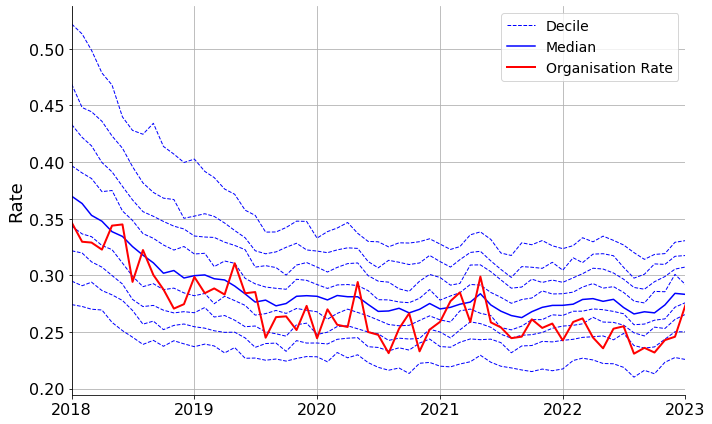

<h4><a href=https://openprescribing.net/measure/trimethoprim/sicbl/00X>NHS CHORLEY AND SOUTH RIBBLE</a></h4>

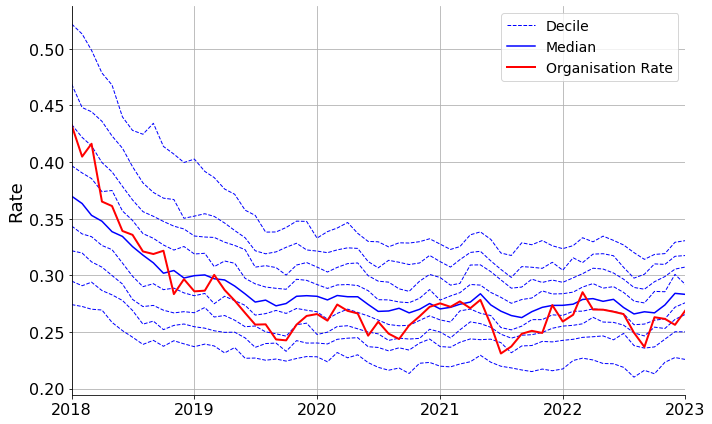

<h4><a href=https://openprescribing.net/measure/trimethoprim/sicbl/03N>NHS SHEFFIELD</a></h4>

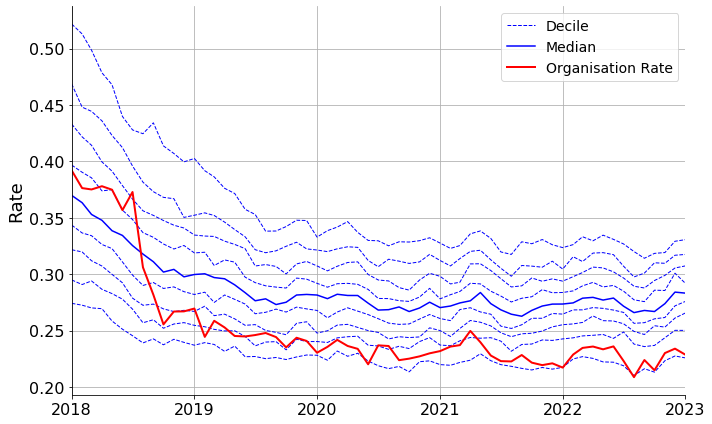

<h4><a href=https://openprescribing.net/measure/trimethoprim/sicbl/04C>NHS LEICESTER CITY</a></h4>

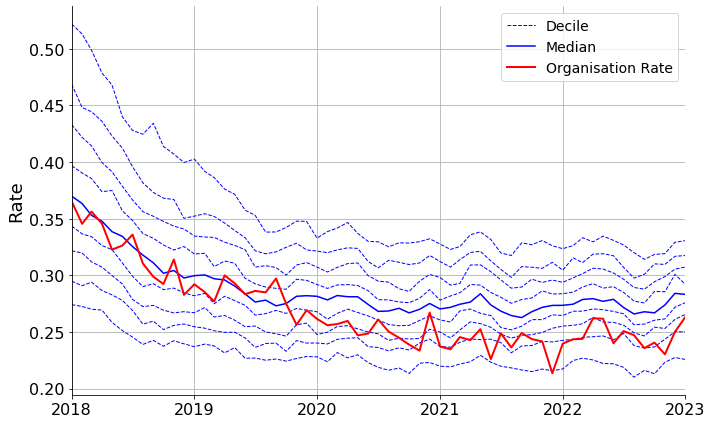

<h4><a href=https://openprescribing.net/measure/trimethoprim/sicbl/11X>NHS SOMERSET</a></h4>

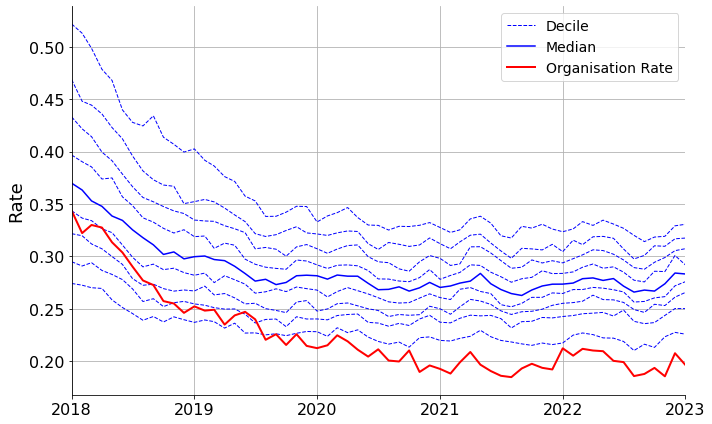

<h2 id=ulipristal><a href=https://openprescribing.net/measure/ulipristal>Ulipristal acetate 5mg prescribing for uterine fibroids</a></h2>

No organisations identified for this measure.

<h2 id=vitb><a href=https://openprescribing.net/measure/vitb>Vitamin B vs thiamine</a></h2>

<h4><a href=https://openprescribing.net/measure/vitb/sicbl/01F>NHS HALTON</a></h4>

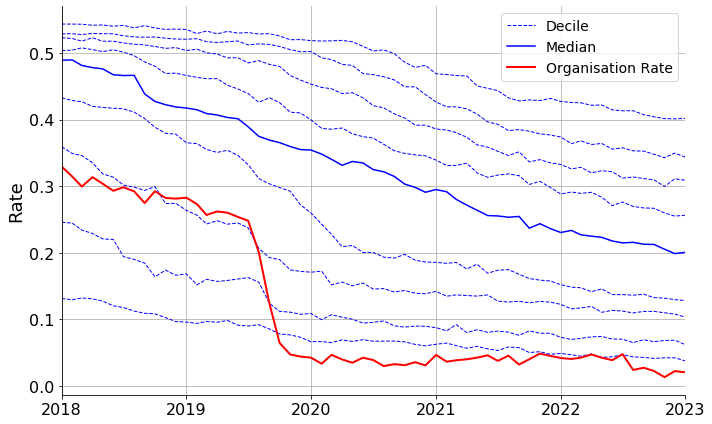

<h4><a href=https://openprescribing.net/measure/vitb/sicbl/01J>NHS KNOWSLEY</a></h4>

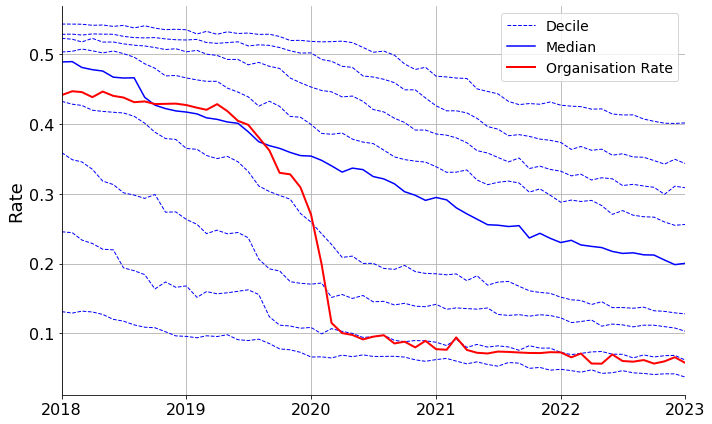

<h4><a href=https://openprescribing.net/measure/vitb/sicbl/01T>NHS SOUTH SEFTON</a></h4>

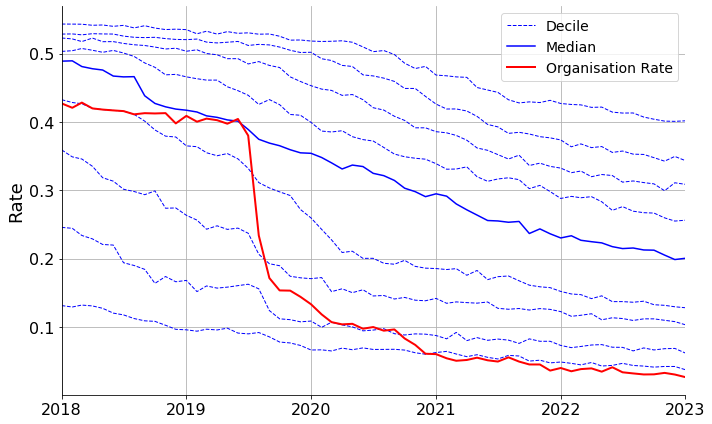

<h4><a href=https://openprescribing.net/measure/vitb/sicbl/01V>NHS SOUTHPORT AND FORMBY</a></h4>

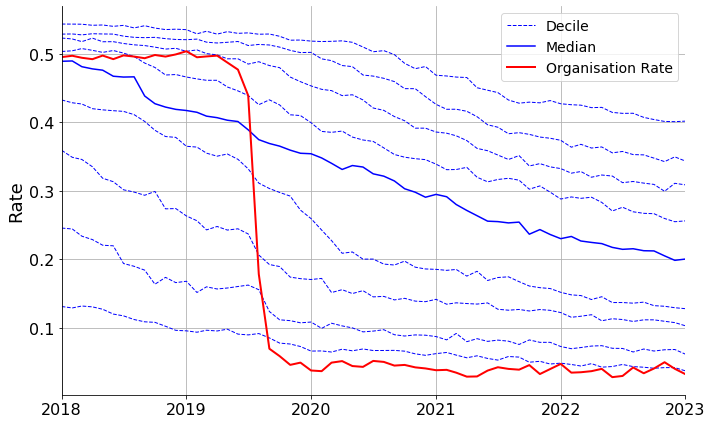

<h4><a href=https://openprescribing.net/measure/vitb/sicbl/01X>NHS ST HELENS</a></h4>

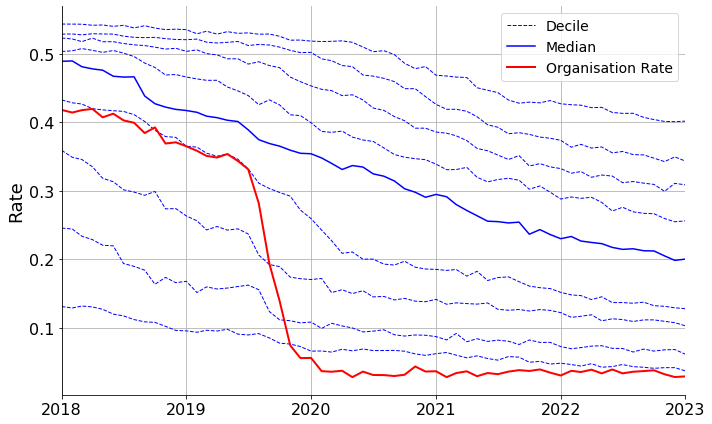

<h2 id=vitbper1000><a href=https://openprescribing.net/measure/vitbper1000>Vitamin B complex per 1000 patients</a></h2>

<h4><a href=https://openprescribing.net/measure/vitbper1000/sicbl/01F>NHS HALTON</a></h4>

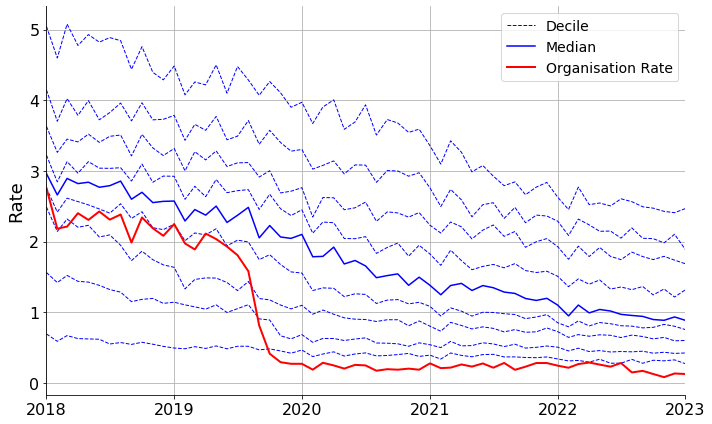

<h4><a href=https://openprescribing.net/measure/vitbper1000/sicbl/02E>NHS WARRINGTON</a></h4>

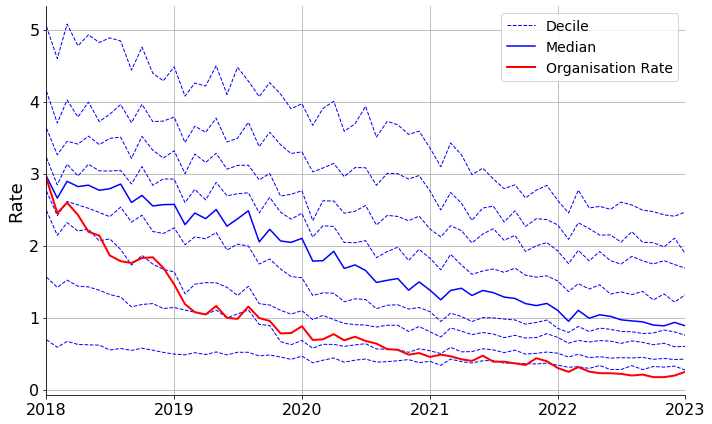

<h4><a href=https://openprescribing.net/measure/vitbper1000/sicbl/03L>NHS ROTHERHAM</a></h4>

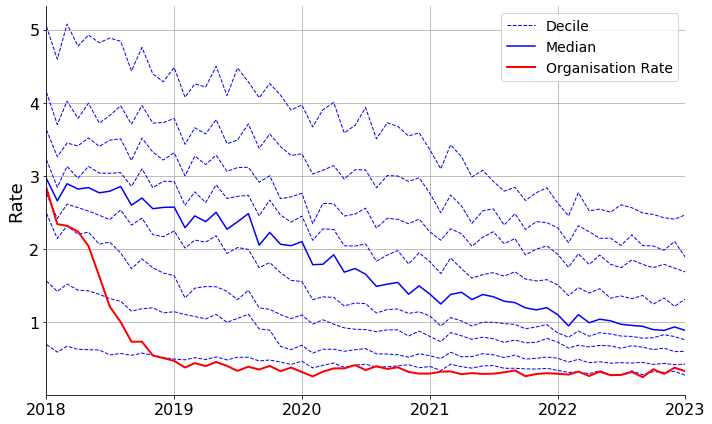

<h4><a href=https://openprescribing.net/measure/vitbper1000/sicbl/06N>NHS HERTS VALLEYS</a></h4>

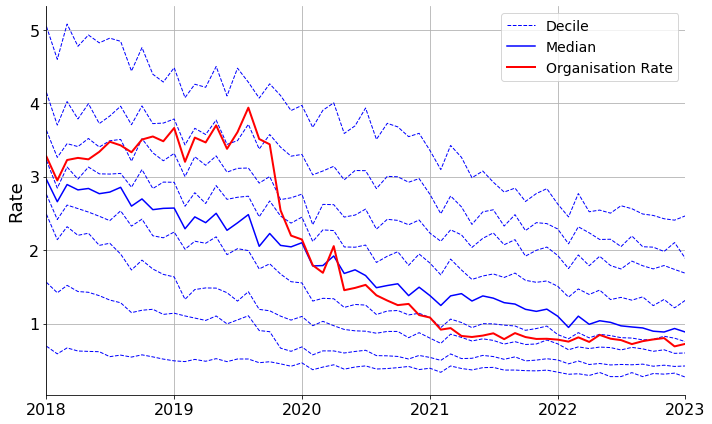

<h4><a href=https://openprescribing.net/measure/vitbper1000/sicbl/11J>NHS DORSET</a></h4>

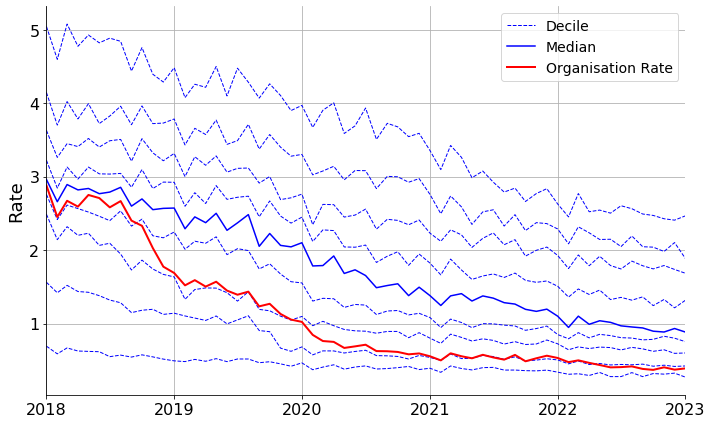

<h2 id=zuclopenthixol><a href=https://openprescribing.net/measure/zuclopenthixol>Zuclopenthixol acetate prescribing in primary care</a></h2>

No organisations identified for this measure.

In [6]:
display(Markdown('## Table of Contents'))

for m in measures:
    measure_link = f"https://openprescribing.net/measure/{m}"
    measure_description = measure_list.loc[measure_list["measure_name"] == m, "name"]
    if len(measure_description) > 0:
        measure_description=measure_description.iloc[0]
    
        display(Markdown(f'<a href=#{m}>- {measure_description}</a>'))
        
        
for m in measures:
    
    measure_link = f"https://openprescribing.net/measure/{m}"
    measure_description = measure_list.loc[measure_list["measure_name"] == m, "name"]
    if len(measure_description) > 0:
        measure_description=measure_description.iloc[0]
        
        display(Markdown(f'<h2 id={m}><a href={measure_link}>{measure_description}</a></h2>'))
        data = pd.read_csv(DATA_FOLDER / f'ccg_data_{m}/bq_cache.csv', parse_dates=["month"])
        data["rate"] = data["numerator"]/data["denominator"]

        cd_data = pd.read_csv(DATA_FOLDER / f'ccg_data_{m}/r_output.csv')


        data["percentile"] = data.groupby(["month"])["rate"].rank(pct=True)
    
        deciles = compute_deciles(data, "month", "rate")

        processor = DataFrameProcessor(data, cd_data, config, verbose=config.get('show_filter_results', False))
        filtered_ccgs = processor.apply_combined_filters()


        num_orgs_identified = len(filtered_ccgs)
        # Main loop to plot CCG data
        if num_orgs_identified > 0:
#             display(Markdown(f"Number of organisations with improvement identified: {num_orgs_identified}"))
            for ccg in filtered_ccgs:
                sicbl_link = f"https://openprescribing.net/measure/{m}/sicbl/{ccg}"
                ccg_name = ccg_names.loc[ccg_names["code"]==ccg, "name"].values[0]
                display(Markdown(f'<h4><a href={sicbl_link}>{ccg_name}</a></h4>'))
                fig = plot_org_data(ccg, data, deciles, cd_data, show_cd=config.get('show_cd', False))
                
             
        else:
            display(Markdown("No organisations met the technical criteria for detecting substantial change on this measure."))